In [107]:
num_samples=10000

In [108]:
!ls -la pickle

total 73784
drwxr-xr-x 2 root root     4096 Feb 17 23:16 .
drwxr-xr-x 7 root root     4096 Feb 24 18:58 ..
-rw-r--r-- 1 root root  3160404 Dec 18 10:32 X_mf_test
-rw-r--r-- 1 root root 28437564 Dec 18 10:32 X_mf_train
-rw-r--r-- 1 root root   500428 Feb 24 18:56 big_my_data
-rw-r--r-- 1 root root        0 Dec 18 10:32 exp
-rw-r--r-- 1 root root 21180451 Feb  4 14:42 filtered_lens
-rw-r--r-- 1 root root 21180451 Nov 20 10:58 filtered_lens.pkl
-rw-r--r-- 1 root root    66304 Dec 25 09:34 fm
-rw-r--r-- 1 root root      818 Feb 24 18:56 my_data
-rw-r--r-- 1 root root   715399 Feb 24 18:56 one_diff_data
-rw-r--r-- 1 root root    80641 Dec 18 10:32 v
-rw-r--r-- 1 root root    20026 Dec 18 10:32 y_mf_test
-rw-r--r-- 1 root root   180168 Dec 18 10:32 y_mf_train


In [109]:
# ライブラリ
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
import numpy as np
import scipy as sp
from fastFM import als
from sklearn.feature_extraction import DictVectorizer
import pandas as pd

In [110]:
import sys
import pprint

pprint.pprint(sys.path)

['',
 '/usr/lib/python36.zip',
 '/usr/lib/python3.6',
 '/usr/lib/python3.6/lib-dynload',
 '/usr/local/lib/python3.6/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.6/dist-packages/IPython/extensions',
 '/root/.ipython']


In [111]:
import lime
lime.__file__

'/usr/local/lib/python3.6/dist-packages/lime/__init__.py'

In [112]:
!pwd

/root/ml-at-work/chap07


In [113]:
import pickle

In [114]:
!ls -la ./pickle

total 73784
drwxr-xr-x 2 root root     4096 Feb 17 23:16 .
drwxr-xr-x 7 root root     4096 Feb 24 18:58 ..
-rw-r--r-- 1 root root  3160404 Dec 18 10:32 X_mf_test
-rw-r--r-- 1 root root 28437564 Dec 18 10:32 X_mf_train
-rw-r--r-- 1 root root   500428 Feb 24 18:56 big_my_data
-rw-r--r-- 1 root root        0 Dec 18 10:32 exp
-rw-r--r-- 1 root root 21180451 Feb  4 14:42 filtered_lens
-rw-r--r-- 1 root root 21180451 Nov 20 10:58 filtered_lens.pkl
-rw-r--r-- 1 root root    66304 Dec 25 09:34 fm
-rw-r--r-- 1 root root      818 Feb 24 18:56 my_data
-rw-r--r-- 1 root root   715399 Feb 24 18:56 one_diff_data
-rw-r--r-- 1 root root    80641 Dec 18 10:32 v
-rw-r--r-- 1 root root    20026 Dec 18 10:32 y_mf_test
-rw-r--r-- 1 root root   180168 Dec 18 10:32 y_mf_train


In [115]:
with open('./pickle/fm', 'rb') as f:
  fm = pickle.load(f)

In [116]:
with open('./pickle/X_mf_test', 'rb') as f:
  X_mf_test = pickle.load(f)

In [117]:
with open('./pickle/X_mf_train', 'rb') as f:
  X_mf_train = pickle.load(f)

In [118]:
with open('./pickle/filtered_lens', 'rb') as f:
  filtered_lens = pickle.load(f)

In [119]:
with open('./pickle/y_mf_test', 'rb') as f:
  y_mf_test = pickle.load(f)

In [120]:
with open('./pickle/y_mf_train', 'rb') as f:
  y_mf_train = pickle.load(f)

In [121]:
with open('./pickle/v', 'rb') as f:
  v = pickle.load(f)

In [122]:
feature_names = np.array(v.get_feature_names())

In [123]:
np.set_printoptions(threshold=3000)

In [124]:
print(feature_names)

['Action' 'Adventure' 'Animation' "Children's" 'Comedy' 'Crime'
 'Documentary' 'Drama' 'Fantasy' 'Film-Noir' 'Horror' 'Musical' 'Mystery'
 'Romance' 'Sci-Fi' 'Thriller' 'War' 'Western' 'age' 'movie_id=1'
 'movie_id=10' 'movie_id=100' 'movie_id=1000' 'movie_id=1001'
 'movie_id=1002' 'movie_id=1003' 'movie_id=1004' 'movie_id=1005'
 'movie_id=1006' 'movie_id=1007' 'movie_id=1008' 'movie_id=1009'
 'movie_id=101' 'movie_id=1010' 'movie_id=1011' 'movie_id=1012'
 'movie_id=1013' 'movie_id=1014' 'movie_id=1015' 'movie_id=1016'
 'movie_id=1017' 'movie_id=1018' 'movie_id=1019' 'movie_id=102'
 'movie_id=1020' 'movie_id=1021' 'movie_id=1022' 'movie_id=1023'
 'movie_id=1024' 'movie_id=1025' 'movie_id=1026' 'movie_id=1027'
 'movie_id=1028' 'movie_id=1029' 'movie_id=103' 'movie_id=1030'
 'movie_id=1031' 'movie_id=1032' 'movie_id=1033' 'movie_id=1034'
 'movie_id=1035' 'movie_id=1036' 'movie_id=1037' 'movie_id=1038'
 'movie_id=1039' 'movie_id=104' 'movie_id=1040' 'movie_id=1041'
 'movie_id=1042' 'movie

In [125]:
test_categorical_features = []
for i in range(0,len(feature_names)):
    test_categorical_features.append(i)

In [126]:
import lime
import lime.lime_tabular
import numpy as np
explainer = lime.lime_tabular.LimeTabularExplainer(X_mf_test, feature_names=feature_names,
                                                   class_names=['No','Yes'], 
                                                   verbose=True, 
                                                   #categorical_names=(18),#csrのインデックスをしていする
                                                   mode='regression',
                                                   random_state=0
                                                  )

In [127]:
v.inverse_transform(X_mf_test[0])

[{'Comedy': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0}]

In [128]:
v.inverse_transform(X_mf_test[1])

[{'Animation': 1.0,
  "Children's": 1.0,
  'Comedy': 1.0,
  'age': 25.0,
  'movie_id=1': 1.0,
  'occupation=administrator': 1.0,
  'release_year=1995': 1.0,
  'sex=M': 1.0,
  'user_id=394': 1.0,
  'year=1997': 1.0}]

In [129]:
print(X_mf_test[0])

  (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	1.0
  (0, 1714)	1.0
  (0, 1791)	1.0
  (0, 1793)	1.0
  (0, 1794)	0.0
  (0, 2435)	1.0
  (0, 2739)	1.0


In [130]:
print(X_mf_test.__len__)

<bound method spmatrix.__len__ of <10000x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 260000 stored elements in Compressed Sparse Row format>>


In [131]:
exp = explainer.explain_instance(X_mf_test[0], fm.predict,num_features=10,num_samples=5000)

Intercept 3.448043487124001
Prediction_local [3.24171183]
Right: 2.6729075367865933


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [132]:
exp.show_in_notebook(show_table=True)

In [133]:
exp.as_list()

[('release_year=1998', -0.4855910206007823),
 ('Comedy', -0.329941186222777),
 ('sex=M', 0.32097229479547057),
 ('year=1998', -0.20653191775958243),
 ('occupation=programmer', -0.14359589020131938),
 ('user_id=676', -0.021826979027835515),
 ('movie_id=1527', -0.008390323486214064),
 ('age', -1.5731967153774672e-05),
 ('Adventure', 0.0),
 ('Animation', 0.0)]

In [134]:
exp.score

0.6969542825417016

num_samples=10

0.32106889381026793

num_samples=100

0.41209769972635013


"num_samples=1000"のときの決定係数

0.607688854403305


"num_samples=10000"のときの決定係数

0.7323523033573371


"num_samples=10000"のときかつ、categorical_names=(18)でageを指定したときの決定係数

0.7245713474424902


"num_samples=1,000,000"のときかつ、categorical_names=(18)でageを指定したときの決定係数

0.7819948843342619



"num_samples=2"

0.403661187501517

### サンプル数への誤解

expの引数でコントロールするものだった。'num_samples=5000'0.7194713403456157

自分がサンプル数だとおもっていたのは、学習用データの数だった。

### 望ましい結果とは
[{'Comedy': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0}]

これらを、改変する。

### コード理解

In [135]:
data_row = X_mf_test[0]

In [136]:
is_sparse = sp.sparse.issparse(data_row)

In [137]:
is_sparse

True

In [138]:
#num_samples = 1000
if is_sparse:#trueになる
    num_cols = data_row.shape[1]
    data = sp.sparse.csr_matrix((num_samples, num_cols), dtype=data_row.dtype)

In [139]:
num_cols

2740

In [140]:
#len(v.inverse_transform(data))

In [141]:
#data[0] = data_row.copy()
#inverse = data.copy()

In [142]:
#print(inverse)

In [143]:
data_row.nonzero()[1]

array([   4,   18,  606, 1714, 1791, 1793, 2435, 2739], dtype=int32)

In [144]:
categorical_features = range(num_cols)

In [145]:
categorical_features

range(0, 2740)

In [146]:
categorical_features = list(range(X_mf_test.shape[1]))

In [147]:
categorical_features

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [148]:
data_row.todense()

matrix([[ 0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0., 30.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,

# mylime
改造したlime

dataの摂動の際に、random.normalで01間の正規分布に従ったランダムデータを生成してそのあと追加する部分を、randintにかえた。
あまり意味はないっぽい。

In [149]:
import mylime as mylime

In [150]:
import mylime.my_lime_tabular

In [151]:
# モジュールの再読み込み　ソースコードの変更のため
import importlib
importlib.reload(mylime)
importlib.reload(mylime.my_lime_tabular)

<module 'mylime.my_lime_tabular' from '/root/ml-at-work/chap07/mylime/my_lime_tabular.py'>

In [152]:
myexplainer = mylime.my_lime_tabular.LimeTabularExplainer(X_mf_test, feature_names=feature_names,
                                                   class_names=['No','Yes'], 
                                                   verbose=True, 
                                                   #categorical_features=(1),#csrのインデックスをしていする
                                                   mode='regression',
                                                   random_state=0
                                                  )

In [153]:
import pandas as pd

#現在の最大表示行数の出力
pd.get_option("display.max_rows")

#最大表示行数の指定（ここでは50行を指定）
pd.set_option('display.max_rows', 50)

In [154]:
myexp = myexplainer.explain_instance(X_mf_test[0], fm.predict,num_features=10,num_samples=10)

data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]
non_zero_indexes  [   4   18  606 1714 1791 1793 2435 2739]
inverse type 
 <class 'scipy.sparse.csr.csr_matrix'>
data[1] len 
 <bound method spmatrix.__len__ of <1x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 8 stored elements in Compressed Sparse Row format>>
data[1] data 

   (0, 4)	0.2983
  (0, 18)	32.7446
  (0, 606)	0.0002
  (0, 1714)	0.0781
  (0, 1791)	0.0097
  (0, 1793)	0.7442
  (0, 2435)	0.0008
  (0, 2739)	0.4751
inverse type 
 <class 'scipy.sparse.csr.csr_matr

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [155]:
myexp.show_in_notebook(show_table=True)

In [156]:
myexp.score

0.2994678257372939

categorical_features = range(

のとき

0.607688854403305



normal(0,1,をrandintに変更して、正規分布から01のランダムに変更した結果。そのあとに加わるdata + scale +mean 

0.39052552688438985



num_samples=100000

0.39139163876432165


num_samples=10

0.2994678257372939


num_samples=100

0.38261511147830063



In [157]:
for i in []:
    print(i)

In [158]:
data_row.shape[1]

2740

In [159]:
data_row.shape[0]

1

# 結論

決定係数は、01の変化にしたほうが、悪くなった。

しかし、これはそのあとに、scale+meanが加わっている。

次は、dataを手で作る。

In [160]:
v.inverse_transform(X_mf_test[0])

[{'Comedy': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0}]

In [161]:
# randint
print(np.random.randint(0,1,8000).reshape(1000, 8)[100])

[0 0 0 0 0 0 0 0]


In [162]:
np.random.randint(0, 2)

1

# mylime2
01のみの変化

In [163]:
import mylime as mylime
import mylime.my_lime_01

In [164]:
# モジュールの再読み込み　ソースコードの変更のため
import importlib
importlib.reload(mylime)
importlib.reload(mylime.my_lime_01)

<module 'mylime.my_lime_01' from '/root/ml-at-work/chap07/mylime/my_lime_01.py'>

In [165]:
myexplainer01 = mylime.my_lime_01.LimeTabularExplainer(X_mf_test, feature_names=feature_names,
                                                   class_names=['No','Yes'], 
                                                   verbose=True, 
                                                   #categorical_features=(1),#csrのインデックスをしていする
                                                   mode='regression',
                                                   random_state=0
                                                  )

In [166]:
myexp01 = myexplainer01.explain_instance(X_mf_test[0], fm.predict,num_features=10,num_samples=100)

data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 1 1 0 1 1 1 1]
 [1 1 1 0 0 1 0 0]
 [0 0 0 1 0 1 1 0]
 [0 1 1 1 1 0 1 0]
 [1 0 1 1 0 1 1 0]
 [0 1 0 1 1 1 1 1]
 [0 1 0 1 1 1 1 0]
 [1 0 0 1 1 0 1 0]
 [1 0 0 0 0 0 1 1]
 [0 0 0 1 1 0 1 0]
 [0 1 0 1 1 1 1 1]
 [1 0 1 1 0 0 1 0]
 [0 1 1 0 1 0 0 1]
 [0 0 0 1 1 0 1 0]
 [0 0 0 0 1 0 1 0]
 [1 1 1 1 1 0 1 1]
 [1 1 0 1 1 0 0 1]
 [0 0 0 0 1 1 0 0]
 [1 0 1 1 1 1 0 0]
 [0 1 0 1 1 1 0 1]
 [0 0 1 0 1 1 0 0]
 [1 0 1 0 1 0 1 0]
 [1 0 0 0 1 0 1 0]
 [1 0 0 0 0 0 1 0]
 [0 1 0 0 0 1 0 0]
 [1 0 1 0 0 1 1 0]
 [0 0 1 1 0 0 0 0]
 [0 1 0 1 0 0 0 1]
 [1 1 0 0 1 1 1 1]
 [0 0 0 1 1 0 1 0]
 [0 1 0 1 1 1 1 0]
 [0 0 1 1 1 0 1 1]
 [1 1 0 0 1 1 0 0]
 [0 1 1 0 1 1 1 1]
 [1 0 0 0 1 0 1 0]
 [1 1 0 0 0 1 0 0]
 [1 1 1 1 0 1 0 0]
 [0 0 1 1 1 0 1 0]
 [0 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1]
 [1 1 1 0 0 0 0 1]
 [1 1 0 1 1 1 1 1]
 [1 1 0 0 0 0 1 1]
 [0 1 0 0 1 0 1 0]
 [1 0 0 0 0 1 1 1]
 [0 1 0 1 0 0 0 0]
 [1 1 1 0 1 0 0 1]
 [1 1 0 1 1 0 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [167]:
myexp01.show_in_notebook(show_table=True)

In [168]:
myexp01.score

0.0

# 実験結果

data 01のみ、data = data * scale + mean

0.27995358032797735


data 01のみ、data = data 

0.0

# 自分でデータを作る。
自動で生成するのは、次の段階として、今は10件ほど作って、挿入して動くか確かめる。

In [169]:
my_data = [{'Comedy': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0},
 {'Action': 1.0,
  'age': 30.0,
  'movie_id=1277': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1997': 1.0,
  'sex=F': 1.0,
  'user_id=364': 1.0,
  'year=1997': 1.0},
 {'Adventure': 1.0,
  'age': 30.0,
  'movie_id=1287': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1997': 1.0,
  'sex=M': 1.0,
  'user_id=129': 1.0,
  'year=1997': 1.0},
  {'Comedy': 1.0,
  'age': 31.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0}]

In [170]:
#my_data2

In [171]:
my_data = [{'Comedy': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0},
{'Comedy': 1.0,
  'age': 31.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0},
{'Comedy': 0.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0},
{'Comedy': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=F': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0}]

In [172]:
my_data = v.transform(my_data)

In [173]:
print(my_data)

  (0, 4)	1.0
  (0, 18)	30.0
  (0, 606)	1.0
  (0, 1714)	1.0
  (0, 1791)	1.0
  (0, 1793)	1.0
  (0, 2435)	1.0
  (0, 2739)	1.0
  (1, 4)	1.0
  (1, 18)	31.0
  (1, 606)	1.0
  (1, 1714)	1.0
  (1, 1791)	1.0
  (1, 1793)	1.0
  (1, 2435)	1.0
  (1, 2739)	1.0
  (2, 4)	0.0
  (2, 18)	30.0
  (2, 606)	1.0
  (2, 1714)	1.0
  (2, 1791)	1.0
  (2, 1793)	1.0
  (2, 2435)	1.0
  (2, 2739)	1.0
  (3, 4)	1.0
  (3, 18)	30.0
  (3, 606)	1.0
  (3, 1714)	1.0
  (3, 1791)	1.0
  (3, 1792)	1.0
  (3, 2435)	1.0
  (3, 2739)	1.0


In [174]:
len(my_data.todense())

4

In [175]:
# 保存して、読み込めるようにする
import pickle
with open('./pickle/my_data', 'wb') as f:
  pickle.dump(my_data, f)

In [176]:
!pwd

/root/ml-at-work/chap07


In [177]:
# /root/ml-at-work/chap07/pickle/my_data
#import pickle
#with open('/root/ml-at-work/chap07/pickle/my_data', 'rb') as f:
#  my_data = pickle.load(f)

In [178]:
import mylime as mylime
import mylime.my_lime_my_data

In [179]:
# モジュールの再読み込み　ソースコードの変更のため
import importlib
importlib.reload(mylime)
importlib.reload(mylime.my_lime_my_data)

<module 'mylime.my_lime_my_data' from '/root/ml-at-work/chap07/mylime/my_lime_my_data.py'>

In [180]:
myexplainer_my_data = mylime.my_lime_my_data.LimeTabularExplainer(X_mf_test, feature_names=feature_names,
                                                   class_names=['No','Yes'], 
                                                   verbose=True, 
                                                   #categorical_features=(1),#csrのインデックスをしていする
                                                   mode='regression',
                                                   random_state=0
                                                  )

In [181]:
myexpmydata = myexplainer_my_data.explain_instance(X_mf_test[0], fm.predict,num_features=10,num_samples=len(my_data.todense()))

data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]
non_zero_indexes  [   4   18  606 1714 1791 1793 2435 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 50 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	1.0
  (0, 1714)	1.0
  (0, 1791)	1.0
  (0, 1793)	1.0
  (0, 1794)	0.0
  (0, 2435)	1.0
  (0, 2739)	1.0
  (1, 4)	1.0
  (1, 18)	31.0
  (1, 606)	1.0
  (1, 1714)	1.0
  (1

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [182]:
myexpmydata.show_in_notebook(show_table=True)

In [183]:
myexpmydata.score

0.2887916018923835

自作データでできた。


data2個で

0.24677169063696092

data3個で

0.25078151609763977


data4個、一つ、少しだけ変えるだけ

0.2887916018923835

# my_data_bigを作る。


In [184]:
movie_id_list = filtered_lens.loc[:,["movie_id"]]
user_id_list = filtered_lens.loc[:,["user_id"]]
age_list = filtered_lens.loc[:,["age"]]
occupation_list = filtered_lens.loc[:,["occupation"]]
release_year_list = filtered_lens.loc[:,["release_year"]]
year_list = filtered_lens.loc[:,["year"]]

In [185]:
#ジャンル
genre_list = ['Action' ,'Adventure', 'Animation', "Children's", 'Comedy' ,
              'Crime'  ,'Documentary' ,'Drama' ,'Fantasy', 'Film-Noir',
              'Horror' ,'Musical' ,'Mystery', 'Romance', 'Sci-Fi' ,
              'Thriller', 'War' ,'Western' ]

In [186]:
num_samples=5000

例
```
['Comedy': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=676': 1.0,
  'year=1998': 1.0}]
  
  
  ```

In [187]:
big_my_data = []
for i in range(num_samples):
    user_id = int(user_id_list.iloc[np.random.randint(0,len(user_id_list))])
    movie_id = int(movie_id_list.iloc[np.random.randint(0,len(movie_id_list))])
    genre = np.random.choice(genre_list)
    age =   int(age_list.iloc[np.random.randint(0,len(age_list))])
    occupation = occupation_list.iloc[np.random.randint(0,len(occupation_list))]
    release_year = int(release_year_list.iloc[np.random.randint(0,len(release_year_list))])
    sex = np.random.choice(["sex=M","sex=F"])
    year = int(year_list.iloc[np.random.randint(0,len(year_list))])
    tmp = {
       genre:1.0,#ジャンル
       "age":int(age),
       "movie_id="+str(movie_id):1.0,
       "occupation="+occupation[0]:1.0,
       "release_year="+str(release_year):1.0,
       sex:1.0,
       "user_id="+str(user_id):1.0,
       "year="+str(year):1.0,           
          }
    big_my_data.append(tmp)

In [188]:
big_my_data = v.transform(big_my_data)

In [189]:
big_my_data[0:num_samples]

<5000x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 40000 stored elements in Compressed Sparse Row format>

In [190]:
# 保存して、読み込めるようにする
import pickle
with open('./pickle/big_my_data', 'wb') as f:
  pickle.dump(big_my_data, f)

# my_data_bigを実行する


In [191]:
import mylime as mylime
import mylime.my_lime_big_data

In [192]:
# モジュールの再読み込み　ソースコードの変更のため
import importlib
importlib.reload(mylime)
importlib.reload(mylime.my_lime_big_data)

<module 'mylime.my_lime_big_data' from '/root/ml-at-work/chap07/mylime/my_lime_big_data.py'>

In [193]:
explainer_big = mylime.my_lime_big_data.LimeTabularExplainer(X_mf_test, feature_names=feature_names,
                                                   class_names=['No','Yes'], 
                                                   verbose=True, 
                                                   #categorical_features=(1),#csrのインデックスをしていする
                                                   mode='regression',
                                                   random_state=0
                                                  )

In [194]:
print(num_samples)

5000


In [195]:
expbig = explainer_big.explain_instance(X_mf_test[0], fm.predict,num_features=10,num_samples=num_samples)

data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  606 1714 1791 1793 2435 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5000x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 40022 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	1.0
  (0, 1146)	0.0
  (0, 1703)	0.0
  (0, 1714)	1.0
  (0, 1763)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


Intercept 3.4334846977702034
Prediction_local [3.54310087]
Right: 5.302015116600979


In [196]:
expbig.show_in_notebook(show_table=True)

In [197]:
expbig.score

0.019331507889893018

num_sample=1000

0.050307830473046544


num_sample=10

0.11809410249199626

num_samples=10000

0.08447423041107027


# 問題点
ランダムに、8つの変数を変えているので、基準点から最大８要素離れてしまう。


1. ランダムに一つだけ変える。
2. 正規分布に従って、変える変数の数を増減させる。

### 一つづつしか変わらない

In [198]:
#基準点
data_row

<1x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 26 stored elements in Compressed Sparse Row format>

In [199]:
v.inverse_transform(data_row)[0].keys()

dict_keys(['Comedy', 'age', 'movie_id=1527', 'occupation=programmer', 'release_year=1998', 'sex=M', 'user_id=676', 'year=1998'])

In [200]:
one = np.random.choice(list(v.inverse_transform(data_row)[0].keys()))
if "year=" in  one :
    if "release_year" in one:
        print("release_year=",one)
    else:
        print("year=",one)
elif "sex" in one:
    print("sex=",one)
elif "age" in one :
    print("age=",one)
elif "user_id" in one:
    print("user_id=",one)    
elif "movie_id" in one:
    print("movie_id=",one)    
elif "occupation" in one:
    print("occupation=",one)
elif one in genre_list :
    print("genre=",one)

movie_id= movie_id=1527


In [201]:
data_row = X_mf_test[0]

In [202]:
v.inverse_transform(data_row)[0]

{'Comedy': 1.0,
 'age': 30.0,
 'movie_id=1527': 1.0,
 'occupation=programmer': 1.0,
 'release_year=1998': 1.0,
 'sex=M': 1.0,
 'user_id=676': 1.0,
 'year=1998': 1.0}

In [203]:
one_diff_data = []
data_row = X_mf_test[0]
data_row_dict = v.inverse_transform(data_row)[0]
for i in range(num_samples):
    user_id = int(user_id_list.iloc[np.random.randint(0,len(user_id_list))])
    movie_id = int(movie_id_list.iloc[np.random.randint(0,len(movie_id_list))])
    genre = np.random.choice(genre_list)
    age = int(age_list.iloc[np.random.randint(0,len(age_list))])
    occupation = occupation_list.iloc[np.random.randint(0,len(occupation_list))]
    release_year = int(release_year_list.iloc[np.random.randint(0,len(release_year_list))])
    sex = np.random.choice(["sex=M","sex=F"])
    year = int(year_list.iloc[np.random.randint(0,len(year_list))])
    one = 0
    one = np.random.choice(list(data_row_dict.keys()))
    if "year=" in  one :
        if "release_year" in one:
            print("release_year=",one)
            data_row_dict.pop(one)
            data_row_dict["release_year="+str(release_year)]=1.0
        else:
            print("year=",one)
            data_row_dict.pop(one)
            data_row_dict["year="+str(year)]=1.0
    elif "sex" in one:
        print("sex=",one)
        data_row_dict.pop(one)
        data_row_dict[sex]=1.0
    elif "age" in one :
        print("age=",one)
        data_row_dict.pop("age")
        data_row_dict["age"]=int(age)
        print(one,data_row_dict["age"])
    elif "user_id" in one:
        print("user_id=",one)
        data_row_dict.pop(one)
        data_row_dict["user_id="+str(user_id)]=1.0
    elif "movie_id" in one:
        print("movie_id=",one)    
        data_row_dict.pop(one)
        data_row_dict["movie_id="+str(movie_id)]=1.0
    elif "occupation" in one:
        print("occupation=",one)
        data_row_dict.pop(one)
        data_row_dict["occupation="+str(occupation[0])]=1.0    
    elif one in genre_list :
        print("genre=",one)    
        data_row_dict.pop(one)
        data_row_dict[genre]=1.0            
    print(data_row_dict)
    one_diff_data.append(data_row_dict.copy())
    

user_id= user_id=676
{'Comedy': 1.0, 'age': 30.0, 'movie_id=1527': 1.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'user_id=436': 1.0}
sex= sex=M
{'Comedy': 1.0, 'age': 30.0, 'movie_id=1527': 1.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'year=1998': 1.0, 'user_id=436': 1.0, 'sex=M': 1.0}
genre= Comedy
{'age': 30.0, 'movie_id=1527': 1.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'year=1998': 1.0, 'user_id=436': 1.0, 'sex=M': 1.0, 'Romance': 1.0}
release_year= release_year=1998
{'age': 30.0, 'movie_id=1527': 1.0, 'occupation=programmer': 1.0, 'year=1998': 1.0, 'user_id=436': 1.0, 'sex=M': 1.0, 'Romance': 1.0, 'release_year=1997': 1.0}
movie_id= movie_id=1527
{'age': 30.0, 'occupation=programmer': 1.0, 'year=1998': 1.0, 'user_id=436': 1.0, 'sex=M': 1.0, 'Romance': 1.0, 'release_year=1997': 1.0, 'movie_id=357': 1.0}
user_id= user_id=436
{'age': 30.0, 'occupation=programmer': 1.0, 'year=1998': 1.0, 'sex=M': 1.0, 'Rom

movie_id= movie_id=663
{'sex=F': 1.0, 'age': 31, 'release_year=1995': 1.0, 'occupation=programmer': 1.0, 'user_id=864': 1.0, 'year=1997': 1.0, 'Thriller': 1.0, 'movie_id=7': 1.0}
sex= sex=F
{'age': 31, 'release_year=1995': 1.0, 'occupation=programmer': 1.0, 'user_id=864': 1.0, 'year=1997': 1.0, 'Thriller': 1.0, 'movie_id=7': 1.0, 'sex=M': 1.0}
year= year=1997
{'age': 31, 'release_year=1995': 1.0, 'occupation=programmer': 1.0, 'user_id=864': 1.0, 'Thriller': 1.0, 'movie_id=7': 1.0, 'sex=M': 1.0, 'year=1998': 1.0}
movie_id= movie_id=7
{'age': 31, 'release_year=1995': 1.0, 'occupation=programmer': 1.0, 'user_id=864': 1.0, 'Thriller': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'movie_id=144': 1.0}
age= age
age 21
{'release_year=1995': 1.0, 'occupation=programmer': 1.0, 'user_id=864': 1.0, 'Thriller': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'movie_id=144': 1.0, 'age': 21}
genre= Thriller
{'release_year=1995': 1.0, 'occupation=programmer': 1.0, 'user_id=864': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'mov

year= year=1997
{'age': 50, 'movie_id=356': 1.0, 'occupation=programmer': 1.0, 'release_year=1948': 1.0, 'user_id=393': 1.0, 'Fantasy': 1.0, 'sex=F': 1.0, 'year=1998': 1.0}
age= age
age 26
{'movie_id=356': 1.0, 'occupation=programmer': 1.0, 'release_year=1948': 1.0, 'user_id=393': 1.0, 'Fantasy': 1.0, 'sex=F': 1.0, 'year=1998': 1.0, 'age': 26}
year= year=1998
{'movie_id=356': 1.0, 'occupation=programmer': 1.0, 'release_year=1948': 1.0, 'user_id=393': 1.0, 'Fantasy': 1.0, 'sex=F': 1.0, 'age': 26, 'year=1997': 1.0}
occupation= occupation=programmer
{'movie_id=356': 1.0, 'release_year=1948': 1.0, 'user_id=393': 1.0, 'Fantasy': 1.0, 'sex=F': 1.0, 'age': 26, 'year=1997': 1.0, 'occupation=student': 1.0}
movie_id= movie_id=356
{'release_year=1948': 1.0, 'user_id=393': 1.0, 'Fantasy': 1.0, 'sex=F': 1.0, 'age': 26, 'year=1997': 1.0, 'occupation=student': 1.0, 'movie_id=665': 1.0}
user_id= user_id=393
{'release_year=1948': 1.0, 'Fantasy': 1.0, 'sex=F': 1.0, 'age': 26, 'year=1997': 1.0, 'occupati

age 27
{'user_id=43': 1.0, 'occupation=student': 1.0, 'sex=F': 1.0, 'year=1997': 1.0, 'Action': 1.0, 'movie_id=631': 1.0, 'release_year=1995': 1.0, 'age': 27}
movie_id= movie_id=631
{'user_id=43': 1.0, 'occupation=student': 1.0, 'sex=F': 1.0, 'year=1997': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'age': 27, 'movie_id=328': 1.0}
occupation= occupation=student
{'user_id=43': 1.0, 'sex=F': 1.0, 'year=1997': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'age': 27, 'movie_id=328': 1.0, 'occupation=administrator': 1.0}
user_id= user_id=43
{'sex=F': 1.0, 'year=1997': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'age': 27, 'movie_id=328': 1.0, 'occupation=administrator': 1.0, 'user_id=268': 1.0}
year= year=1997
{'sex=F': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'age': 27, 'movie_id=328': 1.0, 'occupation=administrator': 1.0, 'user_id=268': 1.0, 'year=1998': 1.0}
occupation= occupation=administrator
{'sex=F': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'age': 27, 'movie_id=328': 1.0

release_year= release_year=1989
{'year=1998': 1.0, 'movie_id=82': 1.0, 'sex=M': 1.0, 'age': 36, 'Drama': 1.0, 'occupation=none': 1.0, 'user_id=339': 1.0, 'release_year=1989': 1.0}
movie_id= movie_id=82
{'year=1998': 1.0, 'sex=M': 1.0, 'age': 36, 'Drama': 1.0, 'occupation=none': 1.0, 'user_id=339': 1.0, 'release_year=1989': 1.0, 'movie_id=1105': 1.0}
age= age
age 39
{'year=1998': 1.0, 'sex=M': 1.0, 'Drama': 1.0, 'occupation=none': 1.0, 'user_id=339': 1.0, 'release_year=1989': 1.0, 'movie_id=1105': 1.0, 'age': 39}
user_id= user_id=339
{'year=1998': 1.0, 'sex=M': 1.0, 'Drama': 1.0, 'occupation=none': 1.0, 'release_year=1989': 1.0, 'movie_id=1105': 1.0, 'age': 39, 'user_id=267': 1.0}
release_year= release_year=1989
{'year=1998': 1.0, 'sex=M': 1.0, 'Drama': 1.0, 'occupation=none': 1.0, 'movie_id=1105': 1.0, 'age': 39, 'user_id=267': 1.0, 'release_year=1994': 1.0}
genre= Drama
{'year=1998': 1.0, 'sex=M': 1.0, 'occupation=none': 1.0, 'movie_id=1105': 1.0, 'age': 39, 'user_id=267': 1.0, 'relea

year= year=1997
{'age': 22, 'Thriller': 1.0, 'sex=F': 1.0, 'user_id=345': 1.0, 'occupation=student': 1.0, 'release_year=1995': 1.0, 'movie_id=530': 1.0, 'year=1997': 1.0}
age= age
age 20
{'Thriller': 1.0, 'sex=F': 1.0, 'user_id=345': 1.0, 'occupation=student': 1.0, 'release_year=1995': 1.0, 'movie_id=530': 1.0, 'year=1997': 1.0, 'age': 20}
release_year= release_year=1995
{'Thriller': 1.0, 'sex=F': 1.0, 'user_id=345': 1.0, 'occupation=student': 1.0, 'movie_id=530': 1.0, 'year=1997': 1.0, 'age': 20, 'release_year=1997': 1.0}
user_id= user_id=345
{'Thriller': 1.0, 'sex=F': 1.0, 'occupation=student': 1.0, 'movie_id=530': 1.0, 'year=1997': 1.0, 'age': 20, 'release_year=1997': 1.0, 'user_id=389': 1.0}
age= age
age 35
{'Thriller': 1.0, 'sex=F': 1.0, 'occupation=student': 1.0, 'movie_id=530': 1.0, 'year=1997': 1.0, 'release_year=1997': 1.0, 'user_id=389': 1.0, 'age': 35}
release_year= release_year=1997
{'Thriller': 1.0, 'sex=F': 1.0, 'occupation=student': 1.0, 'movie_id=530': 1.0, 'year=1997':

occupation= occupation=marketing
{'age': 69, 'sex=M': 1.0, 'movie_id=596': 1.0, 'year=1997': 1.0, 'release_year=1989': 1.0, 'user_id=796': 1.0, 'Sci-Fi': 1.0, 'occupation=programmer': 1.0}
release_year= release_year=1989
{'age': 69, 'sex=M': 1.0, 'movie_id=596': 1.0, 'year=1997': 1.0, 'user_id=796': 1.0, 'Sci-Fi': 1.0, 'occupation=programmer': 1.0, 'release_year=1996': 1.0}
movie_id= movie_id=596
{'age': 69, 'sex=M': 1.0, 'year=1997': 1.0, 'user_id=796': 1.0, 'Sci-Fi': 1.0, 'occupation=programmer': 1.0, 'release_year=1996': 1.0, 'movie_id=1140': 1.0}
movie_id= movie_id=1140
{'age': 69, 'sex=M': 1.0, 'year=1997': 1.0, 'user_id=796': 1.0, 'Sci-Fi': 1.0, 'occupation=programmer': 1.0, 'release_year=1996': 1.0, 'movie_id=143': 1.0}
sex= sex=M
{'age': 69, 'year=1997': 1.0, 'user_id=796': 1.0, 'Sci-Fi': 1.0, 'occupation=programmer': 1.0, 'release_year=1996': 1.0, 'movie_id=143': 1.0, 'sex=F': 1.0}
user_id= user_id=796
{'age': 69, 'year=1997': 1.0, 'Sci-Fi': 1.0, 'occupation=programmer': 1.0, 

genre= Action
{'age': 32, 'occupation=administrator': 1.0, 'sex=F': 1.0, 'year=1998': 1.0, 'user_id=38': 1.0, 'release_year=1997': 1.0, 'movie_id=659': 1.0, 'Animation': 1.0}
sex= sex=F
{'age': 32, 'occupation=administrator': 1.0, 'year=1998': 1.0, 'user_id=38': 1.0, 'release_year=1997': 1.0, 'movie_id=659': 1.0, 'Animation': 1.0, 'sex=M': 1.0}
release_year= release_year=1997
{'age': 32, 'occupation=administrator': 1.0, 'year=1998': 1.0, 'user_id=38': 1.0, 'movie_id=659': 1.0, 'Animation': 1.0, 'sex=M': 1.0, 'release_year=1935': 1.0}
user_id= user_id=38
{'age': 32, 'occupation=administrator': 1.0, 'year=1998': 1.0, 'movie_id=659': 1.0, 'Animation': 1.0, 'sex=M': 1.0, 'release_year=1935': 1.0, 'user_id=222': 1.0}
year= year=1998
{'age': 32, 'occupation=administrator': 1.0, 'movie_id=659': 1.0, 'Animation': 1.0, 'sex=M': 1.0, 'release_year=1935': 1.0, 'user_id=222': 1.0, 'year=1997': 1.0}
occupation= occupation=administrator
{'age': 32, 'movie_id=659': 1.0, 'Animation': 1.0, 'sex=M': 1.0

year= year=1998
{'release_year=1993': 1.0, 'occupation=educator': 1.0, 'age': 30, 'sex=M': 1.0, 'user_id=37': 1.0, 'movie_id=276': 1.0, 'Horror': 1.0, 'year=1998': 1.0}
user_id= user_id=37
{'release_year=1993': 1.0, 'occupation=educator': 1.0, 'age': 30, 'sex=M': 1.0, 'movie_id=276': 1.0, 'Horror': 1.0, 'year=1998': 1.0, 'user_id=731': 1.0}
age= age
age 35
{'release_year=1993': 1.0, 'occupation=educator': 1.0, 'sex=M': 1.0, 'movie_id=276': 1.0, 'Horror': 1.0, 'year=1998': 1.0, 'user_id=731': 1.0, 'age': 35}
movie_id= movie_id=276
{'release_year=1993': 1.0, 'occupation=educator': 1.0, 'sex=M': 1.0, 'Horror': 1.0, 'year=1998': 1.0, 'user_id=731': 1.0, 'age': 35, 'movie_id=145': 1.0}
year= year=1998
{'release_year=1993': 1.0, 'occupation=educator': 1.0, 'sex=M': 1.0, 'Horror': 1.0, 'user_id=731': 1.0, 'age': 35, 'movie_id=145': 1.0, 'year=1998': 1.0}
release_year= release_year=1993
{'occupation=educator': 1.0, 'sex=M': 1.0, 'Horror': 1.0, 'user_id=731': 1.0, 'age': 35, 'movie_id=145': 1.0

year= year=1997
{'movie_id=246': 1.0, 'user_id=207': 1.0, 'occupation=educator': 1.0, 'sex=F': 1.0, 'release_year=1997': 1.0, 'Western': 1.0, 'age': 40, 'year=1998': 1.0}
genre= Western
{'movie_id=246': 1.0, 'user_id=207': 1.0, 'occupation=educator': 1.0, 'sex=F': 1.0, 'release_year=1997': 1.0, 'age': 40, 'year=1998': 1.0, 'Action': 1.0}
sex= sex=F
{'movie_id=246': 1.0, 'user_id=207': 1.0, 'occupation=educator': 1.0, 'release_year=1997': 1.0, 'age': 40, 'year=1998': 1.0, 'Action': 1.0, 'sex=M': 1.0}
movie_id= movie_id=246
{'user_id=207': 1.0, 'occupation=educator': 1.0, 'release_year=1997': 1.0, 'age': 40, 'year=1998': 1.0, 'Action': 1.0, 'sex=M': 1.0, 'movie_id=57': 1.0}
release_year= release_year=1997
{'user_id=207': 1.0, 'occupation=educator': 1.0, 'age': 40, 'year=1998': 1.0, 'Action': 1.0, 'sex=M': 1.0, 'movie_id=57': 1.0, 'release_year=1995': 1.0}
movie_id= movie_id=57
{'user_id=207': 1.0, 'occupation=educator': 1.0, 'age': 40, 'year=1998': 1.0, 'Action': 1.0, 'sex=M': 1.0, 'rele

{'movie_id=22': 1.0, 'sex=M': 1.0, 'occupation=other': 1.0, 'Sci-Fi': 1.0, 'year=1997': 1.0, 'user_id=149': 1.0, 'release_year=1989': 1.0, 'age': 25}
movie_id= movie_id=22
{'sex=M': 1.0, 'occupation=other': 1.0, 'Sci-Fi': 1.0, 'year=1997': 1.0, 'user_id=149': 1.0, 'release_year=1989': 1.0, 'age': 25, 'movie_id=282': 1.0}
movie_id= movie_id=282
{'sex=M': 1.0, 'occupation=other': 1.0, 'Sci-Fi': 1.0, 'year=1997': 1.0, 'user_id=149': 1.0, 'release_year=1989': 1.0, 'age': 25, 'movie_id=1074': 1.0}
genre= Sci-Fi
{'sex=M': 1.0, 'occupation=other': 1.0, 'year=1997': 1.0, 'user_id=149': 1.0, 'release_year=1989': 1.0, 'age': 25, 'movie_id=1074': 1.0, 'Comedy': 1.0}
year= year=1997
{'sex=M': 1.0, 'occupation=other': 1.0, 'user_id=149': 1.0, 'release_year=1989': 1.0, 'age': 25, 'movie_id=1074': 1.0, 'Comedy': 1.0, 'year=1997': 1.0}
genre= Comedy
{'sex=M': 1.0, 'occupation=other': 1.0, 'user_id=149': 1.0, 'release_year=1989': 1.0, 'age': 25, 'movie_id=1074': 1.0, 'year=1997': 1.0, 'Drama': 1.0}
sex

user_id= user_id=639
{'year=1998': 1.0, 'sex=M': 1.0, 'movie_id=186': 1.0, 'Musical': 1.0, 'occupation=artist': 1.0, 'release_year=1996': 1.0, 'age': 27, 'user_id=178': 1.0}
movie_id= movie_id=186
{'year=1998': 1.0, 'sex=M': 1.0, 'Musical': 1.0, 'occupation=artist': 1.0, 'release_year=1996': 1.0, 'age': 27, 'user_id=178': 1.0, 'movie_id=424': 1.0}
year= year=1998
{'sex=M': 1.0, 'Musical': 1.0, 'occupation=artist': 1.0, 'release_year=1996': 1.0, 'age': 27, 'user_id=178': 1.0, 'movie_id=424': 1.0, 'year=1997': 1.0}
user_id= user_id=178
{'sex=M': 1.0, 'Musical': 1.0, 'occupation=artist': 1.0, 'release_year=1996': 1.0, 'age': 27, 'movie_id=424': 1.0, 'year=1997': 1.0, 'user_id=160': 1.0}
age= age
age 53
{'sex=M': 1.0, 'Musical': 1.0, 'occupation=artist': 1.0, 'release_year=1996': 1.0, 'movie_id=424': 1.0, 'year=1997': 1.0, 'user_id=160': 1.0, 'age': 53}
age= age
age 20
{'sex=M': 1.0, 'Musical': 1.0, 'occupation=artist': 1.0, 'release_year=1996': 1.0, 'movie_id=424': 1.0, 'year=1997': 1.0, 

year= year=1997
{'Western': 1.0, 'user_id=748': 1.0, 'age': 19, 'movie_id=748': 1.0, 'sex=F': 1.0, 'release_year=1995': 1.0, 'occupation=scientist': 1.0, 'year=1997': 1.0}
genre= Western
{'user_id=748': 1.0, 'age': 19, 'movie_id=748': 1.0, 'sex=F': 1.0, 'release_year=1995': 1.0, 'occupation=scientist': 1.0, 'year=1997': 1.0, 'Fantasy': 1.0}
year= year=1997
{'user_id=748': 1.0, 'age': 19, 'movie_id=748': 1.0, 'sex=F': 1.0, 'release_year=1995': 1.0, 'occupation=scientist': 1.0, 'Fantasy': 1.0, 'year=1998': 1.0}
year= year=1998
{'user_id=748': 1.0, 'age': 19, 'movie_id=748': 1.0, 'sex=F': 1.0, 'release_year=1995': 1.0, 'occupation=scientist': 1.0, 'Fantasy': 1.0, 'year=1997': 1.0}
movie_id= movie_id=748
{'user_id=748': 1.0, 'age': 19, 'sex=F': 1.0, 'release_year=1995': 1.0, 'occupation=scientist': 1.0, 'Fantasy': 1.0, 'year=1997': 1.0, 'movie_id=1047': 1.0}
genre= Fantasy
{'user_id=748': 1.0, 'age': 19, 'sex=F': 1.0, 'release_year=1995': 1.0, 'occupation=scientist': 1.0, 'year=1997': 1.0,

genre= Crime
{'sex=M': 1.0, 'occupation=student': 1.0, 'year=1997': 1.0, 'release_year=1985': 1.0, 'movie_id=387': 1.0, 'age': 26, 'user_id=280': 1.0, 'Horror': 1.0}
age= age
age 22
{'sex=M': 1.0, 'occupation=student': 1.0, 'year=1997': 1.0, 'release_year=1985': 1.0, 'movie_id=387': 1.0, 'user_id=280': 1.0, 'Horror': 1.0, 'age': 22}
release_year= release_year=1985
{'sex=M': 1.0, 'occupation=student': 1.0, 'year=1997': 1.0, 'movie_id=387': 1.0, 'user_id=280': 1.0, 'Horror': 1.0, 'age': 22, 'release_year=1994': 1.0}
movie_id= movie_id=387
{'sex=M': 1.0, 'occupation=student': 1.0, 'year=1997': 1.0, 'user_id=280': 1.0, 'Horror': 1.0, 'age': 22, 'release_year=1994': 1.0, 'movie_id=1': 1.0}
movie_id= movie_id=1
{'sex=M': 1.0, 'occupation=student': 1.0, 'year=1997': 1.0, 'user_id=280': 1.0, 'Horror': 1.0, 'age': 22, 'release_year=1994': 1.0, 'movie_id=403': 1.0}
release_year= release_year=1994
{'sex=M': 1.0, 'occupation=student': 1.0, 'year=1997': 1.0, 'user_id=280': 1.0, 'Horror': 1.0, 'age'

{'age': 44, 'occupation=programmer': 1.0, 'user_id=49': 1.0, 'Adventure': 1.0, 'release_year=1965': 1.0, 'year=1998': 1.0, 'sex=M': 1.0, 'movie_id=204': 1.0}
movie_id= movie_id=204
{'age': 44, 'occupation=programmer': 1.0, 'user_id=49': 1.0, 'Adventure': 1.0, 'release_year=1965': 1.0, 'year=1998': 1.0, 'sex=M': 1.0, 'movie_id=261': 1.0}
release_year= release_year=1965
{'age': 44, 'occupation=programmer': 1.0, 'user_id=49': 1.0, 'Adventure': 1.0, 'year=1998': 1.0, 'sex=M': 1.0, 'movie_id=261': 1.0, 'release_year=1940': 1.0}
movie_id= movie_id=261
{'age': 44, 'occupation=programmer': 1.0, 'user_id=49': 1.0, 'Adventure': 1.0, 'year=1998': 1.0, 'sex=M': 1.0, 'release_year=1940': 1.0, 'movie_id=963': 1.0}
year= year=1998
{'age': 44, 'occupation=programmer': 1.0, 'user_id=49': 1.0, 'Adventure': 1.0, 'sex=M': 1.0, 'release_year=1940': 1.0, 'movie_id=963': 1.0, 'year=1997': 1.0}
movie_id= movie_id=963
{'age': 44, 'occupation=programmer': 1.0, 'user_id=49': 1.0, 'Adventure': 1.0, 'sex=M': 1.0, 

{'movie_id=507': 1.0, 'occupation=other': 1.0, 'user_id=270': 1.0, 'age': 28, 'year=1997': 1.0, 'Crime': 1.0, 'sex=M': 1.0, 'release_year=1995': 1.0}
user_id= user_id=270
{'movie_id=507': 1.0, 'occupation=other': 1.0, 'age': 28, 'year=1997': 1.0, 'Crime': 1.0, 'sex=M': 1.0, 'release_year=1995': 1.0, 'user_id=200': 1.0}
occupation= occupation=other
{'movie_id=507': 1.0, 'age': 28, 'year=1997': 1.0, 'Crime': 1.0, 'sex=M': 1.0, 'release_year=1995': 1.0, 'user_id=200': 1.0, 'occupation=other': 1.0}
age= age
age 30
{'movie_id=507': 1.0, 'year=1997': 1.0, 'Crime': 1.0, 'sex=M': 1.0, 'release_year=1995': 1.0, 'user_id=200': 1.0, 'occupation=other': 1.0, 'age': 30}
occupation= occupation=other
{'movie_id=507': 1.0, 'year=1997': 1.0, 'Crime': 1.0, 'sex=M': 1.0, 'release_year=1995': 1.0, 'user_id=200': 1.0, 'age': 30, 'occupation=student': 1.0}
age= age
age 27
{'movie_id=507': 1.0, 'year=1997': 1.0, 'Crime': 1.0, 'sex=M': 1.0, 'release_year=1995': 1.0, 'user_id=200': 1.0, 'occupation=student': 1

age= age
age 48
{'movie_id=974': 1.0, 'year=1997': 1.0, 'Musical': 1.0, 'release_year=1968': 1.0, 'sex=M': 1.0, 'occupation=marketing': 1.0, 'user_id=471': 1.0, 'age': 48}
year= year=1997
{'movie_id=974': 1.0, 'Musical': 1.0, 'release_year=1968': 1.0, 'sex=M': 1.0, 'occupation=marketing': 1.0, 'user_id=471': 1.0, 'age': 48, 'year=1997': 1.0}
release_year= release_year=1968
{'movie_id=974': 1.0, 'Musical': 1.0, 'sex=M': 1.0, 'occupation=marketing': 1.0, 'user_id=471': 1.0, 'age': 48, 'year=1997': 1.0, 'release_year=1997': 1.0}
age= age
age 24
{'movie_id=974': 1.0, 'Musical': 1.0, 'sex=M': 1.0, 'occupation=marketing': 1.0, 'user_id=471': 1.0, 'year=1997': 1.0, 'release_year=1997': 1.0, 'age': 24}
release_year= release_year=1997
{'movie_id=974': 1.0, 'Musical': 1.0, 'sex=M': 1.0, 'occupation=marketing': 1.0, 'user_id=471': 1.0, 'year=1997': 1.0, 'age': 24, 'release_year=1962': 1.0}
year= year=1997
{'movie_id=974': 1.0, 'Musical': 1.0, 'sex=M': 1.0, 'occupation=marketing': 1.0, 'user_id=47

{'year=1998': 1.0, 'user_id=673': 1.0, 'age': 40, 'movie_id=269': 1.0, 'occupation=student': 1.0, "Children's": 1.0, 'release_year=1994': 1.0, 'sex=F': 1.0}
genre= Children's
{'year=1998': 1.0, 'user_id=673': 1.0, 'age': 40, 'movie_id=269': 1.0, 'occupation=student': 1.0, 'release_year=1994': 1.0, 'sex=F': 1.0, 'Crime': 1.0}
user_id= user_id=673
{'year=1998': 1.0, 'age': 40, 'movie_id=269': 1.0, 'occupation=student': 1.0, 'release_year=1994': 1.0, 'sex=F': 1.0, 'Crime': 1.0, 'user_id=382': 1.0}
occupation= occupation=student
{'year=1998': 1.0, 'age': 40, 'movie_id=269': 1.0, 'release_year=1994': 1.0, 'sex=F': 1.0, 'Crime': 1.0, 'user_id=382': 1.0, 'occupation=executive': 1.0}
genre= Crime
{'year=1998': 1.0, 'age': 40, 'movie_id=269': 1.0, 'release_year=1994': 1.0, 'sex=F': 1.0, 'user_id=382': 1.0, 'occupation=executive': 1.0, 'Mystery': 1.0}
release_year= release_year=1994
{'year=1998': 1.0, 'age': 40, 'movie_id=269': 1.0, 'sex=F': 1.0, 'user_id=382': 1.0, 'occupation=executive': 1.0, 

user_id= user_id=109
{'movie_id=19': 1.0, 'occupation=programmer': 1.0, 'sex=M': 1.0, 'age': 35, 'Adventure': 1.0, 'year=1998': 1.0, 'release_year=1989': 1.0, 'user_id=897': 1.0}
genre= Adventure
{'movie_id=19': 1.0, 'occupation=programmer': 1.0, 'sex=M': 1.0, 'age': 35, 'year=1998': 1.0, 'release_year=1989': 1.0, 'user_id=897': 1.0, 'Comedy': 1.0}
user_id= user_id=897
{'movie_id=19': 1.0, 'occupation=programmer': 1.0, 'sex=M': 1.0, 'age': 35, 'year=1998': 1.0, 'release_year=1989': 1.0, 'Comedy': 1.0, 'user_id=450': 1.0}
year= year=1998
{'movie_id=19': 1.0, 'occupation=programmer': 1.0, 'sex=M': 1.0, 'age': 35, 'release_year=1989': 1.0, 'Comedy': 1.0, 'user_id=450': 1.0, 'year=1998': 1.0}
movie_id= movie_id=19
{'occupation=programmer': 1.0, 'sex=M': 1.0, 'age': 35, 'release_year=1989': 1.0, 'Comedy': 1.0, 'user_id=450': 1.0, 'year=1998': 1.0, 'movie_id=215': 1.0}
genre= Comedy
{'occupation=programmer': 1.0, 'sex=M': 1.0, 'age': 35, 'release_year=1989': 1.0, 'user_id=450': 1.0, 'year=19

sex= sex=F
{'year=1997': 1.0, 'movie_id=91': 1.0, 'release_year=1996': 1.0, 'occupation=educator': 1.0, 'user_id=85': 1.0, 'Crime': 1.0, 'age': 49, 'sex=F': 1.0}
sex= sex=F
{'year=1997': 1.0, 'movie_id=91': 1.0, 'release_year=1996': 1.0, 'occupation=educator': 1.0, 'user_id=85': 1.0, 'Crime': 1.0, 'age': 49, 'sex=F': 1.0}
year= year=1997
{'movie_id=91': 1.0, 'release_year=1996': 1.0, 'occupation=educator': 1.0, 'user_id=85': 1.0, 'Crime': 1.0, 'age': 49, 'sex=F': 1.0, 'year=1997': 1.0}
age= age
age 49
{'movie_id=91': 1.0, 'release_year=1996': 1.0, 'occupation=educator': 1.0, 'user_id=85': 1.0, 'Crime': 1.0, 'sex=F': 1.0, 'year=1997': 1.0, 'age': 49}
occupation= occupation=educator
{'movie_id=91': 1.0, 'release_year=1996': 1.0, 'user_id=85': 1.0, 'Crime': 1.0, 'sex=F': 1.0, 'year=1997': 1.0, 'age': 49, 'occupation=engineer': 1.0}
release_year= release_year=1996
{'movie_id=91': 1.0, 'user_id=85': 1.0, 'Crime': 1.0, 'sex=F': 1.0, 'year=1997': 1.0, 'age': 49, 'occupation=engineer': 1.0, 'r

In [204]:
v.inverse_transform(data_row)[0]

{'Comedy': 1.0,
 'age': 30.0,
 'movie_id=1527': 1.0,
 'occupation=programmer': 1.0,
 'release_year=1998': 1.0,
 'sex=M': 1.0,
 'user_id=676': 1.0,
 'year=1998': 1.0}

In [205]:
one_diff_data

[{'Comedy': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=436': 1.0,
  'year=1998': 1.0},
 {'Comedy': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=436': 1.0,
  'year=1998': 1.0},
 {'Romance': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1998': 1.0,
  'sex=M': 1.0,
  'user_id=436': 1.0,
  'year=1998': 1.0},
 {'Romance': 1.0,
  'age': 30.0,
  'movie_id=1527': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1997': 1.0,
  'sex=M': 1.0,
  'user_id=436': 1.0,
  'year=1998': 1.0},
 {'Romance': 1.0,
  'age': 30.0,
  'movie_id=357': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1997': 1.0,
  'sex=M': 1.0,
  'user_id=436': 1.0,
  'year=1998': 1.0},
 {'Romance': 1.0,
  'age': 30.0,
  'movie_id=357': 1.0,
  'occupation=programmer': 1.0,
  'release_year=1997': 1.0,
  'sex=

### list.append(dict)は、dictが全部おなじになるので、dict.copy()を使う

In [206]:
np.random.choice(list(data_row_dict.keys()))

'user_id=771'

In [207]:
# 保存して、読み込めるようにする
import pickle
with open('./pickle/one_diff_data', 'wb') as f:
  pickle.dump(one_diff_data, f)

In [210]:
import mylime as mylime
import mylime.my_lime_one
# モジュールの再読み込み　ソースコードの変更のため
import importlib
importlib.reload(mylime)
importlib.reload(mylime.my_lime_one)
explainer_one= mylime.my_lime_one.LimeTabularExplainer(X_mf_test, feature_names=feature_names,
                                                   class_names=['No','Yes'], 
                                                   verbose=True, 
                                                   #categorical_features=(1),#csrのインデックスをしていする
                                                   mode='regression',
                                                   random_state=0
                                                  )
expone = explainer_one.explain_instance(data_row, fm.predict,num_features=10,num_samples=num_samples)
#expone = explainer_one.explain_instance(data_row, fm.predict,num_features=10,num_samples=4)

data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  606 1714 1791 1793 2435 2739]
data type 
 <class 'list'>
data len 
 <method-wrapper '__len__' of list object at 0x7ff248471fc8>
data data 

 [<1x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 26 stored elements in Compressed Sparse Row format>, {'Comedy': 1.0, 'age': 30.0, 'movie_id=1527': 1.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'year=1998': 1.0, 'user_id=436': 1.0, 'sex=M': 1.0}, {'age': 30.0, 'movie_id=1527': 1.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'year=1998': 1.0, 'user_id=436': 1.0, 'sex=M': 1.0, 'Romance': 1.0}, {'age': 30.0, 'movie

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


ValueError: operands could not be broadcast together with shapes (5000,) (2740,) 

In [ ]:
expone.show_in_notebook(show_table=True)

In [ ]:
expone.score

4なら

0.022927965220239432

In [ ]:
### 上のエラーよくわからない

# 平均を取る


In [211]:
def my_big_data(data_row,num_samples):
    one_diff_data = []
    data_row = X_mf_test[0]
    data_row_dict = v.inverse_transform(data_row)[0]
    for i in range(num_samples):
        user_id = int(user_id_list.iloc[np.random.randint(0,len(user_id_list))])
        movie_id = int(movie_id_list.iloc[np.random.randint(0,len(movie_id_list))])
        genre = np.random.choice(genre_list)
        age =   int(age_list.iloc[np.random.randint(0,len(age_list))])
        occupation = occupation_list.iloc[np.random.randint(0,len(occupation_list))]
        release_year = int(release_year_list.iloc[np.random.randint(0,len(release_year_list))])
        sex = np.random.choice(["sex=M","sex=F"])
        year = int(year_list.iloc[np.random.randint(0,len(year_list))])

        one = np.random.choice(list(data_row_dict.keys()))
        if "year=" in  one :
            if "release_year" in one:
                #print("release_year=",one)
                data_row_dict.pop(one)
                data_row_dict["release_year="+str(release_year)]=1.0
            else:
                #print("year=",one)
                data_row_dict.pop(one)
                data_row_dict["year="+str(year)]=1.0
        elif "sex" in one:
            #print("sex=",one)
            data_row_dict.pop(one)
            data_row_dict[sex]=1.0
        elif "age" in one :
            #print("age=",one)
            data_row_dict.pop("age")
            data_row_dict["age"]=int(age)
        elif "user_id" in one:
            #print("user_id=",one)
            data_row_dict.pop(one)
            data_row_dict["user_id="+str(user_id)]=1.0
        elif "movie_id" in one:
            #print("movie_id=",one)    
            data_row_dict.pop(one)
            data_row_dict["movie_id="+str(movie_id)]=1.0
        elif "occupation" in one:
            #print("occupation=",one)
            data_row_dict.pop(one)
            data_row_dict[occupation[0]]=1.0        
        elif one in genre_list :
            #print("genre=",one)    
            data_row_dict.pop(one)
            data_row_dict[genre]=1.0            

        one_diff_data.append(data_row_dict.copy())
    one_diff_data = v.transform(one_diff_data)
    return one_diff_data

In [212]:
my_big_data(data_row,num_samples)

<5000x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 35016 stored elements in Compressed Sparse Row format>

In [213]:
num_samples=10000

In [214]:
one_diff_data = my_big_data(data_row,100)

In [215]:
print(one_diff_data)

  (0, 4)	1.0
  (0, 18)	30.0
  (0, 1201)	1.0
  (0, 1714)	1.0
  (0, 1791)	1.0
  (0, 1793)	1.0
  (0, 2435)	1.0
  (0, 2739)	1.0
  (1, 4)	1.0
  (1, 18)	30.0
  (1, 1201)	1.0
  (1, 1714)	1.0
  (1, 1791)	1.0
  (1, 1793)	1.0
  (1, 2394)	1.0
  (1, 2739)	1.0
  (2, 4)	1.0
  (2, 18)	30.0
  (2, 1201)	1.0
  (2, 1714)	1.0
  (2, 1791)	1.0
  (2, 1793)	1.0
  (2, 2281)	1.0
  (2, 2739)	1.0
  (3, 4)	1.0
  :	:
  (96, 1785)	1.0
  (96, 1793)	1.0
  (96, 1862)	1.0
  (96, 2739)	1.0
  (97, 12)	1.0
  (97, 18)	21.0
  (97, 376)	1.0
  (97, 1785)	1.0
  (97, 1793)	1.0
  (97, 1862)	1.0
  (97, 2739)	1.0
  (98, 12)	1.0
  (98, 18)	21.0
  (98, 376)	1.0
  (98, 1785)	1.0
  (98, 1792)	1.0
  (98, 1862)	1.0
  (98, 2739)	1.0
  (99, 12)	1.0
  (99, 18)	21.0
  (99, 376)	1.0
  (99, 1770)	1.0
  (99, 1792)	1.0
  (99, 1862)	1.0
  (99, 2739)	1.0


In [216]:
num_samples=5000

In [217]:
import mylime as mylime
import mylime.my_lime_one
import importlib
# モジュールの再読み込み　ソースコードの変更のため
expone_scores = []
for data_row_i in X_mf_test[0:10000:100]:
    # data_row_iを変える
    my_big_data(data_row_i,num_samples)
    # 保存して、読み込めるようにする
    import pickle
    with open('./pickle/one_diff_data', 'wb') as f:
        pickle.dump(one_diff_data, f)

    importlib.reload(mylime)
    importlib.reload(mylime.my_lime_one)
    explainer_one= mylime.my_lime_one.LimeTabularExplainer(X_mf_test, feature_names=feature_names,
                                                       class_names=['No','Yes'], 
                                                       verbose=True, 
                                                       #categorical_features=(1),#csrのインデックスをしていする
                                                       mode='regression',
                                                       random_state=0
                                                      )
    expone = explainer_one.explain_instance(data_row_i, fm.predict,num_features=10,num_samples=num_samples)
    expone_scores.append(expone.score)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  606 1714 1791 1793 2435 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 732 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	1.0
  (0, 1201)	0.0
  (0, 1714)	1.0
  (0, 1791)	1.0
  (0, 1793)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   6   18 1306 1718 1781 1793 2544 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	1.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 1201)	0.0
  (0, 1306)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1781)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  609 1713 1781 1792 2239 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 609)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1781)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18   71 1720 1786 1793 2679 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 71)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1786)	1.0
  (0, 1

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1075 1718 1774 1793 2544 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 1075)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1774)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3   18  929 1706 1789 1793 2081 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 929)	1.0
  (0, 1201)	0.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7    9   18 1304 1720 1783 1793 1909 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 1201)	0.0
  (0, 1304)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1783

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  888 1710 1790 1792 1923 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 888)	1.0
  (0, 1201)	0.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1351 1714 1789 1793 1908 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 1201)	0.0
  (0, 1351)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  116 1713 1789 1792 2148 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 116)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1280 1712 1789 1792 1969 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 1201)	0.0
  (0, 1280)	1.0
  (0, 1712)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   12   18  287 1704 1789 1793 2450 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 287)	1.0
  (0, 1201)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   16   18 1177 1713 1777 1792 1884 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 1177)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1777)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   16   18 1566 1711 1790 1793 2269 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 1201)	0.0
  (0, 1566)	1.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 1790

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  353 1704 1788 1793 2066 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 353)	1.0
  (0, 1201)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1116 1704 1789 1793 1849 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 1116)	1.0
  (0, 1201)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1789

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  15   18  834 1713 1784 1793 1882 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 834)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  309 1703 1789 1793 2677 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	47.0
  (0, 309)	1.0
  (0, 1201)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18 1454 1718 1788 1792 2214 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 1201)	0.0
  (0, 1454)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18 1359 1700 1788 1793 2559 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	51.0
  (0, 1201)	0.0
  (0, 1359)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1788

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  462 1720 1789 1793 1909 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 462)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1789)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   18 1097 1718 1790 1793 2625 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 1097)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1083 1701 1756 1792 2353 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 1083)	1.0
  (0, 1201)	0.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0, 1756)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  143 1714 1789 1793 2297 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 143)	1.0
  (0, 1201)	0.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  996 1718 1788 1792 2669 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	14.0
  (0, 996)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   14   16   18  853 1714 1789 1793 2595 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 853)	1.0
  (0, 1201)	0.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   15   18  813 1718 1788 1793 2041 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 813)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1141 1714 1739 1793 2105 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 1141)	1.0
  (0, 1201)	0.0
  (0, 1714)	1.0
  (0, 1739)	1.0
  (0, 1791)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   14   18  782 1704 1784 1793 2702 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 782)	1.0
  (0, 1201)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1415 1720 1789 1792 2260 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 1201)	0.0
  (0, 1415)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1789)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    5   18 1126 1702 1752 1793 2016 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 1126)	1.0
  (0, 1201)	0.0
  (0, 1702)	1.0
  (0, 1714)	0.0
  (0, 1752)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  809 1703 1782 1793 2136 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	52.0
  (0, 809)	1.0
  (0, 1201)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1782)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1398 1700 1787 1793 2241 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 1201)	0.0
  (0, 1398)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  904 1703 1789 1793 1805 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 904)	1.0
  (0, 1201)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   16   18  254 1700 1789 1792 2013 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 254)	1.0
  (0, 1201)	0.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1789)

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  873 1718 1790 1793 2526 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 873)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   16   18 1356 1720 1787 1792 2568 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 1201)	0.0
  (0, 1356)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1787

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1697 1700 1788 1793 1900 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	38.0
  (0, 1201)	0.0
  (0, 1697)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1301 1714 1787 1793 2024 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 1201)	0.0
  (0, 1301)	1.0
  (0, 1714)	1.0
  (0, 1787)	1.0
  (0, 1791)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18 1367 1718 1788 1792 2071 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 1201)	0.0
  (0, 1367)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  315 1713 1790 1793 2336 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 315)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   17   18  788 1701 1759 1793 2602 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	1.0
  (0, 18)	28.0
  (0, 788)	1.0
  (0, 1201)	0.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0, 1759)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18 1367 1703 1788 1793 2339 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 1201)	0.0
  (0, 1367)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   18  268 1719 1786 1793 2191 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 268)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1786)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   16   18 1314 1714 1782 1793 2607 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 1201)	0.0
  (0, 1314)	1.0
  (0, 1714)	1.0
  (0, 1782)	1.0
  (0, 1791

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  542 1718 1789 1793 2070 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 542)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18 1146 1704 1770 1793 1990 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	38.0
  (0, 1146)	1.0
  (0, 1201)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1467 1703 1786 1793 2403 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 1201)	0.0
  (0, 1467)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  309 1713 1789 1793 2436 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 309)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1   14   18 1611 1718 1788 1793 1856 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 1201)	0.0
  (0, 1611)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1   18 1508 1714 1789 1793 2595 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 1201)	0.0
  (0, 1508)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3    4   11   18 1645 1701 1785 1792 2687 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	45.0
  (0, 1201)	0.0
  (0, 1645)	1.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3   13   18 1107 1714 1787 1793 2644 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 1107)	1.0
  (0, 1201)	0.0
  (0, 1714)	1.0
  (0, 1787)	1.0
  (0, 1791

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1415 1705 1789 1793 2706 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 1201)	0.0
  (0, 1415)	1.0
  (0, 1705)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   15   18 1042 1718 1789 1793 2565 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 1042)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18 1359 1720 1788 1792 2570 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 1201)	0.0
  (0, 1359)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1788

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1545 1703 1786 1793 1892 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 1201)	0.0
  (0, 1545)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  177 1718 1787 1793 1991 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 177)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1787)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1568 1706 1790 1793 1797 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	36.0
  (0, 1201)	0.0
  (0, 1568)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   10   18 1539 1718 1780 1793 1960 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 1201)	0.0
  (0, 1539)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1780)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  832 1719 1782 1793 2504 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 832)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1782)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1252 1718 1789 1793 2022 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 1201)	0.0
  (0, 1252)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   16   18 1127 1703 1735 1793 2315 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	39.0
  (0, 1127)	1.0
  (0, 1201)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1735

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  687 1704 1785 1793 2422 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 687)	1.0
  (0, 1201)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1785)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   12   18 1041 1718 1789 1792 2669 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	14.0
  (0, 1041)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   15   18  910 1718 1789 1793 2243 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 910)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3    7   11   18  376 1711 1732 1793 2695 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	55.0
  (0, 376)	1.0
  (0, 1201)	0.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1438 1709 1789 1793 1824 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 1201)	0.0
  (0, 1438)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  353 1702 1788 1793 1838 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 353)	1.0
  (0, 1201)	0.0
  (0, 1702)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  984 1718 1791 1793 2615 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 984)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1791)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  709 1713 1774 1793 2514 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 709)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1774)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  575 1718 1789 1792 2371 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	15.0
  (0, 575)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  886 1713 1783 1793 2682 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 886)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1783)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1437 1713 1789 1792 2499 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 1201)	0.0
  (0, 1437)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18 1344 1714 1774 1793 2024 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 1201)	0.0
  (0, 1344)	1.0
  (0, 1714)	1.0
  (0, 1774)	1.0
  (0, 1791)	0.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   15   18  872 1720 1790 1792 2303 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 872)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   15   18 1428 1704 1790 1793 2357 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 1201)	0.0
  (0, 1428)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1427 1703 1787 1793 2684 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	60.0
  (0, 1201)	0.0
  (0, 1427)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   13   15   18 1421 1714 1790 1793 2401 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 1201)	0.0
  (0, 1421)	1.0
  (0, 1714)	1.0
  (0, 1790)	1.0
  (0, 1791

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   6   18  946 1718 1787 1793 2043 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	1.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 946)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1787)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1243 1719 1784 1793 2031 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 1201)	0.0
  (0, 1243)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1784

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   13   15   18  342 1718 1789 1793 2668 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 342)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1176 1711 1775 1793 2695 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	55.0
  (0, 1176)	1.0
  (0, 1201)	0.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 1775)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   16   18 1114 1708 1789 1792 2471 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 1114)	1.0
  (0, 1201)	0.0
  (0, 1708)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   3    4   11   18 1056 1713 1757 1792 2148 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 1056)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1757

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   10   12   15   18  932 1700 1790 1792 2172 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 932)	1.0
  (0, 1201)	0.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18   67 1720 1788 1793 2508 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 67)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1788)	1.0
  

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   15   18  977 1706 1791 1793 2545 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 977)	1.0
  (0, 1201)	0.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1791)

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   16   18  908 1703 1789 1792 2042 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 908)	1.0
  (0, 1201)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18  781 1714 1781 1793 2419 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 734 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 781)	1.0
  (0, 1201)	0.0
  (0, 1714)	1.0
  (0, 1781)	1.0
  (0, 1791)

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18 1125 1704 1753 1793 2722 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	61.0
  (0, 1125)	1.0
  (0, 1201)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1753)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   9   12   18 1174 1720 1739 1793 2293 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	51.0
  (0, 1174)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1739)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  817 1718 1786 1793 2264 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 817)	1.0
  (0, 1201)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1786)	1.0
 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1395 1703 1788 1792 2343 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 737 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	31.0
  (0, 1201)	0.0
  (0, 1395)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1002 1710 1789 1792 1984 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 1002)	1.0
  (0, 1201)	0.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18 1649 1704 1788 1793 2281 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	36.0
  (0, 1201)	0.0
  (0, 1649)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7    9   18 1304 1715 1783 1793 2218 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	57.0
  (0, 1201)	0.0
  (0, 1304)	1.0
  (0, 1714)	0.0
  (0, 1715)	1.0
  (0, 1783

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18 1344 1704 1774 1793 2168 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 1201)	0.0
  (0, 1344)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1774)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  917 1713 1790 1793 2608 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 917)	1.0
  (0, 1201)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <100x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 735 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 955)	1.0
  (0, 1201)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


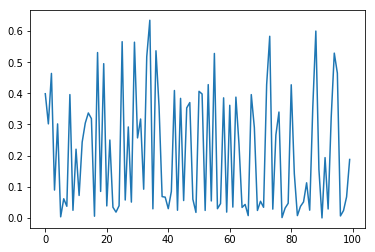

In [218]:
plt.plot(expone_scores)
plt.show()


In [219]:
#plt.savefig("expone_scores.png")

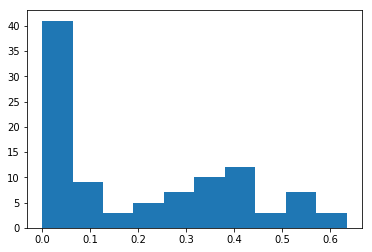

In [220]:
plt.hist(expone_scores)
plt.show()


In [221]:
#plt.savefig("expone_hist.png")

In [222]:
df_score = pd.DataFrame(expone_scores)
df_score.describe()

,0
count,100.000000
mean,0.209479
std,0.190871
min,-0.000136
25%,0.034550
50%,0.127263
75%,0.373719
max,0.634789


In [223]:
expone_scores5 = []
for i in range(len(expone_scores)):
    expone_scores5.append(expone_scores[i]*5)

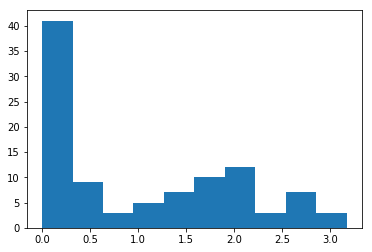

In [224]:
plt.hist(expone_scores5)
plt.show()

In [225]:
df_score5 = pd.DataFrame(expone_scores5)
df_score5.describe()

,0
count,100.000000
mean,1.047397
std,0.954354
min,-0.000681
25%,0.172751
50%,0.636315
75%,1.868597
max,3.173943


###  サンプル数ごとの精度
なぜか知らないが、決定係数がサンプリングを多くすると悪くなる。

In [226]:
import mylime as mylime
import mylime.my_lime_one
import importlib
# モジュールの再読み込み　ソースコードの変更のため
expone_scores_sample = []
# データは固定
data_row = X_mf_test[0]
for num_samples_i in range(2,10000,100) :
    # data_row_iを変える
    one_diff_data = my_big_data(data_row,num_samples_i)
    # 保存して、読み込めるようにする
    import pickle
    with open('./pickle/one_diff_data', 'wb') as f:
        pickle.dump(one_diff_data, f)

    importlib.reload(mylime)
    importlib.reload(mylime.my_lime_one)
    explainer_one= mylime.my_lime_one.LimeTabularExplainer(X_mf_test, feature_names=feature_names,
                                                       class_names=['No','Yes'], 
                                                       verbose=True, 
                                                       #categorical_features=(1),#csrのインデックスをしていする
                                                       mode='regression',
                                                       random_state=0
                                                      )
    expone = explainer_one.explain_instance(data_row_i, fm.predict,num_features=10,num_samples=num_samples_i)
    expone_scores_sample.append(expone.score)



data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 38 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0, 1791)	0.0
  (0, 1793)	1.0
  (0, 1794)	0.0
  (0, 2274)	1.0
  (0, 2435)	0.0
  (0, 2739)	1.0
  (1, 4)	1.0
  (1, 18)	20.0
  (1, 60

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 2142 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 2874 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 955)	1.0
  (0, 1310)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 3539 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 4247 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 4964 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 5639 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 955)	1.0
  (0, 1405)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 6342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1002x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 7036 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1790)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1102x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 7764 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1202x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 8438 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 936)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 9140 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 9841 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 10538 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 11237 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 11938 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 955)	1.0
  (0, 1616)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 12639 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <1902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 13336 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2002x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 14036 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2102x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 14739 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 879)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2202x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 15439 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 16163 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 16842 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 17543 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 18238 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 576)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 18936 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 19641 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <2902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 20359 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3002x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 21039 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3102x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 21736 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3202x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 22456 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 23139 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 23843 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 24547 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 25242 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 25941 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 955)	1.0
  (0, 1612)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 26637 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <3902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 27339 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4002x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 28060 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4102x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 28754 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 955)	1.0
  (0, 1168)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4202x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 29438 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 30140 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 30839 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 31538 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 32243 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 955)	1.0
  (0, 1364)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 32956 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 33665 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <4902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 34345 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5002x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 35039 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5102x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 35744 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 955)	1.0
  (0, 988)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5202x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 36446 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 37140 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 37837 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 862)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 38538 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 39244 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 75)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 39947 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 40650 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <5902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 41340 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 955)	1.0
  (0, 1163)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6002x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 42081 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6102x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 42741 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6202x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 43451 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 44139 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 44838 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 45537 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 46240 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 46944 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 163)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 47638 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <6902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 48336 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7002x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 49046 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7102x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 49767 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7202x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 50445 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 51152 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 51845 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 52538 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 53245 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 53939 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 54637 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <7902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 55344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8002x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 56037 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8102x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 56739 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8202x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 57439 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 58138 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 58837 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 59541 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 60236 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 60937 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 61653 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <8902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 62336 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9002x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 63048 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9102x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 63739 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9202x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 64437 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9302x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 65140 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9402x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 65842 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9502x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 66542 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9602x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 67239 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9702x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 67936 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9802x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 68644 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   12   13   15   18  955 1704 1790 1793 2274 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 955)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [227]:
expone_scores_sample

[0.0990143400604383,
 -0.0018141250836332114,
 0.0013704049914279315,
 0.00044635393910874566,
 0.11376897394151453,
 0.09207178179841768,
 0.07627767957148279,
 0.06799217156332316,
 0.1287883305023284,
 0.04964186139523341,
 0.03854849278290761,
 0.03658039828550452,
 0.08185904599645466,
 0.05041383170778657,
 0.06890753489331158,
 0.03937292411468041,
 0.07307251398757175,
 0.06607411517115369,
 0.03691279444147966,
 0.0695940304755307,
 0.07168082685898136,
 0.046575370558892826,
 0.009895432228501644,
 0.030706358188726468,
 0.05293198368432339,
 0.03491309325271719,
 0.0008278116336858377,
 0.04417374560160437,
 0.05776186947863204,
 0.020013815493207243,
 0.05719037168944252,
 0.05558746603399701,
 0.03265723470745241,
 0.027977998975263874,
 0.02134028935852106,
 0.03613305509869391,
 0.033010001876430994,
 0.04580257327663251,
 0.013357959407848008,
 0.018821336985861747,
 0.03362727934140308,
 0.03047244529956039,
 0.03258749562005747,
 0.017944538519116704,
 0.0364247257095

In [228]:
y = []
for i in range(2,10000,100):
    y.append(i)

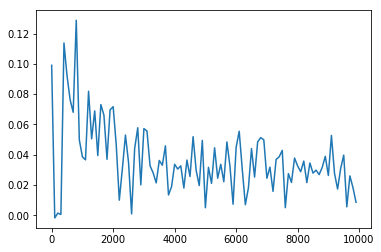

In [229]:
plt.plot(y,expone_scores_sample)
plt.savefig("expone_scores_sample.png")
plt.show()

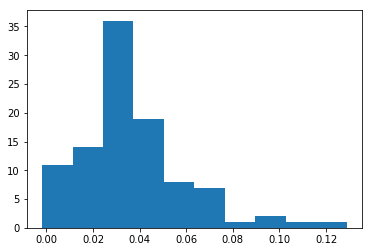

In [230]:
plt.hist(expone_scores_sample)
plt.savefig("expone_scores_sample_hist.png")
plt.show()

In [231]:
df_score_2 = pd.DataFrame(expone_scores)
df_score_2.describe()

,0
count,100.000000
mean,0.209479
std,0.190871
min,-0.000136
25%,0.034550
50%,0.127263
75%,0.373719
max,0.634789


# データ生成手法2
存在し得ないデータは自分も作っていた。
user情報、item情報は連動している。

user情報(user_id,age,sex,occupation)

item情報(movie_id,release_year,genre)

その他(yearは見た年)




In [232]:
# 

In [233]:
#useridと一緒に、他のデータも変える。
one_diff_data2 = []
data_row = X_mf_test[0] #テストデータ基準
data_row_dict = v.inverse_transform(data_row)[0]

In [234]:
genre_list

['Action',
 'Adventure',
 'Animation',
 "Children's",
 'Comedy',
 'Crime',
 'Documentary',
 'Drama',
 'Fantasy',
 'Film-Noir',
 'Horror',
 'Musical',
 'Mystery',
 'Romance',
 'Sci-Fi',
 'Thriller',
 'War',
 'Western']

In [235]:
filtered_lens.sample().loc[:,["user_id"]]

,user_id
3528,223


In [240]:
rand = np.random.choice(26)# len(filtered_lens.columns)-1
uorm = rand = np.random.choice(["change_item","change_user"])
if uorm == "change_user":
    tmp = filtered_lens.sample().loc[:,["user_id","age","occupation"]]
    print(tmp)
    user_id = int(tmp["user_id"][:])
    age = int(tmp["age"][:])
    occupation = str(tmp["occupation"][:])
elif uorm == "change_item":
    tmp = filtered_lens.sample().loc[:,["movie_id","release_year",
                                        'Action', 'Adventure', 'Animation', "Children's", 'Comedy', 'Crime', 'Documentary', 'Drama', 
                                        'Fantasy', 'Film-Noir', 'Horror', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', 
                                        'Thriller', 'War', 'Western']]
    movie_id= int(tmp["movie_id"][:])
    release_year=int(tmp[ "release_year"][:])
    genre = tmp['Action', 'Adventure', 'Animation', "Children's", 'Comedy', 'Crime', 'Documentary', 'Drama', 
                                        'Fantasy', 'Film-Noir', 'Horror', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', 
                                        'Thriller', 'War', 'Western']
    print(tmp)
    print(genre)

      user_id  age occupation
87574     878   50   educator


In [241]:
data_row_dict

{'Comedy': 1.0,
 'age': 30.0,
 'movie_id=1527': 1.0,
 'occupation=programmer': 1.0,
 'release_year=1998': 1.0,
 'sex=M': 1.0,
 'user_id=676': 1.0,
 'year=1998': 1.0}

In [242]:
#user情報を変える。


In [247]:
one_diff_data2

[]

In [249]:
one_diff_data2 = []
data_row = X_mf_test[0]
data_row_dict = v.inverse_transform(data_row)[0]
for i in range(num_samples):
    user_id = int(user_id_list.iloc[np.random.randint(0,len(user_id_list))])
    movie_id = int(movie_id_list.iloc[np.random.randint(0,len(movie_id_list))])
    genre = np.random.choice(genre_list)
    age = int(age_list.iloc[np.random.randint(0,len(age_list))])
    occupation = occupation_list.iloc[np.random.randint(0,len(occupation_list))]
    release_year = int(release_year_list.iloc[np.random.randint(0,len(release_year_list))])
    sex = np.random.choice(["sex=M","sex=F"])
    year = int(year_list.iloc[np.random.randint(0,len(year_list))])
    one = 0
    one = np.random.choice(list(data_row_dict.keys()))
    if "year=" in  one :
        if "release_year" in one:
            print("release_year=",one)
            data_row_dict.pop(one)
            data_row_dict["release_year="+str(release_year)]=1.0
        else:
            print("year=",one)
            data_row_dict.pop(one)
            data_row_dict["year="+str(year)]=1.0
    elif "sex" in one:
        print("sex=",one)
        data_row_dict.pop(one)
        data_row_dict[sex]=1.0
    elif "age" in one :
        print("age=",one)
        data_row_dict.pop("age")
        data_row_dict["age"]=int(age)
        print(one,data_row_dict["age"])
    elif "user_id" in one:
        print("user_id=",one)
        data_row_dict.pop(one)
        data_row_dict["user_id="+str(user_id)]=1.0
    elif "movie_id" in one:
        print("movie_id=",one)    
        data_row_dict.pop(one)
        data_row_dict["movie_id="+str(movie_id)]=1.0
    elif "occupation" in one:
        print("occupation=",one)
        data_row_dict.pop(one)
        data_row_dict["occupation="+str(occupation[0])]=1.0    
    elif one in genre_list :
        print("genre=",one)    
        data_row_dict.pop(one)
        data_row_dict[genre]=1.0            
    print(data_row_dict)
    one_diff_data2.append(data_row_dict.copy())
    

user_id= user_id=676
{'Comedy': 1.0, 'age': 30.0, 'movie_id=1527': 1.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'user_id=399': 1.0}
movie_id= movie_id=1527
{'Comedy': 1.0, 'age': 30.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'user_id=399': 1.0, 'movie_id=248': 1.0}
genre= Comedy
{'age': 30.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'user_id=399': 1.0, 'movie_id=248': 1.0, 'Romance': 1.0}
user_id= user_id=399
{'age': 30.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'movie_id=248': 1.0, 'Romance': 1.0, 'user_id=128': 1.0}
genre= Romance
{'age': 30.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'movie_id=248': 1.0, 'user_id=128': 1.0, 'Film-Noir': 1.0}
year= year=1998
{'age': 30.0, 'occupation=programmer': 1.0, 'release_year=1998': 1.0, 'sex=M': 1.0, 'movie_id

{'release_year=1998': 1.0, 'occupation=other': 1.0, 'movie_id=218': 1.0, 'sex=M': 1.0, 'year=1997': 1.0, 'Adventure': 1.0, 'user_id=347': 1.0, 'age': 42}
sex= sex=M
{'release_year=1998': 1.0, 'occupation=other': 1.0, 'movie_id=218': 1.0, 'year=1997': 1.0, 'Adventure': 1.0, 'user_id=347': 1.0, 'age': 42, 'sex=F': 1.0}
sex= sex=F
{'release_year=1998': 1.0, 'occupation=other': 1.0, 'movie_id=218': 1.0, 'year=1997': 1.0, 'Adventure': 1.0, 'user_id=347': 1.0, 'age': 42, 'sex=F': 1.0}
release_year= release_year=1998
{'occupation=other': 1.0, 'movie_id=218': 1.0, 'year=1997': 1.0, 'Adventure': 1.0, 'user_id=347': 1.0, 'age': 42, 'sex=F': 1.0, 'release_year=1994': 1.0}
movie_id= movie_id=218
{'occupation=other': 1.0, 'year=1997': 1.0, 'Adventure': 1.0, 'user_id=347': 1.0, 'age': 42, 'sex=F': 1.0, 'release_year=1994': 1.0, 'movie_id=425': 1.0}
release_year= release_year=1994
{'occupation=other': 1.0, 'year=1997': 1.0, 'Adventure': 1.0, 'user_id=347': 1.0, 'age': 42, 'sex=F': 1.0, 'movie_id=425'

movie_id= movie_id=51
{'user_id=592': 1.0, 'release_year=1961': 1.0, 'Sci-Fi': 1.0, 'sex=M': 1.0, 'age': 35, 'year=1998': 1.0, 'occupation=other': 1.0, 'movie_id=302': 1.0}
age= age
age 38
{'user_id=592': 1.0, 'release_year=1961': 1.0, 'Sci-Fi': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'occupation=other': 1.0, 'movie_id=302': 1.0, 'age': 38}
age= age
age 20
{'user_id=592': 1.0, 'release_year=1961': 1.0, 'Sci-Fi': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'occupation=other': 1.0, 'movie_id=302': 1.0, 'age': 20}
release_year= release_year=1961
{'user_id=592': 1.0, 'Sci-Fi': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'occupation=other': 1.0, 'movie_id=302': 1.0, 'age': 20, 'release_year=1995': 1.0}
release_year= release_year=1995
{'user_id=592': 1.0, 'Sci-Fi': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'occupation=other': 1.0, 'movie_id=302': 1.0, 'age': 20, 'release_year=1995': 1.0}
age= age
age 36
{'user_id=592': 1.0, 'Sci-Fi': 1.0, 'sex=M': 1.0, 'year=1998': 1.0, 'occupation=other': 1.0, 'movie_id=302': 1.

age= age
age 48
{'sex=F': 1.0, 'year=1998': 1.0, 'Film-Noir': 1.0, 'movie_id=464': 1.0, 'occupation=educator': 1.0, 'release_year=1993': 1.0, 'user_id=254': 1.0, 'age': 48}
sex= sex=F
{'year=1998': 1.0, 'Film-Noir': 1.0, 'movie_id=464': 1.0, 'occupation=educator': 1.0, 'release_year=1993': 1.0, 'user_id=254': 1.0, 'age': 48, 'sex=M': 1.0}
user_id= user_id=254
{'year=1998': 1.0, 'Film-Noir': 1.0, 'movie_id=464': 1.0, 'occupation=educator': 1.0, 'release_year=1993': 1.0, 'age': 48, 'sex=M': 1.0, 'user_id=840': 1.0}
user_id= user_id=840
{'year=1998': 1.0, 'Film-Noir': 1.0, 'movie_id=464': 1.0, 'occupation=educator': 1.0, 'release_year=1993': 1.0, 'age': 48, 'sex=M': 1.0, 'user_id=727': 1.0}
sex= sex=M
{'year=1998': 1.0, 'Film-Noir': 1.0, 'movie_id=464': 1.0, 'occupation=educator': 1.0, 'release_year=1993': 1.0, 'age': 48, 'user_id=727': 1.0, 'sex=M': 1.0}
user_id= user_id=727
{'year=1998': 1.0, 'Film-Noir': 1.0, 'movie_id=464': 1.0, 'occupation=educator': 1.0, 'release_year=1993': 1.0, 'a

movie_id= movie_id=477
{'user_id=516': 1.0, 'age': 27, 'Documentary': 1.0, 'occupation=administrator': 1.0, 'year=1997': 1.0, 'sex=F': 1.0, 'release_year=1996': 1.0, 'movie_id=9': 1.0}
release_year= release_year=1996
{'user_id=516': 1.0, 'age': 27, 'Documentary': 1.0, 'occupation=administrator': 1.0, 'year=1997': 1.0, 'sex=F': 1.0, 'movie_id=9': 1.0, 'release_year=1997': 1.0}
year= year=1997
{'user_id=516': 1.0, 'age': 27, 'Documentary': 1.0, 'occupation=administrator': 1.0, 'sex=F': 1.0, 'movie_id=9': 1.0, 'release_year=1997': 1.0, 'year=1998': 1.0}
occupation= occupation=administrator
{'user_id=516': 1.0, 'age': 27, 'Documentary': 1.0, 'sex=F': 1.0, 'movie_id=9': 1.0, 'release_year=1997': 1.0, 'year=1998': 1.0, 'occupation=entertainment': 1.0}
year= year=1998
{'user_id=516': 1.0, 'age': 27, 'Documentary': 1.0, 'sex=F': 1.0, 'movie_id=9': 1.0, 'release_year=1997': 1.0, 'occupation=entertainment': 1.0, 'year=1997': 1.0}
sex= sex=F
{'user_id=516': 1.0, 'age': 27, 'Documentary': 1.0, 'mo

year= year=1997
{'occupation=technician': 1.0, 'user_id=436': 1.0, 'movie_id=151': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'sex=M': 1.0, 'age': 25, 'year=1997': 1.0}
occupation= occupation=technician
{'user_id=436': 1.0, 'movie_id=151': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'sex=M': 1.0, 'age': 25, 'year=1997': 1.0, 'occupation=educator': 1.0}
sex= sex=M
{'user_id=436': 1.0, 'movie_id=151': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'age': 25, 'year=1997': 1.0, 'occupation=educator': 1.0, 'sex=F': 1.0}
movie_id= movie_id=151
{'user_id=436': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'age': 25, 'year=1997': 1.0, 'occupation=educator': 1.0, 'sex=F': 1.0, 'movie_id=659': 1.0}
sex= sex=F
{'user_id=436': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'age': 25, 'year=1997': 1.0, 'occupation=educator': 1.0, 'movie_id=659': 1.0, 'sex=M': 1.0}
year= year=1997
{'user_id=436': 1.0, 'Action': 1.0, 'release_year=1995': 1.0, 'age': 25, 'occupation=educator': 1.0, 'movie_id=659': 

movie_id= movie_id=282
{'Fantasy': 1.0, 'release_year=1996': 1.0, 'occupation=artist': 1.0, 'sex=F': 1.0, 'user_id=870': 1.0, 'age': 30, 'year=1997': 1.0, 'movie_id=544': 1.0}
age= age
age 27
{'Fantasy': 1.0, 'release_year=1996': 1.0, 'occupation=artist': 1.0, 'sex=F': 1.0, 'user_id=870': 1.0, 'year=1997': 1.0, 'movie_id=544': 1.0, 'age': 27}
user_id= user_id=870
{'Fantasy': 1.0, 'release_year=1996': 1.0, 'occupation=artist': 1.0, 'sex=F': 1.0, 'year=1997': 1.0, 'movie_id=544': 1.0, 'age': 27, 'user_id=503': 1.0}
occupation= occupation=artist
{'Fantasy': 1.0, 'release_year=1996': 1.0, 'sex=F': 1.0, 'year=1997': 1.0, 'movie_id=544': 1.0, 'age': 27, 'user_id=503': 1.0, 'occupation=engineer': 1.0}
sex= sex=F
{'Fantasy': 1.0, 'release_year=1996': 1.0, 'year=1997': 1.0, 'movie_id=544': 1.0, 'age': 27, 'user_id=503': 1.0, 'occupation=engineer': 1.0, 'sex=M': 1.0}
sex= sex=M
{'Fantasy': 1.0, 'release_year=1996': 1.0, 'year=1997': 1.0, 'movie_id=544': 1.0, 'age': 27, 'user_id=503': 1.0, 'occup

{'movie_id=66': 1.0, 'occupation=technician': 1.0, 'year=1997': 1.0, 'age': 51, 'sex=M': 1.0, 'Action': 1.0, 'release_year=1996': 1.0, 'user_id=59': 1.0}
user_id= user_id=59
{'movie_id=66': 1.0, 'occupation=technician': 1.0, 'year=1997': 1.0, 'age': 51, 'sex=M': 1.0, 'Action': 1.0, 'release_year=1996': 1.0, 'user_id=227': 1.0}
year= year=1997
{'movie_id=66': 1.0, 'occupation=technician': 1.0, 'age': 51, 'sex=M': 1.0, 'Action': 1.0, 'release_year=1996': 1.0, 'user_id=227': 1.0, 'year=1998': 1.0}
movie_id= movie_id=66
{'occupation=technician': 1.0, 'age': 51, 'sex=M': 1.0, 'Action': 1.0, 'release_year=1996': 1.0, 'user_id=227': 1.0, 'year=1998': 1.0, 'movie_id=82': 1.0}
genre= Action
{'occupation=technician': 1.0, 'age': 51, 'sex=M': 1.0, 'release_year=1996': 1.0, 'user_id=227': 1.0, 'year=1998': 1.0, 'movie_id=82': 1.0, 'Crime': 1.0}
age= age
age 24
{'occupation=technician': 1.0, 'sex=M': 1.0, 'release_year=1996': 1.0, 'user_id=227': 1.0, 'year=1998': 1.0, 'movie_id=82': 1.0, 'Crime': 1

sex= sex=M
{'age': 36, 'release_year=1997': 1.0, 'Romance': 1.0, 'year=1997': 1.0, 'movie_id=95': 1.0, 'user_id=705': 1.0, 'occupation=student': 1.0, 'sex=F': 1.0}
age= age
age 46
{'release_year=1997': 1.0, 'Romance': 1.0, 'year=1997': 1.0, 'movie_id=95': 1.0, 'user_id=705': 1.0, 'occupation=student': 1.0, 'sex=F': 1.0, 'age': 46}
age= age
age 56
{'release_year=1997': 1.0, 'Romance': 1.0, 'year=1997': 1.0, 'movie_id=95': 1.0, 'user_id=705': 1.0, 'occupation=student': 1.0, 'sex=F': 1.0, 'age': 56}
release_year= release_year=1997
{'Romance': 1.0, 'year=1997': 1.0, 'movie_id=95': 1.0, 'user_id=705': 1.0, 'occupation=student': 1.0, 'sex=F': 1.0, 'age': 56, 'release_year=1993': 1.0}
sex= sex=F
{'Romance': 1.0, 'year=1997': 1.0, 'movie_id=95': 1.0, 'user_id=705': 1.0, 'occupation=student': 1.0, 'age': 56, 'release_year=1993': 1.0, 'sex=F': 1.0}
age= age
age 19
{'Romance': 1.0, 'year=1997': 1.0, 'movie_id=95': 1.0, 'user_id=705': 1.0, 'occupation=student': 1.0, 'release_year=1993': 1.0, 'sex=

age 40
{'sex=M': 1.0, 'movie_id=1071': 1.0, 'user_id=62': 1.0, 'year=1997': 1.0, 'Romance': 1.0, 'occupation=educator': 1.0, 'release_year=1995': 1.0, 'age': 40}
year= year=1997
{'sex=M': 1.0, 'movie_id=1071': 1.0, 'user_id=62': 1.0, 'Romance': 1.0, 'occupation=educator': 1.0, 'release_year=1995': 1.0, 'age': 40, 'year=1998': 1.0}
age= age
age 47
{'sex=M': 1.0, 'movie_id=1071': 1.0, 'user_id=62': 1.0, 'Romance': 1.0, 'occupation=educator': 1.0, 'release_year=1995': 1.0, 'year=1998': 1.0, 'age': 47}
release_year= release_year=1995
{'sex=M': 1.0, 'movie_id=1071': 1.0, 'user_id=62': 1.0, 'Romance': 1.0, 'occupation=educator': 1.0, 'year=1998': 1.0, 'age': 47, 'release_year=1996': 1.0}
genre= Romance
{'sex=M': 1.0, 'movie_id=1071': 1.0, 'user_id=62': 1.0, 'occupation=educator': 1.0, 'year=1998': 1.0, 'age': 47, 'release_year=1996': 1.0, 'Documentary': 1.0}
release_year= release_year=1996
{'sex=M': 1.0, 'movie_id=1071': 1.0, 'user_id=62': 1.0, 'occupation=educator': 1.0, 'year=1998': 1.0, '

movie_id= movie_id=772
{'release_year=1941': 1.0, 'user_id=709': 1.0, 'sex=F': 1.0, 'age': 44, 'Fantasy': 1.0, 'year=1998': 1.0, 'occupation=technician': 1.0, 'movie_id=288': 1.0}
age= age
age 18
{'release_year=1941': 1.0, 'user_id=709': 1.0, 'sex=F': 1.0, 'Fantasy': 1.0, 'year=1998': 1.0, 'occupation=technician': 1.0, 'movie_id=288': 1.0, 'age': 18}
occupation= occupation=technician
{'release_year=1941': 1.0, 'user_id=709': 1.0, 'sex=F': 1.0, 'Fantasy': 1.0, 'year=1998': 1.0, 'movie_id=288': 1.0, 'age': 18, 'occupation=writer': 1.0}
movie_id= movie_id=288
{'release_year=1941': 1.0, 'user_id=709': 1.0, 'sex=F': 1.0, 'Fantasy': 1.0, 'year=1998': 1.0, 'age': 18, 'occupation=writer': 1.0, 'movie_id=511': 1.0}
movie_id= movie_id=511
{'release_year=1941': 1.0, 'user_id=709': 1.0, 'sex=F': 1.0, 'Fantasy': 1.0, 'year=1998': 1.0, 'age': 18, 'occupation=writer': 1.0, 'movie_id=228': 1.0}
release_year= release_year=1941
{'user_id=709': 1.0, 'sex=F': 1.0, 'Fantasy': 1.0, 'year=1998': 1.0, 'age': 

year= year=1997
{'age': 27, 'occupation=other': 1.0, 'user_id=256': 1.0, 'sex=F': 1.0, 'movie_id=180': 1.0, 'Drama': 1.0, 'release_year=1981': 1.0, 'year=1998': 1.0}
release_year= release_year=1981
{'age': 27, 'occupation=other': 1.0, 'user_id=256': 1.0, 'sex=F': 1.0, 'movie_id=180': 1.0, 'Drama': 1.0, 'year=1998': 1.0, 'release_year=1993': 1.0}
occupation= occupation=other
{'age': 27, 'user_id=256': 1.0, 'sex=F': 1.0, 'movie_id=180': 1.0, 'Drama': 1.0, 'year=1998': 1.0, 'release_year=1993': 1.0, 'occupation=librarian': 1.0}
occupation= occupation=librarian
{'age': 27, 'user_id=256': 1.0, 'sex=F': 1.0, 'movie_id=180': 1.0, 'Drama': 1.0, 'year=1998': 1.0, 'release_year=1993': 1.0, 'occupation=student': 1.0}
age= age
age 24
{'user_id=256': 1.0, 'sex=F': 1.0, 'movie_id=180': 1.0, 'Drama': 1.0, 'year=1998': 1.0, 'release_year=1993': 1.0, 'occupation=student': 1.0, 'age': 24}
year= year=1998
{'user_id=256': 1.0, 'sex=F': 1.0, 'movie_id=180': 1.0, 'Drama': 1.0, 'release_year=1993': 1.0, 'occ

{'user_id=670': 1.0, 'year=1997': 1.0, 'age': 28, 'Drama': 1.0, 'sex=M': 1.0, 'release_year=1996': 1.0, 'occupation=programmer': 1.0, 'movie_id=504': 1.0}
year= year=1997
{'user_id=670': 1.0, 'age': 28, 'Drama': 1.0, 'sex=M': 1.0, 'release_year=1996': 1.0, 'occupation=programmer': 1.0, 'movie_id=504': 1.0, 'year=1998': 1.0}
sex= sex=M
{'user_id=670': 1.0, 'age': 28, 'Drama': 1.0, 'release_year=1996': 1.0, 'occupation=programmer': 1.0, 'movie_id=504': 1.0, 'year=1998': 1.0, 'sex=M': 1.0}
genre= Drama
{'user_id=670': 1.0, 'age': 28, 'release_year=1996': 1.0, 'occupation=programmer': 1.0, 'movie_id=504': 1.0, 'year=1998': 1.0, 'sex=M': 1.0, 'War': 1.0}
year= year=1998
{'user_id=670': 1.0, 'age': 28, 'release_year=1996': 1.0, 'occupation=programmer': 1.0, 'movie_id=504': 1.0, 'sex=M': 1.0, 'War': 1.0, 'year=1997': 1.0}
sex= sex=M
{'user_id=670': 1.0, 'age': 28, 'release_year=1996': 1.0, 'occupation=programmer': 1.0, 'movie_id=504': 1.0, 'War': 1.0, 'year=1997': 1.0, 'sex=M': 1.0}
sex= sex=

year= year=1998
{'user_id=284': 1.0, 'release_year=1995': 1.0, 'age': 32, 'occupation=executive': 1.0, 'movie_id=840': 1.0, "Children's": 1.0, 'sex=F': 1.0, 'year=1997': 1.0}
age= age
age 22
{'user_id=284': 1.0, 'release_year=1995': 1.0, 'occupation=executive': 1.0, 'movie_id=840': 1.0, "Children's": 1.0, 'sex=F': 1.0, 'year=1997': 1.0, 'age': 22}
year= year=1997
{'user_id=284': 1.0, 'release_year=1995': 1.0, 'occupation=executive': 1.0, 'movie_id=840': 1.0, "Children's": 1.0, 'sex=F': 1.0, 'age': 22, 'year=1998': 1.0}
movie_id= movie_id=840
{'user_id=284': 1.0, 'release_year=1995': 1.0, 'occupation=executive': 1.0, "Children's": 1.0, 'sex=F': 1.0, 'age': 22, 'year=1998': 1.0, 'movie_id=651': 1.0}
release_year= release_year=1995
{'user_id=284': 1.0, 'occupation=executive': 1.0, "Children's": 1.0, 'sex=F': 1.0, 'age': 22, 'year=1998': 1.0, 'movie_id=651': 1.0, 'release_year=1940': 1.0}
user_id= user_id=284
{'occupation=executive': 1.0, "Children's": 1.0, 'sex=F': 1.0, 'age': 22, 'year=1

{'sex=F': 1.0, 'release_year=1987': 1.0, 'occupation=student': 1.0, 'Sci-Fi': 1.0, 'movie_id=678': 1.0, 'user_id=716': 1.0, 'year=1998': 1.0, 'age': 19}
age= age
age 19
{'sex=F': 1.0, 'release_year=1987': 1.0, 'occupation=student': 1.0, 'Sci-Fi': 1.0, 'movie_id=678': 1.0, 'user_id=716': 1.0, 'year=1998': 1.0, 'age': 19}
genre= Sci-Fi
{'sex=F': 1.0, 'release_year=1987': 1.0, 'occupation=student': 1.0, 'movie_id=678': 1.0, 'user_id=716': 1.0, 'year=1998': 1.0, 'age': 19, 'Documentary': 1.0}
release_year= release_year=1987
{'sex=F': 1.0, 'occupation=student': 1.0, 'movie_id=678': 1.0, 'user_id=716': 1.0, 'year=1998': 1.0, 'age': 19, 'Documentary': 1.0, 'release_year=1991': 1.0}
movie_id= movie_id=678
{'sex=F': 1.0, 'occupation=student': 1.0, 'user_id=716': 1.0, 'year=1998': 1.0, 'age': 19, 'Documentary': 1.0, 'release_year=1991': 1.0, 'movie_id=50': 1.0}
movie_id= movie_id=50
{'sex=F': 1.0, 'occupation=student': 1.0, 'user_id=716': 1.0, 'year=1998': 1.0, 'age': 19, 'Documentary': 1.0, 're

genre= Crime
{'year=1998': 1.0, 'age': 50, 'release_year=1995': 1.0, 'sex=F': 1.0, 'occupation=student': 1.0, 'user_id=711': 1.0, 'movie_id=307': 1.0, 'Sci-Fi': 1.0}
genre= Sci-Fi
{'year=1998': 1.0, 'age': 50, 'release_year=1995': 1.0, 'sex=F': 1.0, 'occupation=student': 1.0, 'user_id=711': 1.0, 'movie_id=307': 1.0, 'Crime': 1.0}
user_id= user_id=711
{'year=1998': 1.0, 'age': 50, 'release_year=1995': 1.0, 'sex=F': 1.0, 'occupation=student': 1.0, 'movie_id=307': 1.0, 'Crime': 1.0, 'user_id=694': 1.0}
release_year= release_year=1995
{'year=1998': 1.0, 'age': 50, 'sex=F': 1.0, 'occupation=student': 1.0, 'movie_id=307': 1.0, 'Crime': 1.0, 'user_id=694': 1.0, 'release_year=1977': 1.0}
movie_id= movie_id=307
{'year=1998': 1.0, 'age': 50, 'sex=F': 1.0, 'occupation=student': 1.0, 'Crime': 1.0, 'user_id=694': 1.0, 'release_year=1977': 1.0, 'movie_id=660': 1.0}
occupation= occupation=student
{'year=1998': 1.0, 'age': 50, 'sex=F': 1.0, 'Crime': 1.0, 'user_id=694': 1.0, 'release_year=1977': 1.0, '

# LIMEの特徴量の重要度のリストと、自作の特徴量の重要度のリストを比較

この特徴量は良くなった。だからこの特徴量は、ランダムサンプリングしてはいけないという結論を出す。

### LIMEの特徴量の重要度のリストをfor回して作る

In [280]:
all_as_list = []
all_lime_score2 = []
for i in range(0,5000,10):
    exp = explainer.explain_instance(X_mf_test[i], fm.predict,num_features=10,num_samples=5000)
    all_lime_score2.append(exp.score)
    all_as_list.append(exp.as_list())

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.4502148510025377
Prediction_local [3.23841892]
Right: 2.6729075367865933
Intercept 2.9938239387780445
Prediction_local [2.52067287]
Right: 3.925990180343488
Intercept 3.426000204446392
Prediction_local [3.3807317]
Right: 3.5902603887666826
Intercept 3.24925150642952
Prediction_local [3.00109297]
Right: 3.184318626514078
Intercept 3.765718815588291
Prediction_local [3.61096482]
Right: 4.068365825765511
Intercept 3.614390764849701
Prediction_local [3.07652434]
Right: 2.986722429948654


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 4.16499628754963
Prediction_local [4.20935089]
Right: 4.416608802554234
Intercept 3.303379790322874
Prediction_local [2.83473672]
Right: 4.124596552738595
Intercept 4.235890511369499
Prediction_local [4.45971121]
Right: 3.421497179207485
Intercept 3.180265612098048
Prediction_local [2.51530171]
Right: 3.4213632929038793
Intercept 3.4760104247020855
Prediction_local [3.41013125]
Right: 2.3100600371392765
Intercept 4.171910971143101
Prediction_local [4.44368865]
Right: 3.733168203766571
Intercept 4.076484073303056
Prediction_local [4.14069153]
Right: 4.4107280171261785


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.952191101910409
Prediction_local [3.36959947]
Right: 3.2774407755105033
Intercept 3.543349327486535
Prediction_local [3.50771663]
Right: 3.921827283556265
Intercept 3.463186080298213
Prediction_local [3.46298928]
Right: 3.2617809781338267
Intercept 3.219198663585082
Prediction_local [2.81304401]
Right: 3.0197754719006458
Intercept 3.634148273499556
Prediction_local [3.17201586]
Right: 1.282466019215521
Intercept 3.0492268551331776
Prediction_local [2.75549867]
Right: 2.463498141355477
Intercept 3.5815038848560663
Prediction_local [3.02526327]
Right: 2.9070057293454683


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.3983985139902946
Prediction_local [3.11852665]
Right: 3.6160102140328103
Intercept 3.422417481051189
Prediction_local [2.96855025]
Right: 3.8652374016878657
Intercept 3.201856851947611
Prediction_local [2.8975329]
Right: 4.503725162953013
Intercept 4.1682695226023245
Prediction_local [3.98272303]
Right: 2.766105013391927
Intercept 3.4001909500450047
Prediction_local [3.36346326]
Right: 4.43653242375402
Intercept 3.4928804181144053
Prediction_local [3.26461939]
Right: 4.2593351287530155


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.490682124317568
Prediction_local [2.57159621]
Right: 3.372326660306337
Intercept 3.5991350499553065
Prediction_local [3.96319563]
Right: 4.370059813951044
Intercept 3.118254774071315
Prediction_local [2.71125205]
Right: 4.15653400605151
Intercept 3.5261309998876422
Prediction_local [3.47011634]
Right: 3.735548222101407
Intercept 3.5712150108256364
Prediction_local [3.30293116]
Right: 2.912894829696732
Intercept 3.2016730631203374
Prediction_local [2.36558291]
Right: 3.8544547656099644


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.4086140113692536
Prediction_local [3.21364121]
Right: 3.296459350944004
Intercept 3.7846556355761196
Prediction_local [3.02564695]
Right: 3.982065631224902
Intercept 4.110831654939081
Prediction_local [4.3826128]
Right: 3.724346072271603
Intercept 3.1526268873514693
Prediction_local [2.82133279]
Right: 3.2736739979671663
Intercept 3.3728256548879916
Prediction_local [3.31250358]
Right: 2.20976856404817
Intercept 3.374918244467746
Prediction_local [1.91475284]
Right: 1.8327229721345644


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.4673203273250115
Prediction_local [3.01452721]
Right: 4.506591099491026
Intercept 3.0950526666425047
Prediction_local [2.86522269]
Right: 3.8431564565146443
Intercept 3.463204108112014
Prediction_local [3.11834336]
Right: 2.3339132708857178
Intercept 3.4059172108514995
Prediction_local [2.98356142]
Right: 3.163707850278711
Intercept 3.6393479534680413
Prediction_local [3.30470269]
Right: 3.535388457343175
Intercept 3.5124289366212254
Prediction_local [3.04205727]
Right: 4.249857146567542


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.447874107424293
Prediction_local [2.97242336]
Right: 4.440920207144672
Intercept 3.4633222288972156
Prediction_local [3.07880115]
Right: 3.709009743229992
Intercept 3.307621875928394
Prediction_local [3.31990113]
Right: 3.8793560519827226
Intercept 3.3423003609848334
Prediction_local [3.09989159]
Right: 4.36198946078233
Intercept 3.7681524075682615
Prediction_local [3.91694266]
Right: 4.423257052587308
Intercept 3.4189855976120107
Prediction_local [3.19340034]
Right: 3.162286610768953
Intercept 3.2538018820678394
Prediction_local [1.92955083]
Right: 4.361035743687202


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.6742847349192056
Prediction_local [3.58482616]
Right: 4.877658880357785
Intercept 3.43390887272155
Prediction_local [2.55423068]
Right: 3.3056179316052816
Intercept 3.2206946492365995
Prediction_local [2.73098627]
Right: 1.7950194138574709
Intercept 3.8343585670003075
Prediction_local [4.03506121]
Right: 3.1754429111498776
Intercept 3.98488409927168
Prediction_local [4.06349421]
Right: 3.440923301809017
Intercept 3.308390069642969
Prediction_local [2.82625417]
Right: 3.3297162445655655


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.3263771324353626
Prediction_local [3.21045723]
Right: 4.808218708119145
Intercept 3.2015887777436625
Prediction_local [2.92144161]
Right: 2.800473169721157
Intercept 3.4241344351828924
Prediction_local [3.1866797]
Right: 1.6273125951496499
Intercept 3.605328099772983
Prediction_local [3.83764308]
Right: 3.244441186365631
Intercept 2.9573904030718463
Prediction_local [2.1857665]
Right: 3.9716623681871144
Intercept 3.598600897394889
Prediction_local [3.32466483]
Right: 4.012108826552748


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.9969167316895353
Prediction_local [4.08117357]
Right: 2.5218256713825182
Intercept 3.432563460780459
Prediction_local [2.75688598]
Right: 2.9579502413596495
Intercept 3.604649681545995
Prediction_local [3.26621169]
Right: 4.069936839144718
Intercept 3.630895731564623
Prediction_local [3.68021343]
Right: 4.779292878315263
Intercept 3.1986854747262488
Prediction_local [2.75148653]
Right: 4.374849018633636
Intercept 3.168972927245614
Prediction_local [2.55399607]
Right: 3.27162803673418
Intercept 3.7026915958320354
Prediction_local [3.13927271]
Right: 4.247335145999854
Intercept 3.358618949276613
Prediction_local [2.92710685]
Right: 3.9498061155546824
Intercept 3.3739479005043913
Prediction_local [3.01470052]
Right: 3.665576981517411
Intercept 3.751034853989343
Prediction_local [3.46000201]
Right: 3.3596346107612516
Intercept 4.102038837614567
Prediction_local [4.05210617]
Right: 3.976629018160879
Intercept 3.262309886823909
Prediction_local [2.8378295]
Right: 3.09698504774549

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.1311630515635644
Prediction_local [2.73832467]
Right: 3.5293455659120467
Intercept 3.671647391499597
Prediction_local [3.35827719]
Right: 2.570322554898255
Intercept 3.2708755559011315
Prediction_local [2.60399871]
Right: 4.097976331315546
Intercept 3.4151694289255206
Prediction_local [3.40244238]
Right: 3.9719415428930147
Intercept 3.519238475962508
Prediction_local [2.92737445]
Right: 4.2351592011154775
Intercept 3.5862498285507174
Prediction_local [3.2735716]
Right: 3.646242282831855
Intercept 3.5053912103287717
Prediction_local [3.31156842]
Right: 3.2469194289895102


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.0609583715648365
Prediction_local [2.80670371]
Right: 4.270212867357083
Intercept 3.620500736309965
Prediction_local [3.4102534]
Right: 1.7899907039498135
Intercept 3.641250847361585
Prediction_local [3.30698547]
Right: 3.0253300266934655
Intercept 3.1833896372864285
Prediction_local [1.84757584]
Right: 1.6897285085182046
Intercept 3.590228921351597
Prediction_local [3.10451758]
Right: 3.5313784809897837
Intercept 3.260474876970172
Prediction_local [2.98990505]
Right: 1.7628216987629575


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.3566908714347963
Prediction_local [2.69100137]
Right: 1.8095274401566876
Intercept 3.3385722600308103
Prediction_local [2.9683697]
Right: 2.9141743518998138
Intercept 3.6621622596341155
Prediction_local [3.21147114]
Right: 2.8975806812446208
Intercept 3.3115346556429537
Prediction_local [3.02532582]
Right: 4.596094014818457
Intercept 3.310412779097789
Prediction_local [2.69875456]
Right: 0.4318572463216386
Intercept 3.3980565559505553
Prediction_local [2.97360241]
Right: 4.896804399200033


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.7279133358162984
Prediction_local [2.64130962]
Right: 2.872814124311577
Intercept 3.467438067200386
Prediction_local [2.72091096]
Right: 3.30413777682924
Intercept 3.2630041072162665
Prediction_local [2.50262681]
Right: 3.4665173600331496
Intercept 3.2065449604928884
Prediction_local [2.85011037]
Right: 4.081799436682477
Intercept 3.296600092639472
Prediction_local [3.11104623]
Right: 3.7879608835478096
Intercept 3.602962610272028
Prediction_local [3.56335478]
Right: 3.899803507869957
Intercept 3.6535166814912476
Prediction_local [3.21066132]
Right: 4.7826661058449265


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.0749369163851497
Prediction_local [2.59235066]
Right: 2.5388869355467074
Intercept 4.557447066976625
Prediction_local [4.48641872]
Right: 3.9603481315556337
Intercept 3.8040861856935306
Prediction_local [3.67922105]
Right: 3.9045898247883066
Intercept 4.178612622513309
Prediction_local [4.34621674]
Right: 4.0966603159148836
Intercept 3.243751648824493
Prediction_local [3.01879862]
Right: 4.415304098810744
Intercept 3.662979997162861
Prediction_local [3.96800527]
Right: 3.219712579909173
Intercept 3.6892397438605244
Prediction_local [3.60229306]
Right: 2.0866685482679763


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.422134408303342
Prediction_local [2.55752153]
Right: 3.226397930712
Intercept 3.4426598893115234
Prediction_local [3.39412381]
Right: 4.109859681842757
Intercept 3.7400310426226127
Prediction_local [3.27790776]
Right: 4.095943434714819
Intercept 3.5926207314673593
Prediction_local [3.50725232]
Right: 4.259167243691039
Intercept 3.407095678869353
Prediction_local [2.86676829]
Right: 3.4530564759561315
Intercept 3.47288233404215
Prediction_local [3.66676517]
Right: 4.155085098752978
Intercept 3.843058941893261
Prediction_local [3.51203349]
Right: 3.5928385407913943
Intercept 3.5318776188028917
Prediction_local [3.73216589]
Right: 3.22135516123024
Intercept 3.219497530187441
Prediction_local [2.76068488]
Right: 3.762631633463249
Intercept 3.7846535749004993
Prediction_local [3.60242401]
Right: 4.0920348479192175
Intercept 3.342811800549288
Prediction_local [2.94919787]
Right: 4.160355870973734
Intercept 3.672565304416628
Prediction_local [3.87355641]
Right: 4.304796249819444


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.6114471765555667
Prediction_local [2.06792734]
Right: 3.992688615696031
Intercept 3.2399544801618925
Prediction_local [3.0868692]
Right: 4.557149756262545
Intercept 3.684413213118043
Prediction_local [3.47371687]
Right: 3.9266235446982223
Intercept 3.232007670884768
Prediction_local [2.95571316]
Right: 4.460107036515822
Intercept 3.292009977364962
Prediction_local [3.05479494]
Right: 4.0167453807513995
Intercept 3.2865519179992675
Prediction_local [2.63717016]
Right: 3.646469468321473
Intercept 3.1685438439796454
Prediction_local [2.8753394]
Right: 3.706235264918186


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.1168430125218833
Prediction_local [2.72846774]
Right: 3.09637873876375
Intercept 3.504923367639268
Prediction_local [3.35438043]
Right: 3.704947905557219
Intercept 3.3667793450137036
Prediction_local [2.84882899]
Right: 2.2923521991943616
Intercept 4.049162107334856
Prediction_local [4.16235808]
Right: 4.010241328470626
Intercept 3.4348879853069674
Prediction_local [2.96887842]
Right: 4.560694726687075
Intercept 3.348815786132858
Prediction_local [2.52613765]
Right: 3.8516405225859893
Intercept 3.9365689798164474
Prediction_local [3.94246156]
Right: 3.7294237875077996


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.8527953623842044
Prediction_local [3.59995373]
Right: 3.065800346185923
Intercept 3.3538116809246543
Prediction_local [2.99281646]
Right: 3.1328934384768967
Intercept 3.4162432513636705
Prediction_local [3.36172302]
Right: 3.3297641539507112
Intercept 3.453891187831091
Prediction_local [2.82952641]
Right: 3.05497045160665
Intercept 3.457988053285935
Prediction_local [3.1858801]
Right: 4.095713199022738
Intercept 3.632874100364666
Prediction_local [2.88127501]
Right: 4.202795492506834
Intercept 3.2941871281950657
Prediction_local [2.93497521]
Right: 3.6747576981780137


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.4245292041445876
Prediction_local [3.16114521]
Right: 3.950762621934211
Intercept 3.4931495166581823
Prediction_local [3.4441904]
Right: 3.5628086502255054
Intercept 3.3365432170918528
Prediction_local [2.67967089]
Right: 3.386659417731125
Intercept 3.6552529141794405
Prediction_local [2.4095538]
Right: 3.7097629939389907
Intercept 3.435210677795312
Prediction_local [3.24826083]
Right: 3.186814852134913
Intercept 3.375399669560386
Prediction_local [2.88895222]
Right: 4.189943507557672
Intercept 3.257766618272407
Prediction_local [2.69607884]
Right: 3.1630155220272553


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.6671541256941067
Prediction_local [3.60293725]
Right: 3.9151911855990997
Intercept 3.430733290947124
Prediction_local [2.39325395]
Right: 3.4022603537281606
Intercept 3.468157701709797
Prediction_local [2.977879]
Right: 3.9916525710240363
Intercept 3.32151043841434
Prediction_local [2.64466779]
Right: 2.55880572440845
Intercept 3.740185966727518
Prediction_local [3.92544353]
Right: 4.16265898091592
Intercept 3.9412191146127857
Prediction_local [3.25831557]
Right: 3.528279176854898
Intercept 3.2496244975350352
Prediction_local [3.02416904]
Right: 3.1525616029186043


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.632488830176746
Prediction_local [3.19586546]
Right: 3.291434885294822
Intercept 3.7332474545664134
Prediction_local [3.40334427]
Right: 2.9475160733125296
Intercept 3.681967341348758
Prediction_local [3.41182682]
Right: 3.9793929964838615
Intercept 3.4773058363031506
Prediction_local [3.41164332]
Right: 3.738583527028561
Intercept 3.3644835985291817
Prediction_local [2.98783438]
Right: 3.6826913363267155
Intercept 3.4970917772542487
Prediction_local [2.68294425]
Right: 2.9657960564425276
Intercept 3.2472216212483906
Prediction_local [2.83685372]
Right: 3.089195012670317


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.4579957464279882
Prediction_local [3.0505177]
Right: 3.7092158750297504
Intercept 3.561553648795948
Prediction_local [3.79592203]
Right: 3.5582889102407758
Intercept 4.0624372683533885
Prediction_local [4.11165257]
Right: 3.858295274136223
Intercept 3.440057026386566
Prediction_local [3.4665914]
Right: 4.884221088178698
Intercept 3.439904315660456
Prediction_local [3.30425838]
Right: 3.533491587264551
Intercept 3.5721789479912798
Prediction_local [2.68115348]
Right: 3.421356260270387
Intercept 3.691229611481305
Prediction_local [3.21988968]
Right: 2.8031938669328085


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.966224922958166
Prediction_local [3.79934346]
Right: 3.823719609650159
Intercept 3.8198994013315226
Prediction_local [3.27479938]
Right: 3.460626301989199
Intercept 3.2352857945659053
Prediction_local [2.81403167]
Right: 4.165158072916347
Intercept 3.5590892041218383
Prediction_local [3.38271443]
Right: 4.134483802057509
Intercept 3.1825567906888312
Prediction_local [2.11469353]
Right: 3.6635024453014715
Intercept 3.2131587808998643
Prediction_local [2.7197605]
Right: 3.0703996842958468
Intercept 3.5934719906944697
Prediction_local [3.08259917]
Right: 1.8625115519093205


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.227410173442609
Prediction_local [2.96728281]
Right: 3.455334197466078
Intercept 3.8914954857205366
Prediction_local [3.35444026]
Right: 4.678337264552041
Intercept 3.202401363117962
Prediction_local [2.79316814]
Right: 3.199837328213565
Intercept 3.2057764033167597
Prediction_local [2.69331875]
Right: 4.71802563872092
Intercept 3.517566388224512
Prediction_local [2.73124061]
Right: 2.9010126063032673
Intercept 3.213900905858849
Prediction_local [2.81654508]
Right: 2.9576949473246845
Intercept 3.6280083195738473
Prediction_local [2.95929053]
Right: 3.1178009114450127


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.6895997795195803
Prediction_local [2.953611]
Right: 2.1282254893284893
Intercept 3.4240420186753524
Prediction_local [2.41530042]
Right: 2.6995179602327384
Intercept 3.733263658577145
Prediction_local [3.49772445]
Right: 4.78508625737431
Intercept 3.341595554738031
Prediction_local [2.55762474]
Right: 3.2705445926282493
Intercept 3.741592299873432
Prediction_local [3.65677485]
Right: 2.263651618342738
Intercept 3.5081226004390214
Prediction_local [3.39859009]
Right: 4.266517686738995
Intercept 4.017927449553471
Prediction_local [3.46399984]
Right: 3.719650665904698


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.6780075643438406
Prediction_local [3.72512132]
Right: 4.53819981319011
Intercept 3.390533588649511
Prediction_local [2.53456884]
Right: 3.758900227121841
Intercept 3.554797332834343
Prediction_local [3.58275005]
Right: 4.076029168955486
Intercept 3.907391876029773
Prediction_local [4.17050287]
Right: 3.3477753972616493
Intercept 3.5626412160465724
Prediction_local [3.18119174]
Right: 3.359869755608516
Intercept 3.7091430603191418
Prediction_local [2.8685676]
Right: 4.1928772554531255
Intercept 3.527827305868599
Prediction_local [3.62605026]
Right: 4.391590870863536


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.3360674761789335
Prediction_local [2.82404452]
Right: 4.091188879468994
Intercept 3.44359135445811
Prediction_local [3.24873712]
Right: 3.088170814245831
Intercept 3.5184822736451595
Prediction_local [3.28835669]
Right: 3.9102567191926294
Intercept 3.566997533013321
Prediction_local [3.48317561]
Right: 4.409756113929776
Intercept 3.333605865811289
Prediction_local [3.18349886]
Right: 3.9328204904067317
Intercept 3.634154786463907
Prediction_local [2.69419585]
Right: 3.4348195150936514
Intercept 3.387948744935203
Prediction_local [3.38822204]
Right: 3.1926894852129144


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.5953116266729914
Prediction_local [3.35354297]
Right: 3.456099726960894
Intercept 3.852200284351736
Prediction_local [3.75999196]
Right: 4.532545478680363
Intercept 3.3337636781218514
Prediction_local [2.60013096]
Right: 2.7339614984820093
Intercept 3.9665151615843297
Prediction_local [4.17753845]
Right: 4.025529737250922
Intercept 2.782441420683757
Prediction_local [1.93154302]
Right: 4.030986056017632
Intercept 3.314808515449416
Prediction_local [2.73942526]
Right: 2.0199698363220744
Intercept 3.32657007221126
Prediction_local [2.81764983]
Right: 3.5371984136348438


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.5325893207507066
Prediction_local [3.0960388]
Right: 2.47291986729792
Intercept 3.319936954692614
Prediction_local [2.82641278]
Right: 2.374513551436319
Intercept 3.210979562906872
Prediction_local [2.78641257]
Right: 3.2486881023713297
Intercept 3.372745564681344
Prediction_local [2.37115556]
Right: 3.1872383184746744
Intercept 3.7404614438705153
Prediction_local [3.53601457]
Right: 3.1832305408969246
Intercept 3.3764762478884087
Prediction_local [2.97028349]
Right: 3.305856479037508
Intercept 3.1736074278215494
Prediction_local [3.0501685]
Right: 3.9275083502165993


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.5983240678632757
Prediction_local [3.82417301]
Right: 3.8032558056410357
Intercept 3.0601992305848436
Prediction_local [2.86084364]
Right: 3.626845090613677
Intercept 3.57686946415896
Prediction_local [3.25487405]
Right: 2.952059222363293
Intercept 3.821787486873597
Prediction_local [3.51412761]
Right: 3.708049431845372
Intercept 3.295755730806552
Prediction_local [3.08874817]
Right: 4.858883046006545
Intercept 3.2652872455504047
Prediction_local [3.12846447]
Right: 3.8508616540101706
Intercept 3.294141662401794
Prediction_local [2.94541034]
Right: 2.5095991610578334


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 4.173758340501392
Prediction_local [4.07747514]
Right: 3.4876881255522614
Intercept 3.804518233237552
Prediction_local [3.55448111]
Right: 4.471890911738241
Intercept 4.082912241632104
Prediction_local [4.08234661]
Right: 4.450782929946573
Intercept 3.391658466679604
Prediction_local [3.3582918]
Right: 3.2013219719401587
Intercept 3.336807320337669
Prediction_local [3.08017924]
Right: 3.72636615622154
Intercept 3.5202395063210945
Prediction_local [3.74469079]
Right: 3.740562212575867
Intercept 3.7736267705429025
Prediction_local [3.04459556]
Right: 2.738580777996087


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.7631836443073383
Prediction_local [3.64794166]
Right: 3.815301556085675
Intercept 3.2942098572577447
Prediction_local [2.4191048]
Right: 3.4634288043097308
Intercept 3.0506369878759
Prediction_local [2.49194033]
Right: 2.2795820452904327
Intercept 3.4912364675082896
Prediction_local [3.38999441]
Right: 0.5850373104814341
Intercept 3.427541756578214
Prediction_local [3.48271677]
Right: 3.1088702724833297
Intercept 3.8767241249403877
Prediction_local [4.07121252]
Right: 4.196111297208154


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 4.063891907714507
Prediction_local [4.04277061]
Right: 5.313325611733765
Intercept 2.9334600660075596
Prediction_local [2.61826491]
Right: 3.194243671966239
Intercept 3.370571012445612
Prediction_local [2.56036352]
Right: 3.39454351027751
Intercept 2.9475897246305567
Prediction_local [2.65460047]
Right: 3.6748156641839036
Intercept 3.338301248854382
Prediction_local [3.11339978]
Right: 2.7467426637729053
Intercept 3.8997613279090113
Prediction_local [4.09098952]
Right: 3.1658444883198706


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.243345337622497
Prediction_local [2.90393539]
Right: 3.9015694177558258
Intercept 3.4091373543291
Prediction_local [3.29085887]
Right: 4.906934185748074
Intercept 3.327382801210639
Prediction_local [2.85294201]
Right: 2.3560724916181206
Intercept 3.8458980567803636
Prediction_local [3.87219052]
Right: 4.110084139606948
Intercept 3.895280290017376
Prediction_local [3.90270385]
Right: 3.131964788694942
Intercept 3.7176452398582764
Prediction_local [3.23294215]
Right: 2.5225711712437775


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.378764402062925
Prediction_local [3.34762984]
Right: 3.5557228287286033
Intercept 3.1946885094559194
Prediction_local [2.50627451]
Right: 1.6513312951249808
Intercept 3.322693034901418
Prediction_local [3.17753266]
Right: 2.2046804017470967
Intercept 3.1283309406942514
Prediction_local [2.47168579]
Right: 3.8490067238882837
Intercept 4.241964228617727
Prediction_local [4.53228138]
Right: 4.489540794941951
Intercept 3.148336687993804
Prediction_local [2.74424068]
Right: 3.846362426326998


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.469613978694554
Prediction_local [3.05060532]
Right: 4.173088692102271
Intercept 3.876225810366402
Prediction_local [3.73808812]
Right: 3.7972901404027253
Intercept 3.929670517729566
Prediction_local [3.8029055]
Right: 3.505912188790979
Intercept 3.1726160840432915
Prediction_local [2.4482088]
Right: 3.687472503135053
Intercept 3.260319007938801
Prediction_local [2.76993232]
Right: 2.340479707804856
Intercept 3.6766051422298767
Prediction_local [3.85370249]
Right: 3.6156806695975963


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.0583121864050242
Prediction_local [2.37233649]
Right: 3.705273458756132
Intercept 3.4761199070611224
Prediction_local [3.36418209]
Right: 3.8859533628800698
Intercept 3.355789275566046
Prediction_local [2.96644017]
Right: 4.1541535551897955
Intercept 3.5504963272895806
Prediction_local [3.3750829]
Right: 4.266501014904803
Intercept 3.2680201279066097
Prediction_local [2.92039204]
Right: 3.927501812003321
Intercept 3.761378714850196
Prediction_local [3.19196804]
Right: 3.8373969137215926


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.9454865213072714
Prediction_local [3.95392536]
Right: 3.0011527222847527
Intercept 3.911644675157552
Prediction_local [4.05924638]
Right: 4.274328988998149
Intercept 3.4466170989252736
Prediction_local [2.95287262]
Right: 3.7091171773179443
Intercept 3.6649330942160256
Prediction_local [3.61747663]
Right: 3.514808487177464
Intercept 3.900890340038891
Prediction_local [3.49487263]
Right: 4.20206170503025


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.6229267852380342
Prediction_local [3.1426291]
Right: 3.862150436890679
Intercept 3.074803793453847
Prediction_local [2.76294844]
Right: 3.1783474041612023
Intercept 3.311764689137916
Prediction_local [2.79327195]
Right: 3.6418444129131493
Intercept 3.4501499588047233
Prediction_local [3.06575509]
Right: 3.9523290709636045
Intercept 3.519045766728941
Prediction_local [3.00420227]
Right: 2.866862815830583
Intercept 3.7623732037880786
Prediction_local [3.66604581]
Right: 3.100624573768262


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.4242913436487763
Prediction_local [3.41616846]
Right: 4.271822176216693
Intercept 3.4123286807683777
Prediction_local [3.1313301]
Right: 4.429863580774349
Intercept 3.305214969742272
Prediction_local [3.00782598]
Right: 4.376569586999759
Intercept 3.674196152256497
Prediction_local [3.51477081]
Right: 2.941386076466096
Intercept 2.818274931361812
Prediction_local [1.76478978]
Right: 3.78952251291029
Intercept 3.299913454258711
Prediction_local [2.91992803]
Right: 2.754289233215374


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.34438645886616
Prediction_local [3.0375949]
Right: 3.122313516342817
Intercept 3.484683324959816
Prediction_local [3.10491701]
Right: 3.6919052610388494
Intercept 3.220229236662104
Prediction_local [2.42785082]
Right: 3.063951653577676
Intercept 3.712143171602443
Prediction_local [2.82589203]
Right: 4.139333271070433
Intercept 3.9780647454724103
Prediction_local [3.82024245]
Right: 4.453843889383048
Intercept 3.868121215587953
Prediction_local [3.19452515]
Right: 3.1252020055828877


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.231671000977772
Prediction_local [2.85243807]
Right: 3.1689297430030807
Intercept 3.893907738281957
Prediction_local [3.41862161]
Right: 4.000345633661656
Intercept 3.5093700742577996
Prediction_local [3.1896207]
Right: 4.242994958665214
Intercept 3.4081702974557837
Prediction_local [2.82988381]
Right: 3.039472572031104
Intercept 3.556147395158595
Prediction_local [3.18511623]
Right: 3.4716290493881043


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.4477382185373058
Prediction_local [3.36401075]
Right: 3.8437447596274956
Intercept 3.4337452451182866
Prediction_local [2.94788228]
Right: 2.9737078732101447
Intercept 2.9660698532335816
Prediction_local [2.3750959]
Right: 4.026632586894574
Intercept 3.464548955967471
Prediction_local [3.53727357]
Right: 3.845035770894167
Intercept 3.583443933220169
Prediction_local [3.21168742]
Right: 3.0420826463060546
Intercept 3.767741935965868
Prediction_local [3.62369189]
Right: 3.7856827926838523


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.5080018465135026
Prediction_local [1.95229001]
Right: 2.6595431439354966
Intercept 3.658913818346643
Prediction_local [3.47184131]
Right: 2.4218882733126197
Intercept 3.4567500530465245
Prediction_local [3.17955861]
Right: 2.6037622318954914
Intercept 3.841176165642775
Prediction_local [3.68410153]
Right: 3.443585541837866
Intercept 3.2882269516769185
Prediction_local [3.17053427]
Right: 4.627901384538087
Intercept 3.627333892199569
Prediction_local [3.4156091]
Right: 3.557310339029507
Intercept 3.0225797595594264
Prediction_local [2.76250758]
Right: 2.9874969393240596


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 4.197965225379357
Prediction_local [4.36889652]
Right: 3.9293596235596344
Intercept 3.2863957138929236
Prediction_local [2.55363997]
Right: 3.934511508717939
Intercept 3.2825861320373724
Prediction_local [2.06146134]
Right: 3.8875509612548482
Intercept 3.2246378134081275
Prediction_local [2.5542526]
Right: 3.1048135783003357
Intercept 3.310731824149446
Prediction_local [3.08405342]
Right: 3.892466526294541
Intercept 3.6208833574154218
Prediction_local [3.07378337]
Right: 4.907169857033701
Intercept 3.2559587136389134
Prediction_local [2.93831293]
Right: 2.7893004638430874


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.234412800388451
Prediction_local [3.0117501]
Right: 3.1534673032764298
Intercept 3.4566557400313704
Prediction_local [2.19711867]
Right: 4.000269319965295
Intercept 3.400344063710171
Prediction_local [3.05948281]
Right: 4.011807623873414
Intercept 3.5634821149944966
Prediction_local [3.25733425]
Right: 3.4956489686150602
Intercept 3.5609629724239333
Prediction_local [3.13979796]
Right: 3.2233833452846063
Intercept 4.060875771116166
Prediction_local [4.06628872]
Right: 4.295131979077507


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.557377010350869
Prediction_local [3.13346657]
Right: 3.9100082242136676
Intercept 3.2608978138496476
Prediction_local [3.00439938]
Right: 4.332007175389169
Intercept 4.133800249197279
Prediction_local [4.15084135]
Right: 3.1722623296465002
Intercept 3.6491210108525842
Prediction_local [3.39558607]
Right: 3.0718827598489176
Intercept 3.2281069244072422
Prediction_local [2.81014978]
Right: 4.124322171823743
Intercept 3.353473585926445
Prediction_local [3.08068841]
Right: 3.437979943599904


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.2800096890674184
Prediction_local [2.86051942]
Right: 2.8484743704630464
Intercept 3.8791808627695996
Prediction_local [3.67887507]
Right: 3.1559168007958496
Intercept 3.3210737271734403
Prediction_local [3.13572841]
Right: 3.162441968172139
Intercept 3.309759465735362
Prediction_local [2.76668025]
Right: 3.751397102491378
Intercept 3.5914842196000514
Prediction_local [3.00053565]
Right: 3.7708877891087527
Intercept 3.675522097018432
Prediction_local [3.56498813]
Right: 3.976575768372936
Intercept 3.9314197333973415
Prediction_local [4.05677965]
Right: 4.344495548679007


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.207252243147418
Prediction_local [2.80075799]
Right: 2.218640500701656
Intercept 3.3208856998311966
Prediction_local [2.13202487]
Right: 3.79536955775618
Intercept 3.5643857424637004
Prediction_local [3.56613353]
Right: 4.163611311368568
Intercept 3.4461885471248808
Prediction_local [3.3765761]
Right: 3.265475728892194
Intercept 3.518594816447011
Prediction_local [3.18665027]
Right: 3.368583299867538
Intercept 3.3583986954807026
Prediction_local [3.46641786]
Right: 4.777677048698606
Intercept 3.351735666647739
Prediction_local [2.98315186]
Right: 3.0501131122178653


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 4.011890836656717
Prediction_local [4.11450183]
Right: 3.4825417785274086
Intercept 3.1444618609508184
Prediction_local [2.73170434]
Right: 2.538492514976629
Intercept 3.3789670337066022
Prediction_local [3.08788367]
Right: 2.54520259888092
Intercept 3.7433468311289153
Prediction_local [3.42412902]
Right: 3.7452757749407883
Intercept 3.637384878427438
Prediction_local [3.54148817]
Right: 3.755965687118162
Intercept 3.763904579454996
Prediction_local [3.59808695]
Right: 3.5041367288295415


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.4270787943222087
Prediction_local [2.82180319]
Right: 3.3580808730024185
Intercept 3.516259626068289
Prediction_local [3.42269195]
Right: 3.942233100401049
Intercept 3.4515644728548467
Prediction_local [2.94687483]
Right: 2.9497336445014612
Intercept 3.8555114908509993
Prediction_local [3.86553048]
Right: 4.441746166212894
Intercept 3.215818807335763
Prediction_local [2.79378003]
Right: 3.2735742336719627
Intercept 3.4955547491383463
Prediction_local [3.03064865]
Right: 4.011899401488592
Intercept 3.5824803331554094
Prediction_local [3.13265821]
Right: 4.265860954980969


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.8075287230109676
Prediction_local [3.57448363]
Right: 2.557443822094652
Intercept 3.053888888104334
Prediction_local [2.73690645]
Right: 4.820457921433506
Intercept 3.7264403702101148
Prediction_local [3.62202366]
Right: 4.136316829875293
Intercept 3.108976709347146
Prediction_local [1.56399781]
Right: 3.811825724075379
Intercept 3.3269190715803023
Prediction_local [2.66158834]
Right: 4.400502090795545
Intercept 3.292741423528855
Prediction_local [2.89816781]
Right: 4.190645284813934
Intercept 3.2179529438987395
Prediction_local [2.34036096]
Right: 2.924218479813133


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.495440401421891
Prediction_local [2.86852988]
Right: 3.477402317924718
Intercept 3.718682300343129
Prediction_local [3.65784128]
Right: 3.594972900659026
Intercept 3.4138871863940885
Prediction_local [2.92234998]
Right: 3.1782417831925684
Intercept 3.409787178666134
Prediction_local [2.86814151]
Right: 3.477538164294771
Intercept 3.229898985731909
Prediction_local [2.75989637]
Right: 2.5216582406036863
Intercept 3.4559053777124022
Prediction_local [2.30658933]
Right: 3.652000247221932


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.1098406339679916
Prediction_local [2.78125435]
Right: 3.6664886963416916
Intercept 3.528958711368372
Prediction_local [2.73187787]
Right: 1.5101988801001256
Intercept 3.291275651158298
Prediction_local [2.79782131]
Right: 3.3691975415155033
Intercept 3.5161546267455193
Prediction_local [3.61216114]
Right: 3.7557636695648995
Intercept 3.272779642217074
Prediction_local [2.40297952]
Right: 3.6298040630280157
Intercept 3.828244002197886
Prediction_local [3.07273205]
Right: 3.128441074425761
Intercept 3.2283092521821217
Prediction_local [2.97347827]
Right: 2.4378925781179515


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.778559580201985
Prediction_local [3.45366487]
Right: 3.705193480065871
Intercept 3.305326960349623
Prediction_local [2.62739667]
Right: 3.912499229343877
Intercept 3.1951333035069065
Prediction_local [2.70748973]
Right: 2.515011424961964
Intercept 3.398970215920044
Prediction_local [3.337327]
Right: 2.8370604663503127
Intercept 3.4842135165358514
Prediction_local [3.32859436]
Right: 3.9904836679672924
Intercept 3.343478411979205
Prediction_local [2.98718708]
Right: 3.8075373597693205


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.4931681471211475
Prediction_local [3.5625732]
Right: 3.535619571243275
Intercept 3.346730476402126
Prediction_local [3.06717155]
Right: 4.138367636000725
Intercept 4.004013349481123
Prediction_local [4.20763056]
Right: 2.66541791247544
Intercept 2.976482509736297
Prediction_local [2.39362135]
Right: 3.711604745131251
Intercept 3.350165711720029
Prediction_local [3.1341731]
Right: 4.774243972986047
Intercept 3.8724917776307213
Prediction_local [3.77143824]
Right: 3.602254244817699


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.845183250403203
Prediction_local [3.68327018]
Right: 4.2267422513186865
Intercept 3.5303249062057227
Prediction_local [2.79822129]
Right: 4.053843782984735
Intercept 3.2988138854569686
Prediction_local [3.04644285]
Right: 4.040684421869718
Intercept 3.4165626303638055
Prediction_local [3.15800186]
Right: 4.3690697225478266
Intercept 3.3679584093333137
Prediction_local [3.23363535]
Right: 3.9034781079237955
Intercept 3.6986175525851053
Prediction_local [3.67719581]
Right: 4.589786741018385
Intercept 3.3833602991302723
Prediction_local [2.7334936]
Right: 3.220868892816097


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.201088286388105
Prediction_local [2.60807299]
Right: 4.009933866552796
Intercept 3.4091909708838184
Prediction_local [3.29680979]
Right: 4.541779513585331
Intercept 3.3550582607699218
Prediction_local [2.74088361]
Right: 3.5924053747111557
Intercept 3.4801035214510425
Prediction_local [3.30255511]
Right: 4.293650291776535
Intercept 3.2543780730438647
Prediction_local [3.04804201]
Right: 3.985421540907624
Intercept 3.493170163751775
Prediction_local [3.21422641]
Right: 2.765375734178546
Intercept 3.472476861378064
Prediction_local [3.12580958]
Right: 3.6993948397194085


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.05587375784134
Prediction_local [2.72931369]
Right: 3.236329783516939
Intercept 3.37435463241964
Prediction_local [3.04664872]
Right: 3.919790114285836
Intercept 3.093990194447773
Prediction_local [2.5216897]
Right: 1.6798896695997187
Intercept 3.48740021291217
Prediction_local [3.06028008]
Right: 3.447794078308962
Intercept 3.2642991037993374
Prediction_local [2.99914649]
Right: 3.877795823466766
Intercept 3.443744443037281
Prediction_local [3.35305587]
Right: 2.625201199072286
Intercept 3.2814536458407457
Prediction_local [3.1105138]
Right: 4.374128380137591


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.041640072123113
Prediction_local [2.685577]
Right: 2.6388618387948624
Intercept 3.4258950721205763
Prediction_local [3.28947051]
Right: 4.264314494585951
Intercept 3.2582421536829975
Prediction_local [2.8628948]
Right: 4.6458215802451575
Intercept 3.2332854407656657
Prediction_local [2.79415601]
Right: 3.9374085822986613
Intercept 3.3466753768182964
Prediction_local [3.04634031]
Right: 2.9750487324503583
Intercept 3.4255013141182467
Prediction_local [3.08016406]
Right: 3.3317137656355706


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.326881073389103
Prediction_local [3.20718743]
Right: 3.4709231636967752
Intercept 3.8195182258041074
Prediction_local [3.58443302]
Right: 4.182889078622885
Intercept 3.62714736577673
Prediction_local [3.37883806]
Right: 3.657046182700499
Intercept 3.7083710421035163
Prediction_local [3.5881788]
Right: 3.352939129619654
Intercept 3.5862765943317236
Prediction_local [2.64091143]
Right: 3.4869888948831322
Intercept 3.922960014997829
Prediction_local [3.57712282]
Right: 4.100826715301109
Intercept 3.3701215002598364
Prediction_local [2.91298073]
Right: 3.5583859459931664
Intercept 3.1686456485928147
Prediction_local [2.46117777]
Right: 3.7016967840802435
Intercept 3.106831581575784
Prediction_local [2.57596707]
Right: 2.5295805409758936
Intercept 3.1734970054601024
Prediction_local [2.83490861]
Right: 3.935248815680189
Intercept 3.3336338686697466
Prediction_local [3.13952338]
Right: 3.805775342141418
Intercept 3.4445080980459033
Prediction_local [3.11449749]
Right: 3.774634749

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.7648868267873925
Prediction_local [3.12199701]
Right: 3.9740706582739858
Intercept 3.773510336088979
Prediction_local [3.410949]
Right: 1.7885723830351363
Intercept 3.320466756412273
Prediction_local [2.88361059]
Right: 2.7904630817951324
Intercept 3.4426710486833954
Prediction_local [3.19551156]
Right: 4.257147730228162
Intercept 3.59466870242913
Prediction_local [3.31947854]
Right: 4.347173703212837
Intercept 3.0102541210299614
Prediction_local [2.54876043]
Right: 2.493273667889985
Intercept 2.9593964260728653
Prediction_local [2.25944749]
Right: 3.3028140585555015


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.7773130012925358
Prediction_local [3.6802545]
Right: 2.345731702643036
Intercept 3.7001703856409343
Prediction_local [3.55686364]
Right: 4.018085256203143
Intercept 3.6814630845671514
Prediction_local [3.14327699]
Right: 3.615420380468155
Intercept 3.7839674973654085
Prediction_local [3.59829303]
Right: 3.010095420005816
Intercept 3.415389759390019
Prediction_local [3.05714788]
Right: 4.654113593568948
Intercept 3.864997659564548
Prediction_local [3.77332836]
Right: 4.2966422626782625
Intercept 3.6509274928606943
Prediction_local [3.35032728]
Right: 4.77353903161128


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.3874807235592246
Prediction_local [2.70042668]
Right: 3.5622911883218884
Intercept 3.057494206469556
Prediction_local [2.54528095]
Right: 3.6161971811295333
Intercept 3.247514524754961
Prediction_local [2.64576669]
Right: 3.484076683822509
Intercept 3.889802309060045
Prediction_local [3.64195054]
Right: 2.2033398261669674
Intercept 3.5259216787623737
Prediction_local [2.93998325]
Right: 4.665838392913943
Intercept 3.747688464197908
Prediction_local [3.48522107]
Right: 3.997912678381354


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.2170847467557517
Prediction_local [2.74416379]
Right: 2.828343259205266
Intercept 4.232324417150731
Prediction_local [4.28924557]
Right: 3.468187607999134
Intercept 3.1260820237686113
Prediction_local [2.67265729]
Right: 3.5413856540065187
Intercept 3.507375609008664
Prediction_local [2.87813752]
Right: 2.5563339788868307
Intercept 3.969936999641676
Prediction_local [3.53142025]
Right: 4.234123990368211
Intercept 3.4099637831881853
Prediction_local [2.82280543]
Right: 4.3017868661542416


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.111417570961313
Prediction_local [2.75674049]
Right: 4.232315755362952
Intercept 3.8326998731957955
Prediction_local [4.04618483]
Right: 4.596214945481258
Intercept 3.772267933036777
Prediction_local [3.09838126]
Right: 2.9621955796889328
Intercept 3.495297483890763
Prediction_local [3.39662725]
Right: 3.105953022430141
Intercept 3.377687522406685
Prediction_local [3.01534045]
Right: 1.9822341466342652
Intercept 3.37605132209687
Prediction_local [3.03287467]
Right: 3.003941775288954


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.5715573390194995
Prediction_local [3.11067886]
Right: 3.7479245510770354
Intercept 3.445000141670202
Prediction_local [3.37303349]
Right: 3.923582200460546
Intercept 4.142953618690179
Prediction_local [4.23177365]
Right: 4.311316572768772
Intercept 3.362928739582576
Prediction_local [3.05797763]
Right: 3.701794565248642
Intercept 3.0945074812088436
Prediction_local [2.81339472]
Right: 4.842824505917533
Intercept 3.1668615454548603
Prediction_local [2.74539678]
Right: 0.930286674806255


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.6666468874307596
Prediction_local [3.67800215]
Right: 4.0932123892858465
Intercept 3.5708722475310886
Prediction_local [3.15509038]
Right: 1.7762413562894586
Intercept 3.7231140008788337
Prediction_local [3.54549582]
Right: 3.5616848764502542
Intercept 3.689488750484713
Prediction_local [3.9014729]
Right: 4.086188380674866
Intercept 3.54220972716546
Prediction_local [2.75654554]
Right: 4.3773486711527045
Intercept 3.3065139811802275
Prediction_local [2.58077701]
Right: 4.364238309974161
Intercept 3.1425744751165916
Prediction_local [1.51271178]
Right: 1.7963636137426504


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.6002667735123652
Prediction_local [3.13122984]
Right: 4.521834754934819
Intercept 3.3209874078918893
Prediction_local [2.82919175]
Right: 3.8803063115846705
Intercept 3.391084315620192
Prediction_local [3.09276086]
Right: 3.6480765026914983
Intercept 3.824483535714673
Prediction_local [3.24731526]
Right: 3.099160528491044
Intercept 3.395107310224158
Prediction_local [3.17618448]
Right: 3.946673749995967
Intercept 3.598675447702125
Prediction_local [3.39820988]
Right: 2.8814475910890405
Intercept 3.106402131153065
Prediction_local [2.52984667]
Right: 3.1949145492885194


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.3741026753720016
Prediction_local [3.13713658]
Right: 4.407853153590806
Intercept 4.094329516779468
Prediction_local [3.70005344]
Right: 4.496463390779635
Intercept 3.6239639966889294
Prediction_local [3.24348846]
Right: 4.129760983165635
Intercept 3.306795462517746
Prediction_local [2.74777205]
Right: 3.3335647750301174
Intercept 4.249069811796714
Prediction_local [4.19782814]
Right: 3.8655500061267833
Intercept 3.4579933092997743
Prediction_local [3.11759536]
Right: 4.190362447134355


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.3970365650377063
Prediction_local [3.219495]
Right: 3.532137155768399
Intercept 3.3395371549839044
Prediction_local [2.70699455]
Right: 3.3728977376397458
Intercept 3.3758459930748685
Prediction_local [2.85909918]
Right: 3.9945456144151255
Intercept 3.5091129945878627
Prediction_local [3.48216311]
Right: 3.8618411968651563
Intercept 3.307280217638382
Prediction_local [2.71090948]
Right: 4.2570617491602185
Intercept 3.5289336833569753
Prediction_local [3.31795049]
Right: 3.613224948612681


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 4.107428937970066
Prediction_local [4.28110171]
Right: 4.489271492786845
Intercept 3.502044105732521
Prediction_local [3.10026857]
Right: 3.6648607307598384
Intercept 3.736937608847473
Prediction_local [3.26762309]
Right: 3.5401232669776945
Intercept 3.351044085939736
Prediction_local [2.12715519]
Right: 2.48696504910252
Intercept 3.911814560703834
Prediction_local [3.71806277]
Right: 2.7193196099186494
Intercept 3.43027405346081
Prediction_local [3.06011479]
Right: 4.887387795943516


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)
/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the

Intercept 3.5232571182961085
Prediction_local [3.4680846]
Right: 3.8765031792696893
Intercept 3.8238693977420697
Prediction_local [3.58650468]
Right: 3.419960925461642


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [281]:
all_as_list

[[('release_year=1998', -0.48940420549705616),
  ('sex=M', 0.3462906676267931),
  ('Comedy', -0.3356415229818564),
  ('year=1998', -0.20796730780711492),
  ('occupation=programmer', -0.16622769504957993),
  ('user_id=676', -0.021275321032682096),
  ('movie_id=1527', -0.00888909452463506),
  ('age', -3.5297916693395275e-05),
  ('Adventure', 0.0),
  ('Animation', 0.0)],
 [('sex=F', -0.39126682456175804),
  ('release_year=1996', -0.3684660727399725),
  ('Comedy', -0.3493351132996766),
  ('occupation=student', -0.25180826548473767),
  ('year=1998', 0.09579151738286443),
  ('user_id=642', 0.004138492422459764),
  ('movie_id=845', 0.0020244245435871947),
  ('age', 0.00028663271049115505),
  ('Adventure', 0.0),
  ('Animation', 0.0)],
 [('sex=M', 0.36032774710134324),
  ('Comedy', -0.3197747282295366),
  ('Romance', 0.1958136176262729),
  ('year=1998', -0.14540841864420667),
  ('occupation=programmer', -0.07068207021343523),
  ('release_year=1977', 0.0075767807312587575),
  ('movie_id=514', 0.

In [282]:
len(all_as_list)

500

### 自作

In [283]:
num_samples=1000

In [284]:
import mylime as mylime
import mylime.my_lime_one
import importlib
# モジュールの再読み込み　ソースコードの変更のため
expone_scores2 = []
all_my_as_list = []
for data_row_i in X_mf_test[0:5000:10]:
    # data_row_iを変える
    my_big_data(data_row_i,num_samples)
    # 保存して、読み込めるようにする
    import pickle
    with open('./pickle/one_diff_data', 'wb') as f:
        pickle.dump(one_diff_data, f)

    importlib.reload(mylime)
    importlib.reload(mylime.my_lime_one)
    explainer_one= mylime.my_lime_one.LimeTabularExplainer(X_mf_test, feature_names=feature_names,
                                                       class_names=['No','Yes'], 
                                                       verbose=True, 
                                                       #categorical_features=(1),#csrのインデックスをしていする
                                                       mode='regression',
                                                       random_state=0
                                                      )
    expone = explainer_one.explain_instance(data_row_i, fm.predict,num_features=10,num_samples=num_samples)
    expone_scores2.append(expone.score)
    all_my_as_list.append(expone.as_list())



data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  606 1714 1791 1793 2435 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69338 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	1.0
  (0, 1714)	1.0
  (0, 1791)	1.0
  (0, 1793)	1.0
  (0, 1794)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1529 1718 1789 1792 2398 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 1529)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1162 1714 1770 1793 2379 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1162)	1.0
  (0, 1714)	1.0
  (0, 1770)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    8   13   14   18 1048 1718 1789 1793 2041 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	1.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1048)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  928 1703 1790 1793 2368 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	38.0
  (0, 606)	0.0
  (0, 928)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1386 1710 1788 1793 2056 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 1386)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  709 1700 1774 1793 2461 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	57.0
  (0, 606)	0.0
  (0, 709)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1774)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   15   18  921 1713 1790 1793 2724 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 921)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1237 1700 1786 1792 2309 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	54.0
  (0, 606)	0.0
  (0, 1237)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  906 1703 1789 1792 2533 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 906)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   6   18 1306 1718 1781 1793 2544 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	1.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1306)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1781)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  829 1703 1779 1792 2659 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 606)	0.0
  (0, 829)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1779)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   18 1212 1703 1787 1793 1860 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 606)	0.0
  (0, 1212)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18  469 1703 1787 1793 2677 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	47.0
  (0, 469)	1.0
  (0, 606)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  810 1703 1760 1793 1858 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 810)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1760)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   15   18  642 1714 1785 1793 1932 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 642)	1.0
  (0, 1714)	1.0
  (0, 1785)	1.0
  (0, 1791)	0.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   13   15   18 1425 1718 1790 1793 2157 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1425)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  966 1703 1790 1793 2413 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 606)	0.0
  (0, 966)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   18 1455 1718 1787 1793 2662 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	13.0
  (0, 606)	0.0
  (0, 1455)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  14   15   18 1012 1711 1788 1793 2663 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	39.0
  (0, 606)	0.0
  (0, 1012)	1.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  609 1713 1781 1792 2239 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 609)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1781)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   17   18  788 1703 1759 1793 2216 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	1.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 788)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1759)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  886 1718 1783 1793 1815 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 886)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1783)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  12   15   18  961 1715 1790 1792 2640 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	70.0
  (0, 606)	0.0
  (0, 961)	1.0
  (0, 1714)	0.0
  (0, 1715)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  13
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    7   13   14   16   18  783 1718 1773 1792 1941 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 783)	1.0
  (0, 1714)	0.0
  (0, 1718

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1678 1710 1784 1793 2306 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1678)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   3    7   18 1239 1714 1786 1793 2379 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1239)	1.0
  (0, 1714)	1.0
  (0, 1786)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   16   18  803 1714 1782 1793 2256 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 803)	1.0
  (0, 1714)	1.0
  (0, 1782)	1.0
  (0, 1791)	0.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   15   18  960 1718 1790 1792 2527 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 960)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18  815 1714 1773 1792 2153 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	38.0
  (0, 606)	0.0
  (0, 815)	1.0
  (0, 1714)	1.0
  (0, 1773)	1.0
  (0, 1791)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18   71 1720 1786 1793 2679 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 71)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1786)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1116 1713 1789 1793 2514 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1116)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   15   18  731 1714 1782 1793 2567 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 731)	1.0
  (0, 1714)	1.0
  (0, 1782)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   18 1040 1714 1733 1793 2247 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 606)	0.0
  (0, 1040)	1.0
  (0, 1714)	1.0
  (0, 1733)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   16   18  820 1703 1763 1792 2042 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 820)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1763)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  875 1718 1790 1793 2342 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 875)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   18  278 1718 1783 1793 1808 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 278)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1783)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   3    4   18  862 1700 1790 1793 2187 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 862)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   3    7    8   14   18 1061 1718 1775 1793 2209 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	1.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 1061)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  14   18  790 1718 1764 1792 2147 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 790)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1764)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1075 1718 1774 1793 2544 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1075)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1774)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   18 1198 1710 1789 1793 2604 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 1198)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   10   14   15   18  795 1714 1772 1793 2551 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 795)	1.0
  (0, 1714)	1.0
  (0, 1772)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   16   18  254 1713 1789 1793 2133 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	37.0
  (0, 254)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1407 1710 1786 1792 2162 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 1407)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1407 1713 1786 1792 2667 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1407)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1237 1718 1786 1793 1970 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	17.0
  (0, 606)	0.0
  (0, 1237)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18 1359 1712 1788 1793 1830 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 1359)	1.0
  (0, 1712)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  987 1710 1768 1793 1889 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	37.0
  (0, 606)	0.0
  (0, 987)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1768)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   18  844 1714 1784 1793 1932 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 844)	1.0
  (0, 1714)	1.0
  (0, 1784)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3   18  929 1706 1789 1793 2081 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 606)	0.0
  (0, 929)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  575 1719 1789 1793 2629 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	34.0
  (0, 575)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1379 1714 1787 1793 1928 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 1379)	1.0
  (0, 1714)	1.0
  (0, 1787)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    5   15   18 1482 1718 1786 1793 2088 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 1482)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1324 1700 1784 1793 1900 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	38.0
  (0, 606)	0.0
  (0, 1324)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18 1312 1700 1786 1793 2190 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 606)	0.0
  (0, 1312)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   11   14   18  144 1718 1788 1793 2728 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 144)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  15   18  811 1704 1783 1793 1981 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 811)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1783)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1019 1718 1786 1793 2313 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 1019)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   18  200 1706 1789 1793 1886 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 200)	1.0
  (0, 606)	0.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7    9   18 1304 1720 1783 1793 1909 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1304)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   15   18  813 1718 1788 1792 2398 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 813)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   16   18  836 1717 1789 1793 2288 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 836)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  709 1709 1774 1793 1864 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 606)	0.0
  (0, 709)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1774)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  13   15   18 1574 1710 1790 1793 2056 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 1574)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   15   18 1656 1713 1784 1793 2126 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 1656)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   9   12   18 1174 1710 1739 1792 2060 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	39.0
  (0, 606)	0.0
  (0, 1174)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1739)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   15   18  910 1718 1789 1793 2710 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 910)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18 1511 1718 1789 1793 2710 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1511)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  895 1704 1788 1793 2124 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	57.0
  (0, 606)	0.0
  (0, 895)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  888 1710 1790 1792 1923 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 606)	0.0
  (0, 888)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1072 1710 1782 1793 2306 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1072)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1782)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1695 1700 1790 1793 2139 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 606)	0.0
  (0, 1695)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1059 1703 1789 1793 2684 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	60.0
  (0, 606)	0.0
  (0, 1059)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18   95 1718 1789 1793 2048 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 95)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7    9   18  922 1701 1790 1793 2029 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 922)	1.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  335 1718 1790 1793 2070 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 335)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1019 1719 1786 1793 2046 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 606)	0.0
  (0, 1019)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    5   15   18  894 1713 1788 1793 2724 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 894)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18 1367 1719 1788 1793 2479 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1367)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1351 1714 1789 1793 1908 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 1351)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   15   18 1038 1710 1783 1793 2277 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 606)	0.0
  (0, 1038)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1026 1718 1786 1793 2492 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1026)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1467 1718 1786 1793 2662 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	13.0
  (0, 606)	0.0
  (0, 1467)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   18  292 1707 1790 1792 2199 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 292)	1.0
  (0, 606)	0.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1560 1719 1790 1793 2226 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 606)	0.0
  (0, 1560)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1790)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   3    4    8   18 1581 1700 1790 1793 2250 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	1.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1581)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  869 1703 1789 1793 1898 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 869)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   18  260 1718 1789 1793 2088 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 260)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1635 1718 1787 1793 2721 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 1635)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  116 1713 1789 1792 2148 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 116)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   18 1096 1713 1790 1793 2298 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	45.0
  (0, 606)	0.0
  (0, 1096)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   18 1288 1713 1789 1792 2692 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1288)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  201 1706 1789 1793 1886 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 201)	1.0
  (0, 606)	0.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   15   18  242 1702 1788 1793 1964 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 242)	1.0
  (0, 606)	0.0
  (0, 1702)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   3    4    7   18 1526 1703 1753 1793 1967 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 606)	0.0
  (0, 1526)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18 1070 1703 1779 1793 1946 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	37.0
  (0, 606)	0.0
  (0, 1070)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1779)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1351 1700 1789 1792 2660 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 1351)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    4   10   14   18  796 1718 1786 1793 1958 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 796)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18  878 1718 1790 1793 2331 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	17.0
  (0, 606)	0.0
  (0, 878)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1280 1712 1789 1792 1969 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 1280)	1.0
  (0, 1712)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   16   18 1143 1706 1744 1793 2211 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	51.0
  (0, 606)	0.0
  (0, 1143)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   18  844 1718 1784 1792 2235 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 844)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   16   18   20 1715 1789 1793 2072 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	68.0
  (0, 20)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1715)	1.0
  (0, 1789)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   11   18 1194 1706 1788 1792 2612 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 606)	0.0
  (0, 1194)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1154 1703 1744 1793 2136 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	52.0
  (0, 606)	0.0
  (0, 1154)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1744)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  886 1718 1783 1793 2121 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 886)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1783)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   11   16   18  830 1714 1775 1793 2567 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 830)	1.0
  (0, 1714)	1.0
  (0, 1775)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1081 1700 1772 1793 2047 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	41.0
  (0, 606)	0.0
  (0, 1081)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1772)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   12   18 1041 1717 1789 1793 2399 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	39.0
  (0, 606)	0.0
  (0, 1041)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   12   18  287 1704 1789 1793 2450 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 287)	1.0
  (0, 606)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    7   18 1617 1714 1789 1793 1908 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 1617)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   9   18 1132 1710 1743 1793 1889 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	37.0
  (0, 606)	0.0
  (0, 1132)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1743)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1334 1709 1787 1793 1824 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1334)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1300 1710 1772 1793 2183 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1300)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1772)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18  793 1700 1790 1792 2309 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	54.0
  (0, 606)	0.0
  (0, 793)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1324 1714 1784 1793 2024 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1324)	1.0
  (0, 1714)	1.0
  (0, 1784)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18   75 1713 1789 1793 2436 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 75)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   16   18 1114 1702 1789 1793 2723 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 1114)	1.0
  (0, 1702)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18  785 1706 1774 1793 2488 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 606)	0.0
  (0, 785)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1774)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   16   18 1177 1713 1777 1792 1884 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 1177)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1777)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   3    4    7   18 1478 1710 1788 1793 1895 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 1478)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   15   18  642 1718 1785 1793 1931 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 642)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1785)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18 1146 1701 1770 1792 2687 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	45.0
  (0, 606)	0.0
  (0, 1146)	1.0
  (0, 1701)	1.0
  (0, 1714)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18  785 1718 1774 1793 2271 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 785)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1774)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  875 1714 1790 1793 2430 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 875)	1.0
  (0, 1714)	1.0
  (0, 1790)	1.0
  (0, 1791)	0.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   18 1040 1704 1733 1793 2225 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 606)	0.0
  (0, 1040)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1733)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1496 1718 1789 1792 2653 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1496)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   15   18 1042 1718 1789 1793 2092 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	17.0
  (0, 606)	0.0
  (0, 1042)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  905 1720 1789 1793 2508 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 905)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   16   18 1566 1711 1790 1793 2269 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1566)	1.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1678 1700 1784 1793 2139 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 606)	0.0
  (0, 1678)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18  826 1718 1782 1792 2325 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	36.0
  (0, 606)	0.0
  (0, 826)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1782)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   15   18  901 1713 1788 1792 2667 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 901)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1678 1700 1784 1793 1866 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 1678)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   15   18  891 1705 1790 1793 2701 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 606)	0.0
  (0, 891)	1.0
  (0, 1705)	1.0
  (0, 1714)	0.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  869 1714 1789 1793 2379 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 869)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   18 1212 1714 1787 1793 2430 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1212)	1.0
  (0, 1714)	1.0
  (0, 1787)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  917 1703 1790 1793 2452 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	34.0
  (0, 606)	0.0
  (0, 917)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18 1146 1717 1770 1793 2282 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	31.0
  (0, 606)	0.0
  (0, 1146)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  353 1704 1788 1793 2066 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 353)	1.0
  (0, 606)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  14   15   18  885 1718 1790 1793 2209 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 885)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  817 1702 1786 1793 1964 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 817)	1.0
  (0, 1702)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1437 1714 1789 1793 2345 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1437)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   16   18  892 1700 1790 1793 2518 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 892)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3    4   18  587 1710 1764 1793 1942 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 587)	1.0
  (0, 606)	0.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 176

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    2   10   14   18   32 1702 1774 1793 2016 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	1.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 32)	1.0
  (0, 606)	0.0
  (0, 1702)	1.0
  (0, 1714)	0.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1301 1700 1787 1792 2373 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1301)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1430 1718 1788 1793 1957 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 606)	0.0
  (0, 1430)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1568 1711 1790 1793 2004 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	34.0
  (0, 606)	0.0
  (0, 1568)	1.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1116 1704 1789 1793 1849 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 1116)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1234 1720 1787 1792 2303 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1234)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1430 1700 1788 1793 2423 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1430)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  828 1709 1781 1793 2061 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 828)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1781)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4    7   18 1034 1703 1788 1793 2136 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	52.0
  (0, 606)	0.0
  (0, 1034)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   18  844 1718 1784 1793 2188 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 844)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1075 1713 1774 1793 2535 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 1075)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1774)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1026 1713 1786 1793 1870 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	37.0
  (0, 606)	0.0
  (0, 1026)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  896 1714 1788 1793 1994 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 896)	1.0
  (0, 1714)	1.0
  (0, 1788)	1.0
  (0, 1791)	0.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   12   18  287 1720 1789 1793 2010 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 287)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  15   18  834 1713 1784 1793 1882 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 606)	0.0
  (0, 834)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1220 1720 1787 1792 2245 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 1220)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   15   18  960 1718 1790 1792 2656 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 960)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1327 1703 1772 1793 2395 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 1327)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1772)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1156 1714 1782 1793 2297 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1156)	1.0
  (0, 1714)	1.0
  (0, 1782)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1026 1713 1786 1793 2189 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	57.0
  (0, 606)	0.0
  (0, 1026)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   15   18  642 1719 1785 1793 1956 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 642)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1785)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   13   18  939 1717 1790 1793 2380 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 939)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1179 1703 1787 1793 2339 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 1179)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   16   18  254 1706 1789 1793 1937 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 254)	1.0
  (0, 606)	0.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  309 1703 1789 1793 2677 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	47.0
  (0, 309)	1.0
  (0, 606)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  353 1703 1788 1793 2136 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	52.0
  (0, 353)	1.0
  (0, 606)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   15   18  910 1718 1789 1793 2737 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 910)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1245 1709 1787 1793 2624 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1245)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3    4   18  587 1714 1764 1793 2648 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 587)	1.0
  (0, 606)	0.0
  (0, 1714)	1.0
  (0, 1764)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18   69 1718 1788 1793 2121 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 69)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18  835 1720 1777 1793 2112 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	36.0
  (0, 606)	0.0
  (0, 835)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1777)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  817 1718 1786 1793 2313 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 817)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1786)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1589 1703 1788 1793 2339 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 1589)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  917 1718 1790 1793 1991 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 917)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18 1454 1718 1788 1792 2214 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1454)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1442 1720 1788 1793 2112 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	36.0
  (0, 606)	0.0
  (0, 1442)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   11   14   18  144 1714 1788 1793 1881 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 144)	1.0
  (0, 606)	0.0
  (0, 1714)	1.0
  (0, 1788)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    4   13   18 1018 1703 1787 1793 2267 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	56.0
  (0, 606)	0.0
  (0, 1018)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7    8   15   18 1210 1703 1787 1793 2356 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	1.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	39.0
  (0, 606)	0.0
  (0, 1210)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18 1206 1716 1788 1793 2451 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 1206)	1.0
  (0, 1714)	0.0
  (0, 1716)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  12   15   18 1261 1710 1747 1793 2665 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 1261)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1747)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   13   15   18 1221 1700 1787 1793 2241 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 1221)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   11   18  911 1707 1789 1792 2454 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 606)	0.0
  (0, 911)	1.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   15   18  960 1718 1790 1793 2160 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 960)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18 1359 1700 1788 1793 2559 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	51.0
  (0, 606)	0.0
  (0, 1359)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    5    7   18  320 1711 1765 1793 2004 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	34.0
  (0, 320)	1.0
  (0, 606)	0.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 176

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   13   15   18 1221 1700 1787 1793 2729 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 1221)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  865 1701 1790 1793 2166 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 865)	1.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1137 1707 1748 1792 2454 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 606)	0.0
  (0, 1137)	1.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1748)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   14   18  120 1704 1789 1793 2389 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	39.0
  (0, 120)	1.0
  (0, 606)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1   18 1105 1703 1787 1793 2677 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	47.0
  (0, 606)	0.0
  (0, 1105)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    5    7   18  320 1718 1765 1793 2161 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 320)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 176

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18   52 1706 1788 1793 2081 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 52)	1.0
  (0, 606)	0.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0


/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   14   18 1084 1713 1751 1792 2239 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 1084)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1751)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  462 1720 1789 1793 1909 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 462)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   9   13   15   18 1133 1700 1739 1792 1853 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	38.0
  (0, 606)	0.0
  (0, 1133)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   16   18  908 1718 1789 1793 2022 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 908)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   18 1666 1700 1761 1793 2047 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	41.0
  (0, 606)	0.0
  (0, 1666)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1761)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  831 1718 1782 1793 2313 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 831)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1782)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  897 1714 1788 1793 1873 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 897)	1.0
  (0, 1714)	1.0
  (0, 1788)	1.0
  (0, 1791)	0.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1131 1700 1746 1793 2461 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	57.0
  (0, 606)	0.0
  (0, 1131)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1746)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   18 1013 1704 1787 1793 2702 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1013)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   16   18 1357 1713 1790 1792 2383 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 606)	0.0
  (0, 1357)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3   18 1443 1718 1788 1792 2669 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	14.0
  (0, 606)	0.0
  (0, 1443)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   18 1097 1718 1790 1793 2625 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 1097)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  906 1713 1789 1793 2611 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 606)	0.0
  (0, 906)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  266 1720 1788 1793 1909 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 266)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1788)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   10   18 1093 1713 1771 1793 2127 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1093)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1771)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1395 1718 1788 1792 2476 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 606)	0.0
  (0, 1395)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   17   18 1215 1714 1788 1793 1994 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	1.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 1215)	1.0
  (0, 1714)	1.0
  (0, 1788)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   11   18 1291 1704 1758 1793 1986 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	51.0
  (0, 606)	0.0
  (0, 1291)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1758)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1529 1714 1789 1793 1932 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 1529)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18 1315 1718 1783 1792 2235 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1315)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1783)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   12   18  804 1719 1777 1793 2562 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 804)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1777)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1083 1701 1756 1792 2353 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1083)	1.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0, 1756)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   14   18 1084 1720 1751 1793 2610 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	34.0
  (0, 606)	0.0
  (0, 1084)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1751)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   15   18 1656 1700 1784 1793 2559 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	51.0
  (0, 606)	0.0
  (0, 1656)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1268 1718 1787 1793 2342 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 1268)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18  815 1718 1773 1793 2528 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 815)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1773)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1567 1718 1786 1793 2048 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 606)	0.0
  (0, 1567)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  855 1703 1789 1793 2144 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	55.0
  (0, 606)	0.0
  (0, 855)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   16   18 1163 1717 1790 1793 2294 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 1163)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18  942 1715 1790 1793 2520 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	60.0
  (0, 606)	0.0
  (0, 942)	1.0
  (0, 1714)	0.0
  (0, 1715)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  664 1718 1782 1793 2002 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 664)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1782)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  143 1714 1789 1793 2297 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 143)	1.0
  (0, 606)	0.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   16   18 1177 1714 1777 1793 2024 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1177)	1.0
  (0, 1714)	1.0
  (0, 1777)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   10   18 1214 1704 1787 1793 2407 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 1214)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1162 1704 1770 1793 2109 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	45.0
  (0, 606)	0.0
  (0, 1162)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1770)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18 1192 1719 1788 1793 2290 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1192)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  12   15   18  949 1718 1790 1792 2438 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 949)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  304 1706 1790 1793 1886 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 304)	1.0
  (0, 606)	0.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   13   18  698 1714 1779 1793 1863 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 698)	1.0
  (0, 1714)	1.0
  (0, 1779)	1.0
  (0, 1791)	0.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1141 1704 1739 1793 2007 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 1141)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1739)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1256 1703 1788 1793 2684 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	60.0
  (0, 606)	0.0
  (0, 1256)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  996 1718 1788 1792 2669 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	14.0
  (0, 606)	0.0
  (0, 996)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  353 1703 1788 1792 2185 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 353)	1.0
  (0, 606)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   16   18 1356 1718 1787 1792 2371 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	15.0
  (0, 606)	0.0
  (0, 1356)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   14   18 1399 1714 1787 1793 2442 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1399)	1.0
  (0, 1714)	1.0
  (0, 1787)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1154 1700 1744 1793 2047 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	41.0
  (0, 606)	0.0
  (0, 1154)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1744)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  14   18 1435 1718 1788 1793 2278 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 1435)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18 1367 1700 1788 1793 1816 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1367)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18 1344 1718 1774 1793 2418 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 606)	0.0
  (0, 1344)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1774)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   12   14   15   18  409 1701 1761 1793 2735 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 409)	1.0
  (0, 606)	0.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18 1015 1707 1787 1792 2412 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 606)	0.0
  (0, 1015)	1.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   14   16   18  853 1714 1789 1793 2595 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 606)	0.0
  (0, 853)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    5    7   18 1486 1714 1786 1793 1881 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 1486)	1.0
  (0, 1714)	1.0
  (0, 1786)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   15   18  641 1707 1787 1792 2135 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 606)	0.0
  (0, 641)	1.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   10   18 1093 1719 1771 1793 2191 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 1093)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1771)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    4   13   18 1018 1718 1787 1793 2008 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1018)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  810 1700 1760 1792 2283 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	53.0
  (0, 606)	0.0
  (0, 810)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1760)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1142 1713 1731 1792 2099 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 1142)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1731)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  775 1710 1767 1793 2056 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 775)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1767)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1267 1703 1743 1793 2684 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	60.0
  (0, 606)	0.0
  (0, 1267)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1743)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18 1623 1707 1789 1792 2199 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 606)	0.0
  (0, 1623)	1.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   15   18  813 1718 1788 1793 2041 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 813)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    5   15   18  894 1720 1788 1793 2179 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 894)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   18  794 1706 1783 1793 2652 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	31.0
  (0, 606)	0.0
  (0, 794)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1783)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1148 1718 1734 1792 2286 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1148)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18  878 1713 1790 1793 2449 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 878)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   18 1501 1714 1786 1793 2297 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1501)	1.0
  (0, 1714)	1.0
  (0, 1786)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  907 1718 1789 1793 2210 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 907)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1168 1718 1787 1792 2228 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1168)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18 1359 1713 1788 1793 2126 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 1359)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  14   18  786 1700 1778 1793 2559 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	51.0
  (0, 606)	0.0
  (0, 786)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1778)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1141 1714 1739 1793 2105 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 606)	0.0
  (0, 1141)	1.0
  (0, 1714)	1.0
  (0, 1739)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1205 1700 1788 1792 2169 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1205)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   16   18  908 1705 1789 1793 2053 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 908)	1.0
  (0, 1705)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   13   15   18 1201 1704 1787 1793 2332 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 606)	0.0
  (0, 1201)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18 1146 1700 1770 1793 2047 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	41.0
  (0, 606)	0.0
  (0, 1146)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   15   16   18  864 1718 1790 1792 2708 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 864)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   15   18 1190 1718 1788 1793 2121 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1190)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1388 1714 1789 1793 2415 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 1388)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  966 1713 1790 1793 2606 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 966)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  415 1713 1789 1792 2700 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 415)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   14   18  782 1704 1784 1793 2702 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 782)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   18  845 1704 1775 1793 2234 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 845)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 177

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18  793 1714 1790 1793 2207 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 793)	1.0
  (0, 1714)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   11   13   18  945 1710 1789 1792 2661 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 945)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    2    3    4   11   18 1693 1718 1790 1792 2296 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	16.0
  (0, 606)	0.0
  (0, 1693)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   16   18 1479 1714 1786 1793 2442 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1479)	1.0
  (0, 1714)	1.0
  (0, 1786)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   15   18  960 1718 1790 1793 2044 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 960)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   15   18 1124 1704 1752 1793 2281 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	36.0
  (0, 606)	0.0
  (0, 1124)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1752)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  869 1710 1789 1792 2598 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 869)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3   18 1282 1700 1753 1793 2461 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	57.0
  (0, 606)	0.0
  (0, 1282)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1753)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1415 1720 1789 1792 2260 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 1415)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1055 1714 1743 1793 2595 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 606)	0.0
  (0, 1055)	1.0
  (0, 1714)	1.0
  (0, 1743)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  15   18 1251 1718 1789 1793 2737 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 1251)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   6   18 1123 1703 1787 1793 2136 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	1.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	52.0
  (0, 606)	0.0
  (0, 1123)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1083 1718 1756 1793 2673 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 1083)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1756)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    7   18 1617 1713 1789 1793 2127 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1617)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  12   15   18 1261 1710 1747 1793 2621 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 1261)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1747)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1072 1713 1782 1793 2680 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1072)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1782)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18  847 1720 1789 1792 2568 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 847)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   15   18  910 1718 1789 1792 2084 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 910)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    5   18 1126 1702 1752 1793 2016 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 1126)	1.0
  (0, 1702)	1.0
  (0, 1714)	0.0
  (0, 1752)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1487 1703 1786 1792 2185 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 1487)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1420 1714 1786 1793 2247 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 606)	0.0
  (0, 1420)	1.0
  (0, 1714)	1.0
  (0, 1786)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3    4   18  587 1704 1764 1793 2007 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 587)	1.0
  (0, 606)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 176

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  12   15   18  914 1713 1790 1792 2499 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 606)	0.0
  (0, 914)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   14   18 1231 1709 1786 1793 1824 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1231)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18  981 1713 1791 1793 2227 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	55.0
  (0, 606)	0.0
  (0, 981)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1791)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   14   18  782 1718 1784 1793 1991 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 782)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1784)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   13   15   18  797 1711 1753 1793 1915 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	39.0
  (0, 606)	0.0
  (0, 797)	1.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 175

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   11   18  911 1718 1789 1792 2689 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	17.0
  (0, 606)	0.0
  (0, 911)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  809 1703 1782 1793 2136 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	52.0
  (0, 606)	0.0
  (0, 809)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1782)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1648 1713 1788 1793 2724 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 1648)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3    4   18   19 1718 1788 1793 2444 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 19)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1689 1713 1730 1792 2246 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1689)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  969 1718 1790 1793 2378 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 969)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    4   15   18 1044 1710 1789 1793 2691 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	45.0
  (0, 606)	0.0
  (0, 1044)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   11   13   18 1092 1713 1771 1792 2579 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1092)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   11   18 1289 1718 1775 1793 2236 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 1289)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1775)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3    4   18  587 1700 1764 1792 2013 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 587)	1.0
  (0, 606)	0.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 176

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   16   18 1356 1709 1787 1793 2624 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1356)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1398 1700 1787 1793 2241 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 1398)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18  576 1700 1789 1793 2729 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 576)	1.0
  (0, 606)	0.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1379 1714 1787 1793 2455 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	60.0
  (0, 606)	0.0
  (0, 1379)	1.0
  (0, 1714)	1.0
  (0, 1787)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   16   18  254 1704 1789 1793 2007 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 254)	1.0
  (0, 606)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   11   18  798 1718 1773 1793 2335 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 798)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 177

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  973 1715 1790 1793 2520 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	60.0
  (0, 606)	0.0
  (0, 973)	1.0
  (0, 1714)	0.0
  (0, 1715)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  304 1713 1790 1793 2434 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	34.0
  (0, 304)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   16   18  836 1718 1789 1792 2656 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 836)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   18 1288 1713 1789 1792 2148 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1288)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  13   18  312 1713 1789 1793 2360 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 312)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  904 1703 1789 1793 1805 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 606)	0.0
  (0, 904)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1496 1718 1789 1793 2378 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1496)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  12   15   18  961 1713 1790 1793 2724 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 961)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1   16   18 1169 1713 1756 1793 2535 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 1169)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1756)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   9   12   18 1128 1713 1734 1793 2535 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 1128)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1734)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1294 1714 1731 1793 2607 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 606)	0.0
  (0, 1294)	1.0
  (0, 1714)	1.0
  (0, 1731)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   14   16   18  853 1717 1789 1792 2718 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 853)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3    4   18   19 1713 1788 1793 2711 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 19)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1788

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   15   18   21 1702 1790 1793 2016 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 21)	1.0
  (0, 606)	0.0
  (0, 1702)	1.0
  (0, 1714)	0.0
  (0, 1790

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  431 1719 1789 1793 2671 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 431)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   16   18  254 1700 1789 1792 2013 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 254)	1.0
  (0, 606)	0.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  987 1718 1768 1793 2022 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 987)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1768)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18 1454 1718 1788 1793 2088 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 1454)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   11   18  824 1714 1777 1793 2247 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 606)	0.0
  (0, 824)	1.0
  (0, 1714)	1.0
  (0, 1777)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  15   18 1673 1718 1789 1793 2342 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 1673)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1081 1718 1772 1793 2492 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1081)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1772)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   15   18   21 1704 1790 1793 2407 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 21)	1.0
  (0, 606)	0.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1790

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   14   18  598 1711 1766 1793 2033 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	41.0
  (0, 598)	1.0
  (0, 606)	0.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 1766)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  198 1703 1789 1792 2042 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 198)	1.0
  (0, 606)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  925 1706 1790 1793 1797 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	36.0
  (0, 606)	0.0
  (0, 925)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  873 1718 1790 1793 2526 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 873)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   18 1089 1717 1772 1793 1888 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 1089)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1173 1707 1733 1793 2351 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 606)	0.0
  (0, 1173)	1.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1733)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   10   18  276 1718 1789 1793 2335 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 276)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   10   14   15   18  795 1700 1772 1793 2576 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 795)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18  840 1713 1789 1793 2434 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	34.0
  (0, 606)	0.0
  (0, 840)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1415 1713 1789 1792 2499 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 606)	0.0
  (0, 1415)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   15   18 1656 1718 1784 1792 2398 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 1656)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18 1146 1710 1770 1792 2258 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	53.0
  (0, 606)	0.0
  (0, 1146)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1    3    4   18  587 1710 1764 1792 1923 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 587)	1.0
  (0, 606)	0.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 176

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   16   18 1356 1720 1787 1792 2568 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 1356)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1350 1704 1786 1793 2232 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 606)	0.0
  (0, 1350)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18 1206 1718 1788 1793 2020 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 1206)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   18 1025 1714 1786 1793 1908 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 1025)	1.0
  (0, 1714)	1.0
  (0, 1786)	1.0
  (0, 1791)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   16   18 1356 1710 1787 1792 2467 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	51.0
  (0, 606)	0.0
  (0, 1356)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   14   15   18 1227 1714 1786 1793 2419 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 1227)	1.0
  (0, 1714)	1.0
  (0, 1786)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  143 1700 1789 1793 2733 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	31.0
  (0, 143)	1.0
  (0, 606)	0.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   18 1096 1717 1790 1792 2718 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 1096)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0, 1790)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1379 1704 1787 1793 1849 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 1379)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  205 1707 1786 1792 2135 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 205)	1.0
  (0, 606)	0.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1697 1700 1788 1793 1900 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	38.0
  (0, 606)	0.0
  (0, 1697)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   18  890 1704 1788 1793 2225 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 606)	0.0
  (0, 890)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   11   18  824 1719 1777 1793 2173 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 606)	0.0
  (0, 824)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 177

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1014 1710 1787 1792 1996 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1014)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   15   18  131 1703 1788 1793 2136 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	52.0
  (0, 131)	1.0
  (0, 606)	0.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1575 1718 1790 1793 2186 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	16.0
  (0, 606)	0.0
  (0, 1575)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   13   15   18 1425 1702 1790 1793 2623 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	64.0
  (0, 606)	0.0
  (0, 1425)	1.0
  (0, 1702)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   6   18 1492 1710 1786 1792 2078 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	1.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 1492)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  14   15   18  255 1718 1788 1793 2008 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 255)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  855 1714 1789 1793 2648 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 855)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1301 1714 1787 1793 2024 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1301)	1.0
  (0, 1714)	1.0
  (0, 1787)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  509 1718 1781 1793 2161 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 509)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1781)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   16   18 1314 1704 1782 1793 2308 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1314)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    7   18 1175 1718 1752 1793 1991 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1175)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  238 1707 1785 1792 2412 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 238)	1.0
  (0, 606)	0.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1785)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1351 1718 1789 1792 2147 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 1351)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   16   18  836 1700 1789 1793 1816 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 836)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   16   18  908 1713 1789 1792 2499 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	44.0
  (0, 606)	0.0
  (0, 908)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1512 1703 1786 1793 2684 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	60.0
  (0, 606)	0.0
  (0, 1512)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    4   14   18  877 1719 1790 1793 2482 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 877)	1.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18 1367 1718 1788 1792 2071 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 1367)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   15   18 1135 1703 1748 1792 2185 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 1135)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   18   34 1719 1789 1793 2481 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 34)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1789)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   9   14   18 1578 1700 1775 1793 2110 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	1.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 1578)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1775)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    5   18 1230 1711 1786 1792 2366 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	37.0
  (0, 606)	0.0
  (0, 1230)	1.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    5   15   18  894 1718 1788 1793 1991 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 894)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18 1146 1714 1770 1793 2256 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1146)	1.0
  (0, 1714)	1.0
  (0, 1770)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   2    3   11   18 1243 1704 1784 1793 2168 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	1.0
  (0, 3)	1.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 1243)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  575 1718 1789 1793 2222 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 575)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  888 1700 1790 1792 2172 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 888)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  315 1713 1790 1793 2336 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	26.0
  (0, 315)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18  576 1720 1789 1793 1909 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 576)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   10   18 1093 1718 1771 1792 2286 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1093)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1771)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1131 1720 1746 1792 2568 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 1131)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1746)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   11   14   18  144 1707 1788 1792 2135 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 144)	1.0
  (0, 606)	0.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  950 1720 1790 1792 2570 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 950)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   16   18  827 1718 1763 1792 1941 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 827)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1763)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18 1367 1720 1788 1793 2179 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1367)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   14   18  848 1718 1779 1793 2054 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 606)	0.0
  (0, 848)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 177

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  307 1718 1790 1793 2662 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	13.0
  (0, 307)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   17   18  788 1701 1759 1793 2602 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	1.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 788)	1.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0, 1759)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   15   18  131 1718 1788 1793 2041 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 131)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   18  826 1718 1782 1793 2044 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 826)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1782)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   16   18  254 1718 1789 1793 2161 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 254)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  869 1711 1789 1792 2156 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	36.0
  (0, 606)	0.0
  (0, 869)	1.0
  (0, 1711)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  664 1714 1782 1793 2714 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 664)	1.0
  (0, 1714)	1.0
  (0, 1782)	1.0
  (0, 1791)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   15   18  960 1716 1790 1793 2582 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	45.0
  (0, 606)	0.0
  (0, 960)	1.0
  (0, 1714)	0.0
  (0, 1716)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18 1408 1700 1786 1793 2151 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1408)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    5   18  807 1720 1766 1793 2512 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 807)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1766)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   15   18 1219 1703 1787 1793 2720 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	58.0
  (0, 606)	0.0
  (0, 1219)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18 1367 1703 1788 1793 2339 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 1367)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1438 1703 1789 1792 2052 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	35.0
  (0, 606)	0.0
  (0, 1438)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   12   18 1041 1718 1789 1792 1941 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 1041)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  926 1718 1790 1792 2228 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 926)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1467 1718 1786 1793 2022 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1467)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  11   18  498 1700 1758 1792 2709 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 498)	1.0
  (0, 606)	0.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1758)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   10   18  823 1709 1767 1793 1824 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 823)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1767)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  837 1715 1789 1792 2640 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	70.0
  (0, 606)	0.0
  (0, 837)	1.0
  (0, 1714)	0.0
  (0, 1715)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1014 1700 1787 1793 2139 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 606)	0.0
  (0, 1014)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1354 1720 1790 1793 2632 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 1354)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1790)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   18  268 1719 1786 1793 2191 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 268)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1719)	1.0
  (0, 1786)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  620 1706 1772 1793 1963 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 620)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1772)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   16   18  836 1717 1789 1793 2300 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 836)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1560 1718 1790 1792 2386 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 1560)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  11
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    4    5   18  912 1718 1788 1792 2337 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 606)	0.0
  (0, 912)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   16   18  908 1703 1789 1792 1910 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	41.0
  (0, 606)	0.0
  (0, 908)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1470 1700 1787 1792 2266 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 606)	0.0
  (0, 1470)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   15   18 1238 1704 1786 1793 2066 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 606)	0.0
  (0, 1238)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1247 1707 1789 1792 2454 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	43.0
  (0, 606)	0.0
  (0, 1247)	1.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1589 1710 1788 1793 2183 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1589)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    7   16   18 1314 1714 1782 1793 2607 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	46.0
  (0, 606)	0.0
  (0, 1314)	1.0
  (0, 1714)	1.0
  (0, 1782)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   15   18 1124 1713 1752 1793 2032 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	48.0
  (0, 606)	0.0
  (0, 1124)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1752)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  926 1710 1790 1793 1930 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 926)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   15   18 1692 1701 1790 1792 2553 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1692)	1.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   18 1497 1700 1788 1793 1816 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1497)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   16   18  908 1714 1789 1793 1842 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 908)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 179

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  925 1707 1790 1793 1867 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	47.0
  (0, 606)	0.0
  (0, 925)	1.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   6   18  179 1720 1790 1793 2120 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	1.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	52.0
  (0, 179)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1017 1718 1787 1793 1808 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 606)	0.0
  (0, 1017)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  809 1715 1782 1793 1945 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	60.0
  (0, 606)	0.0
  (0, 809)	1.0
  (0, 1714)	0.0
  (0, 1715)	1.0
  (0, 1782)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  542 1718 1789 1793 2070 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	18.0
  (0, 542)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   18 1409 1710 1787 1793 2604 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 1409)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  896 1703 1788 1793 2677 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	47.0
  (0, 606)	0.0
  (0, 896)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1368 1720 1787 1792 1978 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	36.0
  (0, 606)	0.0
  (0, 1368)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1    5   18  858 1718 1789 1793 2428 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	17.0
  (0, 606)	0.0
  (0, 858)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1176 1704 1775 1793 1944 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	38.0
  (0, 606)	0.0
  (0, 1176)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1775)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4    7   18 1034 1714 1788 1793 2551 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 1034)	1.0
  (0, 1714)	1.0
  (0, 1788)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1556 1704 1786 1793 2308 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	23.0
  (0, 606)	0.0
  (0, 1556)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    4   17   18  850 1718 1781 1793 2544 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	1.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 850)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  16   18  578 1718 1790 1793 2526 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 578)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18 1146 1704 1770 1793 1990 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	38.0
  (0, 606)	0.0
  (0, 1146)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   18 1212 1704 1787 1793 2225 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 606)	0.0
  (0, 1212)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1264 1703 1743 1793 2720 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	58.0
  (0, 606)	0.0
  (0, 1264)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1743)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18  143 1701 1789 1793 2599 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 143)	1.0
  (0, 606)	0.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  12   15   18  961 1718 1790 1793 2186 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	1.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	16.0
  (0, 606)	0.0
  (0, 961)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   18  118 1718 1790 1793 2022 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 118)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1141 1713 1739 1793 2682 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 606)	0.0
  (0, 1141)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1739)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    5    7   18  551 1706 1788 1793 2410 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	31.0
  (0, 551)	1.0
  (0, 606)	0.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  152 1710 1771 1793 2665 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 152)	1.0
  (0, 606)	0.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1771)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18   27 1701 1784 1793 1894 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	32.0
  (0, 27)	1.0
  (0, 606)	0.0
  (0, 1701)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.0
  (0,

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1467 1703 1786 1793 2403 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	40.0
  (0, 606)	0.0
  (0, 1467)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1   15   18  959 1718 1790 1793 2540 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 959)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   3    4   18 1622 1710 1789 1792 2078 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 1622)	1.0
  (0, 1710)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1168 1703 1787 1793 2012 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	31.0
  (0, 606)	0.0
  (0, 1168)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18 1470 1704 1787 1793 2168 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	24.0
  (0, 606)	0.0
  (0, 1470)	1.0
  (0, 1704)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   14   18  870 1717 1790 1793 1880 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	28.0
  (0, 606)	0.0
  (0, 870)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1197 1706 1789 1793 2493 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	58.0
  (0, 606)	0.0
  (0, 1197)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1245 1714 1787 1793 2648 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	21.0
  (0, 606)	0.0
  (0, 1245)	1.0
  (0, 1714)	1.0
  (0, 1787)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  917 1700 1790 1792 1949 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69344 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	42.0
  (0, 606)	0.0
  (0, 917)	1.0
  (0, 1700)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   15   18  220 1718 1789 1793 2008 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	19.0
  (0, 220)	1.0
  (0, 606)	0.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 178

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  309 1713 1789 1793 2436 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	20.0
  (0, 309)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   13   18  897 1713 1788 1793 1836 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	51.0
  (0, 606)	0.0
  (0, 897)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1788)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4    7   13   18 1454 1706 1788 1793 1922 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	33.0
  (0, 606)	0.0
  (0, 1454)	1.0
  (0, 1706)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   18  998 1714 1788 1793 2376 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 998)	1.0
  (0, 1714)	1.0
  (0, 1788)	1.0
  (0, 1791)	0.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1591 1702 1790 1793 2623 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	64.0
  (0, 606)	0.0
  (0, 1591)	1.0
  (0, 1702)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   4   13   18 1512 1709 1786 1793 1824 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1512)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1786)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5    7   18 1288 1718 1789 1793 2565 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	22.0
  (0, 606)	0.0
  (0, 1288)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18 1179 1709 1787 1793 2624 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	27.0
  (0, 606)	0.0
  (0, 1179)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1787)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0   15   18  925 1716 1790 1793 1810 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 925)	1.0
  (0, 1714)	0.0
  (0, 1716)	1.0
  (0, 1790)	1.0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1324 1713 1784 1793 2705 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1324)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1784)	1.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   1   14   18 1611 1718 1788 1793 1856 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1611)	1.0
  (0, 1714)	0.0
  (0, 1718)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   15   18 1247 1709 1789 1793 2090 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 1247)	1.0
  (0, 1709)	1.0
  (0, 1714)	0.0
  (0, 1789)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18  420 1707 1732 1793 2351 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	50.0
  (0, 420)	1.0
  (0, 606)	0.0
  (0, 1707)	1.0
  (0, 1714)	0.0
  (0, 1732)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18 1146 1720 1770 1793 2610 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	34.0
  (0, 606)	0.0
  (0, 1146)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [  10   14   15   18 1335 1703 1786 1793 1829 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	1.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	1.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	47.0
  (0, 606)	0.0
  (0, 1335)	1.0
  (0, 1703)	1.0
  (0, 1714)	0.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  10
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   3    4   11   18 1601 1717 1786 1793 2221 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	1.0
  (0, 4)	1.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	1.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	29.0
  (0, 606)	0.0
  (0, 1601)	1.0
  (0, 1714)	0.0
  (0, 1717)	1.0
  (0, 17

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   18 1341 1714 1789 1793 1842 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69341 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	49.0
  (0, 606)	0.0
  (0, 1341)	1.0
  (0, 1714)	1.0
  (0, 1789)	1.0
  (0, 1791)	0.0
  (

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  12
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   0    1   13   14   16   18 1146 1713 1770 1793 2680 2738]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69343 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	1.0
  (0, 1)	1.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	1.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	1.0
  (0, 17)	0.0
  (0, 18)	30.0
  (0, 606)	0.0
  (0, 1146)	1.0
  (0, 1713)	1.0
  (0, 1714)	0.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  9
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   7   14   18 1367 1720 1788 1793 2508 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	0.0
  (0, 6)	0.0
  (0, 7)	1.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	1.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	25.0
  (0, 606)	0.0
  (0, 1367)	1.0
  (0, 1714)	0.0
  (0, 1720)	1.0
  (0, 1788)	1.

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


data = self.random_state.normal(0, 1, num_samples * num_cols).reshape(num_samples, num_cols) [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
data len  8
data = data * scale + mean [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
non_zero_indexes  [   5   18  332 1713 1790 1793 2227 2739]
data type 
 <class 'scipy.sparse.csr.csr_matrix'>
data len 
 <bound method spmatrix.__len__ of <9902x2740 sparse matrix of type '<class 'numpy.float64'>'
	with 69342 stored elements in Compressed Sparse Row format>>
data data 

   (0, 0)	0.0
  (0, 1)	0.0
  (0, 2)	0.0
  (0, 3)	0.0
  (0, 4)	0.0
  (0, 5)	1.0
  (0, 6)	0.0
  (0, 7)	0.0
  (0, 8)	0.0
  (0, 9)	0.0
  (0, 10)	0.0
  (0, 11)	0.0
  (0, 12)	0.0
  (0, 13)	0.0
  (0, 14)	0.0
  (0, 15)	0.0
  (0, 16)	0.0
  (0, 17)	0.0
  (0, 18)	55.0
  (0, 332)	1.0
  (0, 606)	0.0
  (0, 1713)	1.0
  (0, 1714)	0.0
  (0, 1790)	1.0
  (0

/usr/local/lib/python3.6/dist-packages/scipy/sparse/_index.py:116: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [285]:
len(all_my_as_list)

500

In [286]:
len(all_as_list)

500

In [287]:
all_lime_score2_1000 = all_lime_score2.copy()

In [288]:
all_lime_score2 = all_lime_score2[0:500]

In [289]:
len(all_lime_score2)

500

all_as_list,all_my_as_list,

all_lime_score2,expone_scores2



### 比較
all_as_list,all_my_as_list,

all_lime_score2,expone_scores2


In [290]:
all_as_list[0]

[('release_year=1998', -0.48940420549705616),
 ('sex=M', 0.3462906676267931),
 ('Comedy', -0.3356415229818564),
 ('year=1998', -0.20796730780711492),
 ('occupation=programmer', -0.16622769504957993),
 ('user_id=676', -0.021275321032682096),
 ('movie_id=1527', -0.00888909452463506),
 ('age', -3.5297916693395275e-05),
 ('Adventure', 0.0),
 ('Animation', 0.0)]

In [291]:
all_my_as_list[0]

[('sex=M', 0.42197106194221173),
 ('Comedy', -0.20072021823049643),
 ('Animation', 0.10115845612302317),
 ('Adventure', -0.03875142383622956),
 ('year=1998', -0.025295803523197987),
 ('occupation=programmer', -0.012341475046759866),
 ('release_year=1998', -0.011359500539215887),
 ('user_id=676', -0.0019034417990641225),
 ('movie_id=1527', -0.00040256105837481747),
 ('age', -0.00017931465885559733)]

In [292]:
df_expone_scores2 = pd.DataFrame(expone_scores2)
df_expone_scores2.describe()

,0
count,500.000000
mean,0.032876
std,0.025999
min,-0.000917
25%,0.015746
50%,0.027024
75%,0.044404
max,0.287618


In [293]:
expone_scores2_4 = []
for i in range(len(expone_scores2)):
    print(expone_scores2[i]*5)
    expone_scores2_4.append(expone_scores2[i]*5)

0.03242648191644215
0.2626642315676153
0.03427401526322704
0.18459606414601204
0.07493269806116366
0.14268336833330064
0.24224699844374753
0.05944557761594582
0.32514695024422113
0.12207224929219329
0.025955345257923645
0.3143185903916662
0.38968635054039524
0.1349014668425652
0.05618204950987471
0.022916999876823052
0.0760490482467252
0.10389032633706052
-0.003601537505781849
0.29824620182999195
0.05555296757771222
0.0251139700816988
0.11087552307567694
0.30181012464673024
0.13796243339725678
0.056006883702239274
0.37156202969814867
0.08030552230369359
0.24950704266672175
0.07817945517739622
0.10219199415634206
0.3960336556494892
0.09340055484602205
0.07879389772532386
0.2811605980905418
0.14335377781353686
0.12492668202969792
0.3978163659808909
0.3064724298830046
0.11889423153129242
0.10405205707870624
0.11471820626411666
0.26140169924127044
0.11541225844504621
0.10751474679200512
0.0977008214827757
0.19775648691020553
0.22877457992171113
0.07543299867670326
0.0794363901658296
0.4318

In [294]:
df_expone_scores2_4 = pd.DataFrame(expone_scores2_4)
df_expone_scores2_4.describe()

,0
count,500.000000
mean,0.164380
std,0.129996
min,-0.004586
25%,0.078731
50%,0.135119
75%,0.222018
max,1.438091


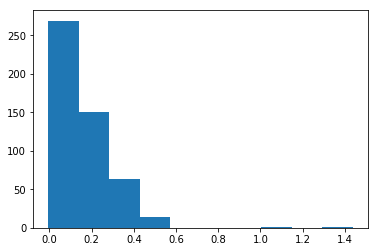

In [295]:
plt.hist(expone_scores2_4)
plt.show()

In [296]:
#下位を見る
expone_scores2_boost = []
for i in range(len(expone_scores2)):
    expone_scores2_boost.append((expone_scores2[i]+0.000213)*5)

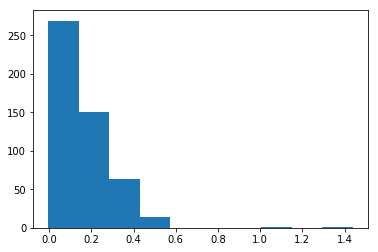

In [297]:
plt.hist(expone_scores2_boost)
plt.show()

In [298]:
df_expone_scores2_boost = pd.DataFrame(expone_scores2_boost)
df_expone_scores2_boost.describe()

,0
count,500.000000
mean,0.165445
std,0.129996
min,-0.003521
25%,0.079796
50%,0.136184
75%,0.223083
max,1.439156


### 個別に減ったのはどれか

In [299]:
all_as_list[0]

[('release_year=1998', -0.48940420549705616),
 ('sex=M', 0.3462906676267931),
 ('Comedy', -0.3356415229818564),
 ('year=1998', -0.20796730780711492),
 ('occupation=programmer', -0.16622769504957993),
 ('user_id=676', -0.021275321032682096),
 ('movie_id=1527', -0.00888909452463506),
 ('age', -3.5297916693395275e-05),
 ('Adventure', 0.0),
 ('Animation', 0.0)]

all_as_list,all_my_as_list,

all_lime_score2,expone_scores2

In [300]:
len(all_lime_score2)


500

In [301]:
expone_scores2_boost_win = []
for i in range(len(all_lime_score2)):
    if all_lime_score2[i] < expone_scores2_boost[i]:
        expone_scores2_boost_win.append("win")
    else:
        expone_scores2_boost_win.append("lose")
expone_scores2_boost_win        

['lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'win',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'win',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'lose',
 'l

In [302]:
win_y = []
lose_y = []
for i in range(len(expone_scores2_boost_win))  :
    if expone_scores2_boost_win[i] =="win":
        print(i)
        win_y.append(expone_scores2_boost[i])
        lose_y.append(all_lime_score2[i])

23
103
269
322
352
427


In [303]:
win_y

[0.3028751246467303,
 1.059045133937359,
 0.3409648312100571,
 0.43233189902345087,
 0.357399636422922,
 1.4391561067693086]

In [304]:
lose_y

[0.2733100141225824,
 0.46414022780686726,
 0.004717860562655551,
 0.0004750457536691899,
 0.0016684704315964582,
 0.4394415572190139]

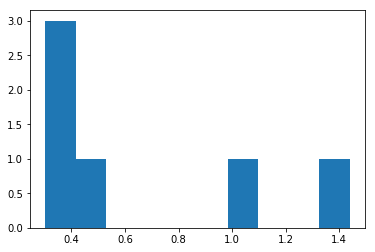

In [305]:
plt.hist(win_y)
plt.show()

In [306]:
df_win = pd.DataFrame(win_y)
df_win.describe()

,0
count,6.000000
mean,0.655295
std,0.477265
min,0.302875
25%,0.345074
50%,0.394866
75%,0.902367
max,1.439156


## 傾向を話す

all_lime_score2,
とりあえず、一番上の変化をみる。

それができたら、全部の値の変化をみる。

In [307]:
len(all_as_list)

500

In [308]:
len(all_my_as_list)

500

In [309]:
top1 = []
age_pear = []
sex_pear = []
user_id_pear = []
movie_id_pear = []
occupation_pear = []
release_year_pear = []
Action_pear = []
Adventure = []
Animation = []
Childrens = []
Comedy = []
Crime = []
Documentary = []
Drama = []
Fantasy = []
FilmNoir = []
Horror = []
Musical = []
Mystery = []
Romance = []
SciFi = []
Thriller = []
War = []
Western = []
year = []
for i in range(len(all_as_list)):
    onelist = all_as_list[i]
    myonelist = all_my_as_list[i]
    if "age" in onelist[0][0]:
        for myitem in myonelist:
            if "age" in myitem[0]:
                age_pear.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "sex" in onelist[0][0]:
        for myitem in myonelist:
            if "sex" in myitem[0]:
                sex_pear.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "user_id" in onelist[0][0]:
        for myitem in myonelist:
            if "user_id" in myitem[0]:
                user_id_pear.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "movie_id" in onelist[0][0]:
        for myitem in myonelist:
            if "movie_id" in myitem[0]:
                movie_id_pear.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "occupation" in onelist[0][0]:
        for myitem in myonelist:
            if "occupation" in myitem[0]:
                occupation_pear.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "release_year" in onelist[0][0]:
        for myitem in myonelist:
            if "release_year" in myitem[0]:
                release_year_pear.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Action" in onelist[0][0]:
        for myitem in myonelist:
            if "Action" in myitem[0]:
                Action_pear.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Adventure" in onelist[0][0]:
        for myitem in myonelist:
            if "Adventure" in myitem[0]:
                Adventure.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Animation" in onelist[0][0]:
        for myitem in myonelist:
            if "Animation" in myitem[0]:
                Animation.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Children's" in onelist[0][0]:
        for myitem in myonelist:
            if "Children's" in myitem[0]:
                Childrens.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Comedy" in onelist[0][0]:
        for myitem in myonelist:
            if "Comedy" in myitem[0]:
                Comedy.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Crime" in onelist[0][0]:
        for myitem in myonelist:
            if "Crime" in myitem[0]:
                Crime.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Documentary" in onelist[0][0]:
        for myitem in myonelist:
            if "Documentary" in myitem[0]:
                Documentary.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Drama" in onelist[0][0]:
        for myitem in myonelist:
            if "Drama" in myitem[0]:
                Drama.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Fantasy" in onelist[0][0]:
        for myitem in myonelist:
            if "Fantasy" in myitem[0]:
                Fantasy.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Drama" in onelist[0][0]:
        for myitem in myonelist:
            if "Drama" in myitem[0]:
                Drama.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Film-Noir" in onelist[0][0]:
        for myitem in myonelist:
            if "Film-Noir" in myitem[0]:
                FilmNoir.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Horror" in onelist[0][0]:
        for myitem in myonelist:
            if "Horror" in myitem[0]:
                Horror.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Musical" in onelist[0][0]:
        for myitem in myonelist:
            if "Musical" in myitem[0]:
                Musical.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Mystery" in onelist[0][0]:
        for myitem in myonelist:
            if "Mystery" in myitem[0]:
                Mystery.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Romance" in onelist[0][0]:
        for myitem in myonelist:
            if "Romance" in myitem[0]:
                Romance.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Sci-Fi" in onelist[0][0]:
        for myitem in myonelist:
            if "Sci-Fi" in myitem[0]:
                SciFi.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Thriller" in onelist[0][0]:
        for myitem in myonelist:
            if "Thriller" in myitem[0]:
                Thriller.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "War" in onelist[0][0]:
        for myitem in myonelist:
            if "War" in myitem[0]:
                War.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    elif "Western" in onelist[0][0]:
        for myitem in myonelist:
            if "Western" in myitem[0]:
                Western.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])
    else:
        for myitem in myonelist:
            if "year" in myitem[0]:
                year.append([i,onelist[0][0],onelist[0][1],myitem[0],myitem[1]])






















            









In [310]:
len(age_pear)

3

In [311]:
len(age_pear)

3

In [312]:
len(sex_pear)

31

In [313]:
movie_id_pear

[]

In [314]:
user_id_pear

[]

In [315]:
len(occupation_pear)

46

In [316]:
release_year_pear

[[0,
  'release_year=1998',
  -0.48940420549705616,
  'release_year=1998',
  -0.011359500539215887],
 [3,
  'release_year=1996',
  -0.5837696594732603,
  'release_year=1996',
  -0.631064261212092],
 [5,
  'release_year=1995',
  -1.8368441774681266,
  'release_year=1995',
  -1.8244647261771152],
 [13,
  'release_year=1994',
  -1.7856989270918855,
  'release_year=1994',
  -0.4740618459075141],
 [16,
  'release_year=1997',
  -0.5456222211408394,
  'release_year=1997',
  -0.09915032967570223],
 [17,
  'release_year=1997',
  -0.6890026825693558,
  'release_year=1997',
  0.05991428504629505],
 [19,
  'release_year=1995',
  -1.9056622618781716,
  'release_year=1995',
  -2.576605859543669],
 [23,
  'release_year=1997',
  -0.3682765345631083,
  'release_year=1997',
  0.3300069796406679],
 [27,
  'release_year=1989',
  1.3589108802955243,
  'release_year=1989',
  0.34838252000732817],
 [28,
  'release_year=1997',
  -0.6070763217855137,
  'release_year=1997',
  -0.3355298809298679],
 [30,
  'rele

In [317]:
len(release_year_pear)

235

In [318]:
len(Action_pear)

10

In [319]:
len(Adventure)

33

In [320]:
len(Animation)

1

In [321]:
len(Childrens)

30

In [322]:
len(Comedy)

7

In [323]:
len(Crime)

4

In [324]:
len(Documentary)

1

In [325]:
len(Drama)

66

In [326]:
len(Fantasy)

0

In [327]:
print(len(FilmNoir))
print(len(Horror))
print(len(Musical))
print(len(Mystery))
print(len(Romance))
print(len(SciFi))
print(len(Thriller))
print(len(War))
print(len(Western))

0
8
0
0
0
2
5
0
0


In [328]:
len(year)

36

In [329]:
year

[[29, 'year=1998', -0.44879513373539026, 'year=1998', 0.22379762431382993],
 [29,
  'year=1998',
  -0.44879513373539026,
  'release_year=1980',
  0.018852790145047545],
 [77, 'year=1998', -0.5968687391909653, 'year=1998', -0.6963407117784599],
 [77,
  'year=1998',
  -0.5968687391909653,
  'release_year=1993',
  -0.10470182347862528],
 [81, 'year=1998', -0.4830642096850524, 'year=1998', -0.017956237131966944],
 [81,
  'year=1998',
  -0.4830642096850524,
  'release_year=1990',
  -0.014157340853769325],
 [108, 'year=1997', -0.2646277619803284, 'year=1997', -0.2732982175463451],
 [108,
  'year=1997',
  -0.2646277619803284,
  'release_year=1979',
  0.042788197288553695],
 [112, 'year=1998', -0.38293611249203224, 'year=1998', 0.14289557569993208],
 [112,
  'year=1998',
  -0.38293611249203224,
  'release_year=1950',
  0.05420293263035701],
 [186,
  'year=1998',
  -0.6048289555512798,
  'release_year=1954',
  0.6840742336625191],
 [186, 'year=1998', -0.6048289555512798, 'year=1998', -0.5376791

# 反省
execを使えばいいらしい。


In [330]:
hogenames = ["hoge","fuga"]

for tmp in hogenames:
    exec("{} = {}".format(tmp, len(tmp)))

In [331]:
hoge

4

# もう一度確認する

In [336]:
print("top1\t{}".format(len(top1)))
print("ag\t{}".format(len(age_pear)))
print("user_id\t{}".format(len(user_id_pear)))
print("movie_id\t{}".format(len(movie_id_pear)))
print("occupation\t{}".format(len(occupation_pear)))
print("release_year\t{}".format(len(release_year_pear)))
print("Action\t{}".format(len(Action_pear)))
print("Adventure\t{}".format(len(Adventure)))
print("Animation\t{}".format(len(Animation)))
print("Childrens\t{}".format(len(Childrens)))
print("Comedy\t{}".format(len(Comedy)))
print("Crime\t{}".format(len(Crime)))
print("Documentary\t{}".format(len(Documentary)))
print("Drama\t{}".format(len(Drama)))
print("Fantasy\t{}".format(len(Fantasy)))
print("FilmNoir\t{}".format(len(FilmNoir)))
print("Horror\t{}".format(len(Horror)))
print("Musical\t{}".format(len(Musical)))
print("Mystery\t{}".format(len(Mystery)))
print("Romance\t{}".format(len(Romance)))
print("SciFi\t{}".format(len(SciFi)))
print("Thriller\t{}".format(len(Thriller)))
print("War\t{}".format(len(War)))
print("Western\t{}".format(len(Western)))
print("year\t{}".format(len(year)))


top1	0
age_pear	3
user_id_pear	0
movie_id_pear	0
occupation_pear	46
release_year_pear	235
Action_pear	10
Adventure	33
Animation	1
Childrens	30
Comedy	7
Crime	4
Documentary	1
Drama	66
Fantasy	0
FilmNoir	0
Horror	8
Musical	0
Mystery	0
Romance	0
SciFi	2
Thriller	5
War	0
Western	0
year	36
